In [1]:
# Dataset: https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis

#### INDICE
- 
- 
- 
- 

## 1. Entender el **PROBLEMA DE NEGOCIO** y trasladarlo a un **PROBLEMA TÉCNICO**

In [ ]:
# Primer problema, la empresa quiere hacer perfiles de sus clientes, para poder clasificarlos y enfocar las campañas de marketing
# 1º Problema técnico: categorización - clustering

## 2. Decidir el **TIPO DE PROBLEMA** (a predecir)

In [ ]:
# 1º No supervisado / categorización -> clustering

## Importando Librerias

In [4]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

# Preprocesado
from sklearn.preprocessing import StandardScaler, LabelEncoder, OneHotEncoder, OrdinalEncoder, MinMaxScaler
from datetime import datetime

# Modelado
from sklearn.metrics import silhouette_score,  mean_squared_error, root_mean_squared_error, r2_score, mean_absolute_percentage_error
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV, GridSearchCV
from sklearn.ensemble import RandomForestRegressor 
from sklearn.linear_model import Lasso, Ridge
from catboost import CatBoostRegressor
import xgboost as xgb
import lightgbm as lgb

# GRAFICOS
import plotly.express as px
import matplotlib.colors as mcolors

# PIPES
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer

# Utils
import sys
sys.path.append('../utils')  # Ruta relativa a la carpeta utils
import bootcampviztools as bt


from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib as mpl


import warnings
warnings.filterwarnings('ignore')

## 3. Acceder a **DATOS**, **VISUALIZACIÓN** y **EXPLORACIÓN**

In [5]:
# Abro dataset
df = pd.read_csv("../data_sample/marketing_campaign.csv", sep = ";")
df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04/09/2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08/03/2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21/08/2013,26,426,...,4,0,0,0,0,0,0,3,11,0


In [6]:
# Primer vistazo
df.info(show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

In [7]:
bt.tipifica_variable_plus(df)

Umbral de 'CARD_valores_unicos' para considerarla 'Categórica':  10
Umbral de 'CARD_%' para considerarla 'Numérica Continua':  30.0


,Variable,Missings_%,Dtype_real,CARD_valores_unicos,CARD_%,Dtype_sugerido
0,ID,0.00,int64,2240,100.00,Numérica Continua
1,Year_Birth,0.00,int64,59,2.63,Numérica Discreta
2,Education,0.00,object,5,0.22,Categórica
3,Marital_Status,0.00,object,8,0.36,Categórica
4,Income,1.07,float64,1974,88.12,Numérica Continua
5,Kidhome,0.00,int64,3,0.13,Categórica
6,Teenhome,0.00,int64,3,0.13,Categórica
7,Dt_Customer,0.00,object,663,29.60,Numérica Discreta
8,Recency,0.00,int64,100,4.46,Numérica Discreta
9,MntWines,0.00,int64,776,34.64,Numérica Continua


| Columna/Variable    | Descripción                         | Tipo de variable  |  Nota                                        |
|---------------------|-------------------------------------|-------------------|----------------------------------------------|
| ID                  | Identificador único del cliente     |  Numérica         |  Poco util. Solo para identificar            |
| Year_Birth          | Año de nacimiento                   |  Numérica         |  Obtener edad (años)                         |
| Education           | Nivel educativo                     |  Categórica       |  Consultar equivalencias                     |
| Marital_Status      | Estado civil                        |  Categórica       |  Para hipotesis derivadas                    |
| Income              | Ingresos anuales                    |  Numérica         |  Tiene valores nulos ($ anual seguramente)   |
| Kidhome             | Número de niños (0-12) en el hogar  |  Numérica         |  Interesante para patrones de gastos         |
| Teenhome            | Número de adolescentes (13-19)      |  Numérica         |  Interesante para patrones de gastos         |
| Dt_Customer         | Fecha en la que se unió el cliente  |  Fecha            |  Mide la antiguedad                          |
| Recency             | Días desde la última compra         |  Numérica         |  Esencial para evaluar retención de clientes |
| MntWines            | Gasto en ultimos 2 años, en vinos   |  Numérica         |  Info directa sobre habito de compra ($)     |
| MntFruits           | Idem, en frutas                     |  Numérica         |  Info directa sobre habito de compra ($)     |
| MntMeatProducts     | Idem, en productos cárnicos         |  Numérica         |  Info directa sobre habito de compra ($)     |
| MntFishProducts     | Idem, en productos de pescado       |  Numérica         |  Info directa sobre habito de compra ($)     |
| MntSweetProducts    | Idem en dulces                      |  Numérica         |  Info directa sobre habito de compra ($)     |
| MntGoldProds        | Idem en productos de marca          |  Numérica         |  Info directa sobre habito de compra ($)     |
| NumDealsPurchases   | Compras con descuento               |  Numérica         |  Respuesta a los cambios de precio           |
| NumWebPurchases     | Compras a través de la web          |  Numérica         |  Interesante como info sobre canal de venta  |
| NumCatalogPurchases | Compras a través de catálogo        |  Numérica         |  Interesante como info sobre canal de venta  |
| NumStorePurchases   | Compras en tienda física            |  Numérica         |  Interesante como info sobre canal de venta  |
| NumWebVisitsMonth   | Visitas web en el último mes        |  Numérica         |  Interesante como info sobre canal de venta  |
| AcceptedCmp3        | Aceptó campaña 3                    |  Binaria          |  Mide respuesta a campañas de Marketing      |
| AcceptedCmp4        | Aceptó campaña 4                    |  Binaria          |  Mide respuesta a campañas de Marketing      |    
| AcceptedCmp5        | Aceptó campaña 5                    |  Binaria          |  Mide respuesta a campañas de Marketing      |
| AcceptedCmp1        | Aceptó campaña 1                    |  Binaria          |  Mide respuesta a campañas de Marketing      |
| AcceptedCmp2        | Aceptó campaña 2                    |  Binaria          |  Mide respuesta a campañas de Marketing      | 
| Complain            | Presentó alguna queja               |  Binaria          |  Mide respuesta a campañas de Marketing      |
| Z_CostContact       | Desconocido                         |                   |  ¿Qué representa?                            |
| Z_Revenue           | Desconocido                         |                   |  ¿Qué representa?                            |
| Response            | Respondió a la última campaña       |  Binaria          |  Mide interes reciente                       |

In [8]:
# Lista de excluidas
exclude = [] 

# Funcion para agregar y visualizar la lista
def add_to_exclude(*name_cols):
    for name_col in name_cols:
        if name_col not in exclude:
            exclude.append(name_col)
    print("Excluidas: ", exclude)

add_to_exclude("Z_CostContact", "Z_Revenue")

Excluidas:  ['Z_CostContact', 'Z_Revenue']


## 4. **Data cleaning**

- Limpieza de datos, tratamiento de valores nulos y outliers, creación de nuevas columnas, tipo de columna, renombre y orden...

### 4.1. Features analisys

#### A) *people* features

##### - 'ID'

- Cardinalidad del 100% así que la añado a la lista de exluidas para ser borrada

In [9]:
add_to_exclude("ID")

Excluidas:  ['Z_CostContact', 'Z_Revenue', 'ID']


##### - 'Year_Birth' ('Age')

- En vez de hablar de año de nacimiento, tiene mas sentido hablar de edad, por ello se crea una columna nueva a partir de la anterior
- Se investigan outlier y su tratamiento

In [10]:
# Valores de la columna 'Year_Birth'
print("Valores columna 'Year_Birth': \n", df.Year_Birth.unique(), "\n")

# nueva Columna edad
df["Age"] = datetime.now().year - df["Year_Birth"] # datetime.now().year = Año actual [2025]

# Comprobar que todas las edades son correctas
print("Valores columna 'Age': \n", df.Age.unique(), "\n")

Valores columna 'Year_Birth': 
 [1957 1954 1965 1984 1981 1967 1971 1985 1974 1950 1983 1976 1959 1952
 1987 1946 1980 1949 1982 1979 1951 1969 1986 1989 1963 1970 1973 1943
 1975 1996 1968 1964 1977 1978 1955 1966 1988 1948 1958 1972 1960 1945
 1991 1962 1953 1961 1956 1992 1900 1893 1990 1947 1899 1993 1994 1941
 1944 1995 1940] 

Valores columna 'Age': 
 [ 68  71  60  41  44  58  54  40  51  75  42  49  66  73  38  79  45  76
  43  46  74  56  39  36  62  55  52  82  50  29  57  61  48  47  70  59
  37  77  67  53  65  80  34  63  72  64  69  33 125 132  35  78 126  32
  31  84  81  30  85] 



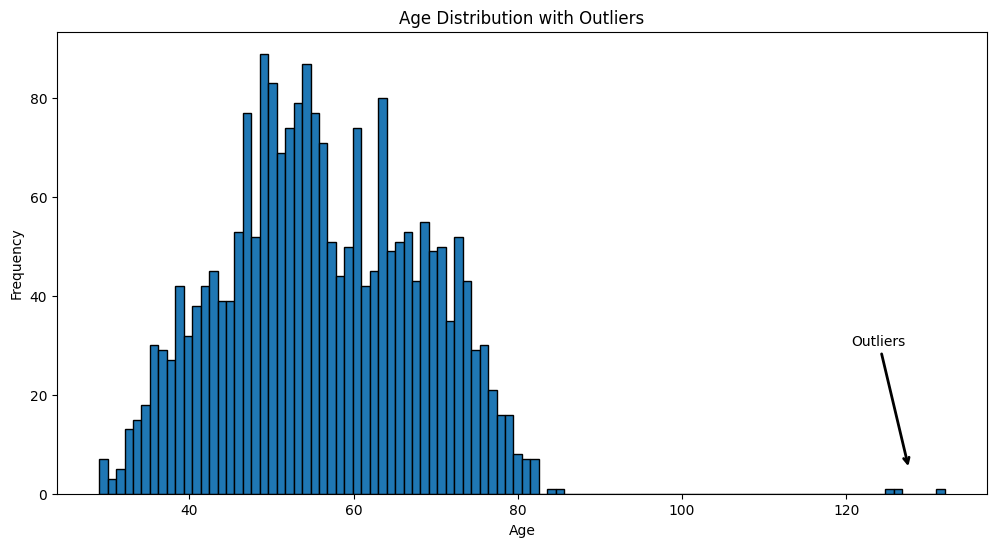

In [11]:
plt.figure(figsize=(12, 6))
df['Age'].hist(bins=100, grid=False, edgecolor="black")

# Identificar el percentil 99 para marcar los outliers
outlier_age_max = df["Age"].quantile(0.9999)

# Agregar flecha para señalar los outliers
plt.annotate(
    "Outliers", 
    xy=(outlier_age_max-3, 5),  # Coordenadas (x, y)
    xytext=(outlier_age_max-10, 30),  # Posición del texto
    arrowprops=dict(facecolor="red", arrowstyle="->", lw=2)
)

plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Age Distribution with Outliers")
plt.show()

In [12]:
# Num de outliers o edades sin sentido
outliers_age = df[df["Age"] > 85]
print(outliers_age["Age"].value_counts())
df[df["Age"] > 85]

Age
125    1
132    1
126    1
Name: count, dtype: int64


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
192,7829,1900,2n Cycle,Divorced,36640.0,1,0,26/09/2013,99,15,...,0,0,0,0,0,1,3,11,0,125
239,11004,1893,2n Cycle,Single,60182.0,0,1,17/05/2014,23,8,...,0,0,0,0,0,0,3,11,0,132
339,1150,1899,PhD,Together,83532.0,0,0,26/09/2013,36,755,...,0,0,1,0,0,0,3,11,0,126


- Le imputaré la mediana (que difiere poco de la media)

In [13]:
print(df.Age.describe())

count    2240.000000
mean       56.194196
std        11.984069
min        29.000000
25%        48.000000
50%        55.000000
75%        66.000000
max       132.000000
Name: Age, dtype: float64


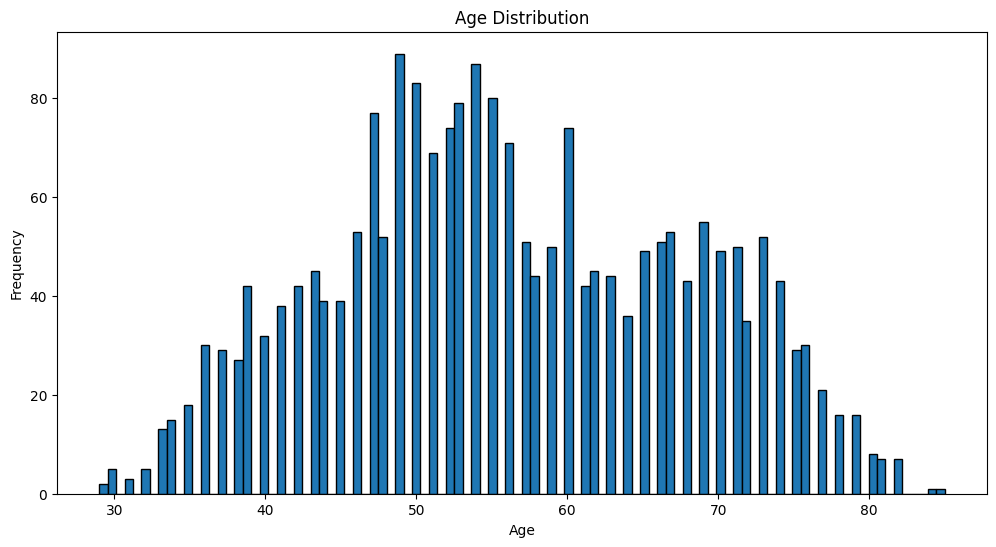

In [14]:
# Imputo con la mediana
median_age = df["Age"].median()
df.loc[df["Age"] > 85, "Age"] = median_age

# Representacion
plt.figure(figsize=(12, 6))
df['Age'].hist(bins=100, grid=False, edgecolor="black")
plt.xlabel("Age")
plt.ylabel("Frequency")
plt.title("Age Distribution")
plt.show()

In [15]:
add_to_exclude("Year_Birth")

Excluidas:  ['Z_CostContact', 'Z_Revenue', 'ID', 'Year_Birth']


##### - 'Education'

- Agrupo las clases y disminuyo categorias
- Cuando las transforme debo ordenarlas numéricamente

In [16]:
df["Education"].value_counts()

Education
Graduation    1127
PhD            486
Master         370
2n Cycle       203
Basic           54
Name: count, dtype: int64

In [17]:
# Simplifico y agrupo las categorias de Education
df["Education"] = df["Education"].replace({"Basic":"Undergraduate",
                                                 "2n Cycle":"Undergraduate", 
                                                 "Graduation":"Graduate", 
                                                 "Master":"Postgraduate", 
                                                 "PhD":"Postgraduate"})
df["Education"].value_counts()

Education
Graduate         1127
Postgraduate      856
Undergraduate     257
Name: count, dtype: int64

##### - 'Marital_Status'

- Algunas clases se pueden agrupar
- Cuando las transforme debo ordenarlas numéricamente
- Algunas clases extrañas. Se pueden imputar(o borrar)

In [18]:
df["Marital_Status"].value_counts()

Marital_Status
Married     864
Together    580
Single      480
Divorced    232
Widow        77
Alone         3
Absurd        2
YOLO          2
Name: count, dtype: int64

In [19]:
# Agrupo las categorias en Together y Single
df["Marital_Status"] = df["Marital_Status"].replace(["Married", "Together"],"Couple")
df["Marital_Status"] = df["Marital_Status"].replace(["Divorced", "Widow", "Alone"],"Single")

df["Marital_Status"].value_counts()

Marital_Status
Couple    1444
Single     792
Absurd       2
YOLO         2
Name: count, dtype: int64

In [20]:
df.loc[(df["Marital_Status"] == "Absurd") | (df["Marital_Status"] == "YOLO")]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
2093,7734,1993,Graduate,Absurd,79244.0,0,0,19/12/2012,58,471,...,0,0,1,1,0,0,3,11,1,32
2134,4369,1957,Postgraduate,Absurd,65487.0,0,0,10/01/2014,48,240,...,0,0,0,0,0,0,3,11,0,68
2177,492,1973,Postgraduate,YOLO,48432.0,0,1,18/10/2012,3,322,...,0,0,0,0,0,0,3,11,0,52
2202,11133,1973,Postgraduate,YOLO,48432.0,0,1,18/10/2012,3,322,...,0,0,0,0,0,0,3,11,1,52


- Como son pocos, lso borro directamente. Además, una fila parece duplicada (salvo por el valor response)

In [21]:
values_to_drop = df[(df["Marital_Status"] == "Absurd") | (df["Marital_Status"] == "YOLO")].index
df.drop(index=values_to_drop, inplace=True)

df["Marital_Status"].value_counts()

Marital_Status
Couple    1444
Single     792
Name: count, dtype: int64

##### - 'Income'

- Contiene valores NaN (borrar o imputar)
- Outliers

In [22]:
# Descripción de la columna 'Income'
income_description = df['Income'].describe()

# Añadir valores NaN y tipo de columna a la descripción
income_description['NaN'] = df['Income'].isnull().sum()
income_description['Dtype'] = df['Income'].dtype

# Mostrar la descripción en un DataFrame
income_description.to_frame().T

,count,mean,std,min,25%,50%,75%,max,NaN,Dtype
Income,2212.0,52232.51085,25187.455359,1730.0,35233.5,51381.5,68522.0,666666.0,24.0,float64


- Voy a realizar una imputación sobre caso similar, respecto la columna 'Education'

In [23]:
income_mean_undergraduate = df[df["Education"] == "Undergraduate" ]["Income"].mean()
income_mean_graduate = df[df["Education"] == "Graduate" ]["Income"].mean()
income_mean_postgraduate = df[df["Education"] == "Postgraduate" ]["Income"].mean()

print("Media de ingresos para grupo 'Undergraduate': ", round(income_mean_undergraduate,2))
print("Media de ingresos para grupo 'Graduate': ", round(income_mean_graduate,2))
print("Media de ingresos para grupo 'Postgraduate': ", round(income_mean_postgraduate,2))

Media de ingresos para grupo 'Undergraduate':  41823.53
Media de ingresos para grupo 'Graduate':  52696.59
Media de ingresos para grupo 'Postgraduate':  54754.98


In [24]:
# Imputo NaN por la media correspondiente a cada grupo de Education
df.loc[(df['Education'] == 'Undergraduate') & (df['Income'].isna()), 'Income'] = income_mean_undergraduate
df.loc[(df['Education'] == 'Graduate') & (df['Income'].isna()), 'Income'] = income_mean_graduate
df.loc[(df['Education'] == 'Postgraduate') & (df['Income'].isna()), 'Income'] = income_mean_postgraduate

# Numero de valores NaN restantes
df["Income"].isna().sum()

0

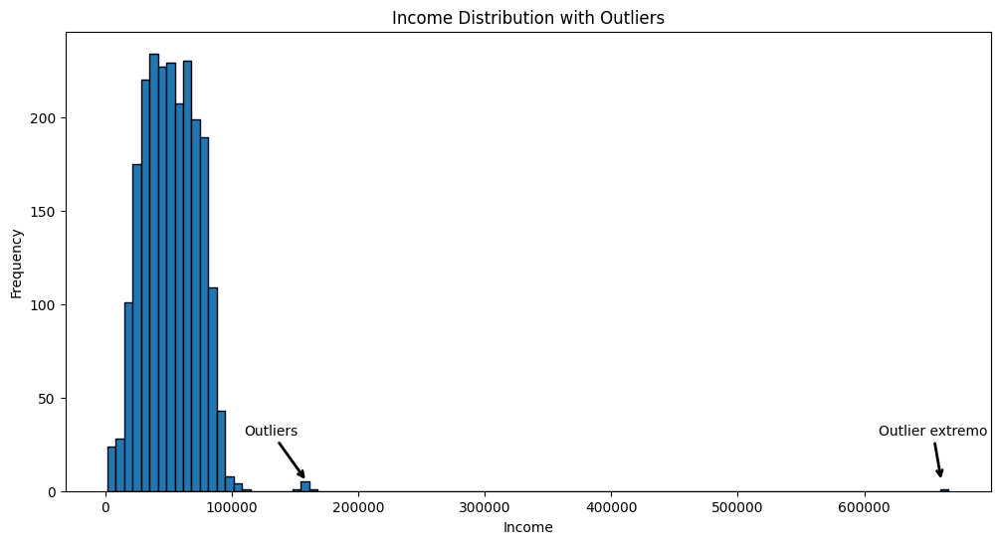

In [25]:
plt.figure(figsize=(12, 6))
df['Income'].hist(bins=100, grid=False, edgecolor="black")

# Identificar el percentil 99 para marcar los outliers
outlier_income = df["Income"].quantile(0.9989)
outlier_income_ext = df["Income"].quantile(0.999995)

# Agregar flecha para señalar los outliers
plt.annotate(
    "Outliers", 
    xy=(outlier_income, 5),  # Coordenadas (x, y)
    xytext=(outlier_income - 50000, 30),  # Posición del texto
    arrowprops=dict(facecolor="red", arrowstyle="->", lw=2)
)

# Agregar flecha para señalar los outliers extremos
plt.annotate(
    "Outlier extremo", 
    xy=(outlier_income_ext, 5),  # Coordenadas (x, y)
    xytext=(outlier_income_ext - 50000, 30),  # Posición del texto
    arrowprops=dict(facecolor="red", arrowstyle="->", lw=2)
)

plt.xlabel("Income")
plt.ylabel("Frequency")
plt.title("Income Distribution with Outliers")
plt.show()


In [26]:
# Num de outliers o edades sin sentido
outliers_income = df[df["Income"] > 115000]
print(outliers_income["Income"].value_counts(sort=True).sort_index(ascending=False))

Income
666666.0    1
162397.0    1
160803.0    1
157733.0    1
157243.0    1
157146.0    1
156924.0    1
153924.0    1
Name: count, dtype: int64


- Imputo solo el valor extremo, de la misma forma que antes. Los otros outliers lo puedo transformar logaritmicamente luego

In [27]:
df.loc[df["Income"] > 200000]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
2233,9432,1977,Graduate,Couple,666666.0,1,0,02/06/2013,23,9,...,0,0,0,0,0,0,3,11,0,48


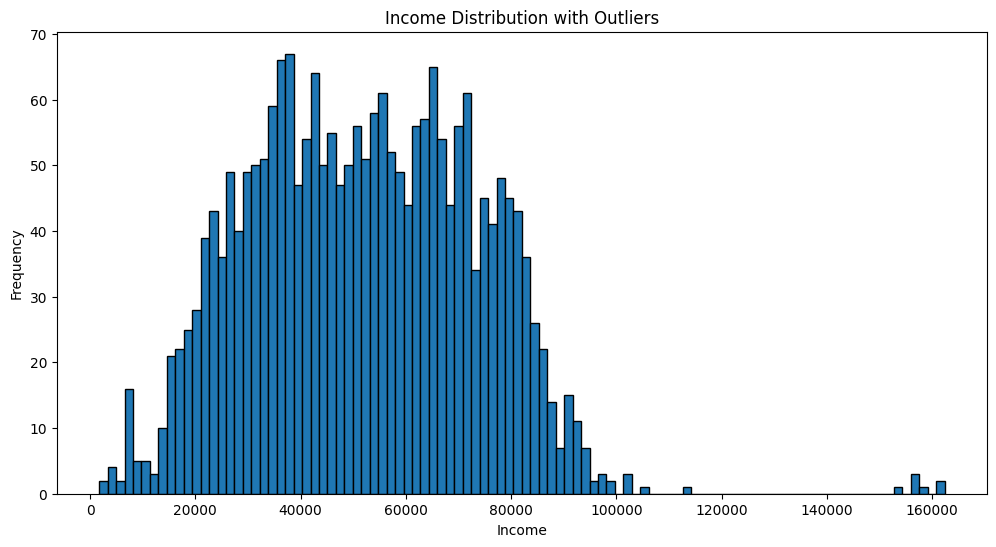

In [28]:
# Imputo con la mediana
df.loc[df["Income"] > 200000, "Income"] = income_mean_graduate

# Representacion
plt.figure(figsize=(12, 6))
df['Income'].hist(bins=100, grid=False, edgecolor="black")
plt.xlabel("Income")
plt.ylabel("Frequency")
plt.title("Income Distribution with Outliers")
plt.show()

##### - 'Kidhome' , 'Teenhome' ('Children')

- Ambas columnas se podrían tratar como una única que trata el número de hijos

In [29]:
print(df.Kidhome.value_counts(), "\n")
print(df.Teenhome.value_counts())

Kidhome
0    1289
1     899
2      48
Name: count, dtype: int64 

Teenhome
0    1156
1    1028
2      52
Name: count, dtype: int64


In [30]:
# Nueva columna "Children" definiendo el numero de hijos
df["Children"] = df["Kidhome"] + df["Teenhome"]
print(df.Children.value_counts())
pd.crosstab(df["Kidhome"], df["Teenhome"])

Children
1    1126
0     636
2     421
3      53
Name: count, dtype: int64


Teenhome,0,1,2
Kidhome,,,
0,636,623,30
1,503,374,22
2,17,31,0


In [31]:
# Añado a exclude
add_to_exclude("Kidhome", "Teenhome")

Excluidas:  ['Z_CostContact', 'Z_Revenue', 'ID', 'Year_Birth', 'Kidhome', 'Teenhome']


##### - 'Dt_Customer' ('Client_for')

- Convertir a formato fecha
- Nueva columna, usando los dias desde que es cliente

In [32]:
df["Dt_Customer"].describe()

count           2236
unique           663
top       31/08/2012
freq              12
Name: Dt_Customer, dtype: object

In [33]:
# Conversion a formato fecha
df["Dt_Customer"] = pd.to_datetime(df["Dt_Customer"], dayfirst=True, errors='coerce') #  la columna a tipo fecha con dayfirst=True
print(df["Dt_Customer"])

0      2012-09-04
1      2014-03-08
2      2013-08-21
3      2014-02-10
4      2014-01-19
          ...    
2235   2013-06-13
2236   2014-06-10
2237   2014-01-25
2238   2014-01-24
2239   2012-10-15
Name: Dt_Customer, Length: 2236, dtype: datetime64[ns]


In [34]:
print("Newest date:", df["Dt_Customer"].max().date())
print("Oldest date:", df["Dt_Customer"].min().date())

Newest date: 2014-06-29
Oldest date: 2012-07-30


In [35]:
# Nueva columna
df["Client_for"] = (df["Dt_Customer"].max() - df["Dt_Customer"]).dt.days # indica cuántos días lleva el cliente registrado
df["Client_for"]

0       663
1       113
2       312
3       139
4       161
       ... 
2235    381
2236     19
2237    155
2238    156
2239    622
Name: Client_for, Length: 2236, dtype: int64

In [36]:
add_to_exclude("Dt_Customer")

Excluidas:  ['Z_CostContact', 'Z_Revenue', 'ID', 'Year_Birth', 'Kidhome', 'Teenhome', 'Dt_Customer']


##### - 'Recency'

- Recency: Dias desde la última compra
- Nada a realizar

In [37]:
df.Recency.unique()

array([58, 38, 26, 94, 16, 34, 32, 19, 68, 11, 59, 82, 53, 23, 51, 20, 91,
       86, 41, 42, 63,  0, 69, 89,  4, 96, 56, 31,  8, 55, 37, 76, 99,  3,
       88, 80, 72, 24, 92, 39, 29,  2, 54, 57, 30, 12, 18, 75, 90,  1, 25,
       40,  9, 87,  5, 95, 48, 70, 79, 45, 84, 44, 43, 35, 15, 17, 46, 27,
       74, 85, 65, 13, 83, 10, 21, 61, 73, 47, 36, 49, 28, 64, 98, 78, 77,
       81, 14, 52, 93, 50, 60, 66, 97, 62,  6, 33, 67, 22, 71,  7],
      dtype=int64)

##### - 'Complain'

- Quejas en los ultimos 2 años (0 : NO , 1: YES)

In [38]:
df.Complain.value_counts()

Complain
0    2215
1      21
Name: count, dtype: int64

##### - ('Family_size')

In [39]:
# Nueva columna "Family_Size" definiendo el numero de miembros en la familia
df["Family_Size"] = df["Children"] + (df["Marital_Status"].replace({"Single": 1, "Couple":2}))
print(df.Family_Size.value_counts())

Family_Size
3    889
2    762
4    301
1    252
5     32
Name: count, dtype: int64


#### B) *products* features

##### - "MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"

- Todas tienen una distribución similar
- Crear nueva columna con total de gastos
- Checkeo que no haya datos erroneos (cero en total de gastos)

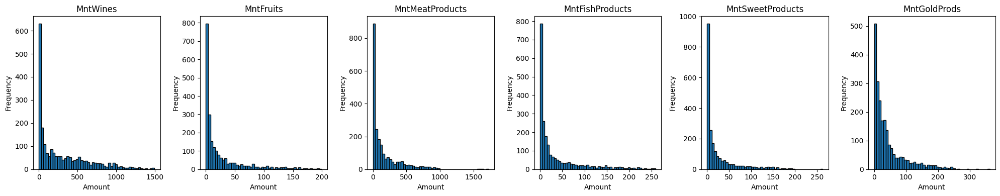

In [40]:
products = ["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"]

fig, axes = plt.subplots(1, len(products), figsize=(20, 4))  # Una fila, tantas columnas como features

for col, ax in zip(products, axes):
    ax.hist(df[col], bins=50, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Amount")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

##### - ('Total_Spent')

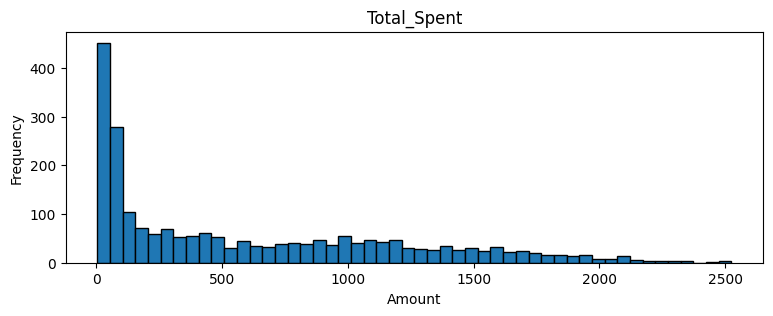

In [41]:
# Nueva columna con el total gastado 
df["Total_Spent"] = df[["MntWines", "MntFruits", "MntMeatProducts", "MntFishProducts", "MntSweetProducts", "MntGoldProds"]].sum(axis=1) # Axis 1 (suma por filas)

plt.figure(figsize=(9,3))
plt.hist(df["Total_Spent"], bins=50, edgecolor="black")
plt.xlabel("Amount")
plt.ylabel("Frequency")
plt.title("Total_Spent")
plt.show()

In [42]:
# Comprobación de que siempre se ha comprado algo
df.loc[(df['Total_Spent'] == 0)]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age,Children,Client_for,Family_Size,Total_Spent


##### - ('Avg_purcharse')

In [43]:
# Nueva columna, para el promedio de gasto por compra
df["Avg_purcharse"] = round(df["Total_Spent"] / (df["NumWebPurchases"] + df["NumCatalogPurchases"] + df["NumStorePurchases"]),3)
df.head(3)

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,Age,Children,Client_for,Family_Size,Total_Spent,Avg_purcharse
0,5524,1957,Graduate,Single,58138.0,0,0,2012-09-04,58,635,...,0,3,11,1,68,0,663,1,1617,73.50
1,2174,1954,Graduate,Single,46344.0,1,1,2014-03-08,38,11,...,0,3,11,0,71,2,113,3,27,6.75
2,4141,1965,Graduate,Couple,71613.0,0,0,2013-08-21,26,426,...,0,3,11,0,60,0,312,2,776,38.80


#### C) *place* features

##### - "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases", "NumWebVisitsMonth"

- Outliers, pero dentro de lo normal (posibles transformaciones logarítimicas en la fase de feature engineering)
- Checkeo datos erroneos (cero en gasto en todas los canales de compra)

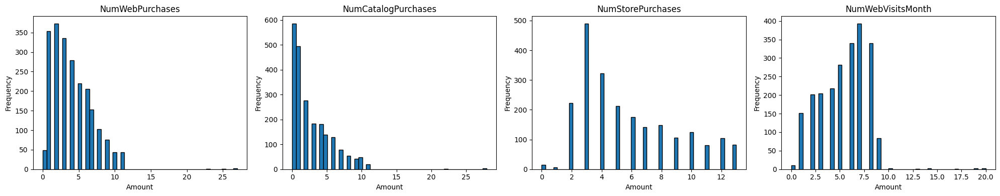

In [44]:
purchases = ["NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases","NumWebVisitsMonth"]

fig, axes = plt.subplots(1, len(purchases), figsize=(20, 4))  # Una fila, tantas columnas como features

for col, ax in zip(purchases, axes):
    ax.hist(df[col], bins=50, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Amount")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [45]:
df[purchases].describe()

,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
count,2236.000000,2236.000000,2236.000000,2236.000000
mean,4.082737,2.659213,5.789356,5.317531
std,2.779736,2.920752,3.253756,2.424756
min,0.000000,0.000000,0.000000,0.000000
25%,2.000000,0.000000,3.000000,3.000000
50%,4.000000,2.000000,5.000000,6.000000
75%,6.000000,4.000000,8.000000,7.000000
max,27.000000,28.000000,13.000000,20.000000


- Checkeo datos erroneos: Seis clientes no han realizado compras por ningun canal, por lo que es mejor borrarlos.

In [46]:
# Checkeo
df.loc[(df['NumWebPurchases'] == 0) & (df['NumCatalogPurchases'] == 0) & (df['NumStorePurchases'] == 0), purchases]

,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth
655,0,0,0,0
981,0,0,0,14
1245,0,0,0,20
1524,0,0,0,14
1846,0,0,0,19
2132,0,0,0,0


In [47]:
# Eliminación de seis filas erroneas
values_to_drop_2 = df[(df['NumWebPurchases'] == 0) & (df['NumCatalogPurchases'] == 0) & (df['NumStorePurchases'] == 0)].index
df.drop(index=values_to_drop_2, inplace=True)
df

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,Complain,Z_CostContact,Z_Revenue,Response,Age,Children,Client_for,Family_Size,Total_Spent,Avg_purcharse
0,5524,1957,Graduate,Single,58138.0,0,0,2012-09-04,58,635,...,0,3,11,1,68,0,663,1,1617,73.500
1,2174,1954,Graduate,Single,46344.0,1,1,2014-03-08,38,11,...,0,3,11,0,71,2,113,3,27,6.750
2,4141,1965,Graduate,Couple,71613.0,0,0,2013-08-21,26,426,...,0,3,11,0,60,0,312,2,776,38.800
3,6182,1984,Graduate,Couple,26646.0,1,0,2014-02-10,26,11,...,0,3,11,0,41,1,139,3,53,8.833
4,5324,1981,Postgraduate,Couple,58293.0,1,0,2014-01-19,94,173,...,0,3,11,0,44,1,161,3,422,30.143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduate,Couple,61223.0,0,1,2013-06-13,46,709,...,0,3,11,0,58,1,381,3,1341,83.812
2236,4001,1946,Postgraduate,Couple,64014.0,2,1,2014-06-10,56,406,...,0,3,11,0,79,3,19,5,444,29.600
2237,7270,1981,Graduate,Single,56981.0,0,0,2014-01-25,91,908,...,0,3,11,0,44,0,155,1,1241,68.944
2238,8235,1956,Postgraduate,Couple,69245.0,0,1,2014-01-24,8,428,...,0,3,11,0,69,1,156,3,843,40.143


#### D) *promotion* features

##### "NumDealsPurchases", "AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"

- NumDealsPurchases, compras realizadas con descuento u oferta  (posibles transformaciones logarítimicas en la fase de feature engineering)
- Promoción aceptó la oferta en camapaña num_X  (0: NO , 1 : SI)
- Response, aceptó la ultima oferta (0: NO , 1 : SI)
- Sin accion

In [48]:
df.Response.value_counts()

Response
0    1898
1     332
Name: count, dtype: int64

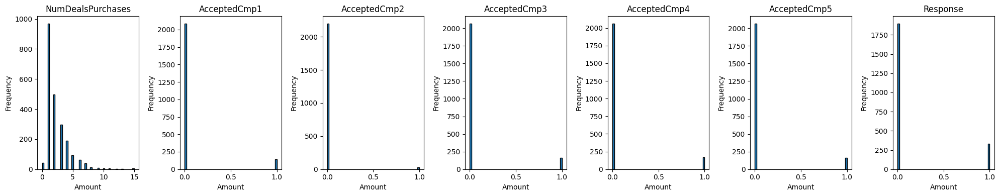

In [49]:
promotion = ["NumDealsPurchases", "AcceptedCmp1", "AcceptedCmp2", "AcceptedCmp3", "AcceptedCmp4", "AcceptedCmp5", "Response"]

fig, axes = plt.subplots(1, len(promotion), figsize=(20, 4))  # Una fila, tantas columnas como features

for col, ax in zip(promotion, axes):
    ax.hist(df[col], bins=50, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Amount")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [50]:
df[promotion].describe()

,NumDealsPurchases,AcceptedCmp1,AcceptedCmp2,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,Response
count,2230.000000,2230.000000,2230.000000,2230.000000,2230.000000,2230.000000,2230.000000
mean,2.315695,0.064126,0.013453,0.073094,0.074888,0.072646,0.148879
std,1.894450,0.245031,0.115230,0.260349,0.263269,0.259612,0.356049
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,15.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


##### - ('Total_Campaigns_Accepted')

In [51]:
df["Total_Campaigns_Accepted"] = df["AcceptedCmp1"] + df["AcceptedCmp2"] + df["AcceptedCmp3"] + df["AcceptedCmp4"] + df["AcceptedCmp5"] + df["Response"]
df["Total_Campaigns_Accepted"].value_counts()

Total_Campaigns_Accepted
0    1623
1     369
2     142
3      50
4      36
5      10
Name: count, dtype: int64

### 4.2. Dropping Columns, Renaming and Reordering Features

In [52]:
print(exclude)
df_backup_V1 = df.copy()

# Borrado de las columnas a excluir
df = df.drop(columns=exclude, axis=1)
df.head(5)

['Z_CostContact', 'Z_Revenue', 'ID', 'Year_Birth', 'Kidhome', 'Teenhome', 'Dt_Customer']


,Education,Marital_Status,Income,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,...,AcceptedCmp2,Complain,Response,Age,Children,Client_for,Family_Size,Total_Spent,Avg_purcharse,Total_Campaigns_Accepted
0,Graduate,Single,58138.0,58,635,88,546,172,88,88,...,0,0,1,68,0,663,1,1617,73.500,1
1,Graduate,Single,46344.0,38,11,1,6,2,1,6,...,0,0,0,71,2,113,3,27,6.750,0
2,Graduate,Couple,71613.0,26,426,49,127,111,21,42,...,0,0,0,60,0,312,2,776,38.800,0
3,Graduate,Couple,26646.0,26,11,4,20,10,3,5,...,0,0,0,41,1,139,3,53,8.833,0
4,Postgraduate,Couple,58293.0,94,173,43,118,46,27,15,...,0,0,0,44,1,161,3,422,30.143,0


In [53]:
people_dict = {
    "Age": "Age",
    "Education": "Education",
    "Income": "Income",
    "Marital_Status": "Status",
    "Children": "Children",
    "Family_Size": "Fam_size",
    "Client_for": "Client_days",
    "Recency": "Recency",
    "Complain": "Complain"
}

products_dict = {
    "MntWines": "Wines",
    "MntFruits": "Fruits",
    "MntMeatProducts": "Meat",
    "MntFishProducts": "Fish",
    "MntSweetProducts": "Sweets",
    "MntGoldProds": "Gold",
    "Total_Spent": "Total_spent",
    "Avg_purcharse": "Avg_buy"
}

place_dict = {
    "NumWebPurchases": "Web",
    "NumCatalogPurchases": "Catalog",
    "NumStorePurchases": "Store",
    "NumWebVisitsMonth": "WebVisits"
}

promotion_dict = {
    "NumDealsPurchases": "Deals",
    "AcceptedCmp1": "Cmp1",
    "AcceptedCmp2": "Cmp2",
    "AcceptedCmp3": "Cmp3",
    "AcceptedCmp4": "Cmp4",
    "AcceptedCmp5": "Cmp5",
    "Response": "Response",
    "Total_Campaigns_Accepted": "Total_cmp"
}

# Renombrar primero las columnas y luego reordenar
df = df.rename(columns={**people_dict, **products_dict, **place_dict, **promotion_dict})

# Extraer listas de nombres renombrados
people = list(people_dict.values())
products = list(products_dict.values())
place = list(place_dict.values())
promotion = list(promotion_dict.values())

# Reordenar columnas según el orden deseado
new_order = people + products + place + promotion

# Aplicar el reordenamiento
df = df[new_order]
df.head()

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,68,Graduate,58138.0,Single,0,1,663,58,0,635,...,4,7,3,0,0,0,0,0,1,1
1,71,Graduate,46344.0,Single,2,3,113,38,0,11,...,2,5,2,0,0,0,0,0,0,0
2,60,Graduate,71613.0,Couple,0,2,312,26,0,426,...,10,4,1,0,0,0,0,0,0,0
3,41,Graduate,26646.0,Couple,1,3,139,26,0,11,...,4,6,2,0,0,0,0,0,0,0
4,44,Postgraduate,58293.0,Couple,1,3,161,94,0,173,...,6,5,5,0,0,0,0,0,0,0


In [54]:
df[people].head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain
0,68,Graduate,58138.0,Single,0,1,663,58,0
1,71,Graduate,46344.0,Single,2,3,113,38,0
2,60,Graduate,71613.0,Couple,0,2,312,26,0


In [55]:
df[products].head(3)

,Wines,Fruits,Meat,Fish,Sweets,Gold,Total_spent,Avg_buy
0,635,88,546,172,88,88,1617,73.50
1,11,1,6,2,1,6,27,6.75
2,426,49,127,111,21,42,776,38.80


In [56]:
df[place].head(3)

,Web,Catalog,Store,WebVisits
0,8,10,4,7
1,1,1,2,5
2,8,2,10,4


In [57]:
df[promotion].head(3)

,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,3,0,0,0,0,0,1,1
1,2,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0


In [58]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2230 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Age          2230 non-null   int64  
 1   Education    2230 non-null   object 
 2   Income       2230 non-null   float64
 3   Status       2230 non-null   object 
 4   Children     2230 non-null   int64  
 5   Fam_size     2230 non-null   int64  
 6   Client_days  2230 non-null   int64  
 7   Recency      2230 non-null   int64  
 8   Complain     2230 non-null   int64  
 9   Wines        2230 non-null   int64  
 10  Fruits       2230 non-null   int64  
 11  Meat         2230 non-null   int64  
 12  Fish         2230 non-null   int64  
 13  Sweets       2230 non-null   int64  
 14  Gold         2230 non-null   int64  
 15  Total_spent  2230 non-null   int64  
 16  Avg_buy      2230 non-null   float64
 17  Web          2230 non-null   int64  
 18  Catalog      2230 non-null   int64  
 19  Store      

## 5. **MiniEDA**

In [59]:
print(people)
print(products)
print(place)
print(promotion)

['Age', 'Education', 'Income', 'Status', 'Children', 'Fam_size', 'Client_days', 'Recency', 'Complain']
['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'Total_spent', 'Avg_buy']
['Web', 'Catalog', 'Store', 'WebVisits']
['Deals', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response', 'Total_cmp']


#### Numéricas

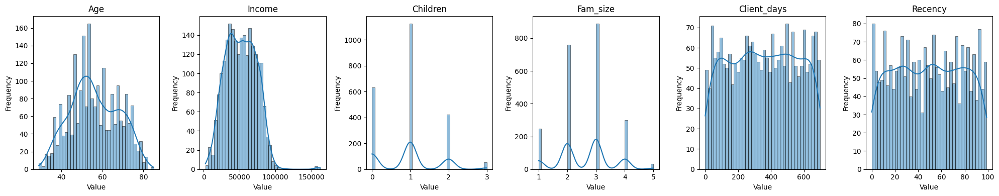

In [60]:
numeric_people = ["Age", "Income", "Children", "Fam_size", "Client_days", "Recency"]

fig, axes = plt.subplots(1, len(numeric_people), figsize=(20, 4))  # Una fila, tantas columnas como features

for col, ax in zip(numeric_people, axes):
    sns.histplot(df[col], bins=40, kde=True, ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()


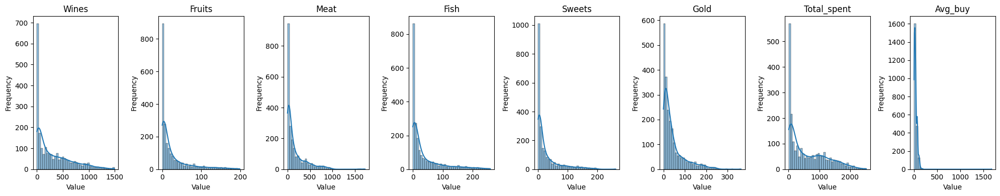

In [61]:
fig, axes = plt.subplots(1, len(products), figsize=(20, 4))  # Una fila, tantas columnas como features

for col, ax in zip(products, axes):
    sns.histplot(df[col], bins=40, kde=True, ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()


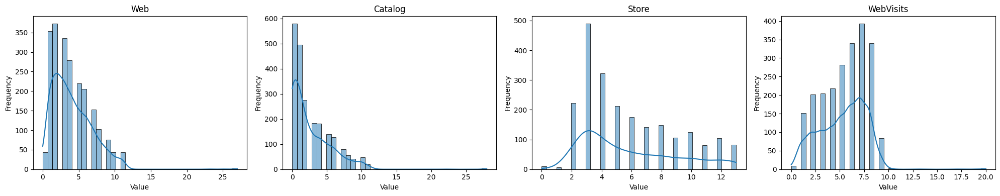

In [62]:
fig, axes = plt.subplots(1, len(place), figsize=(20, 4))  # Una fila, tantas columnas como features

for col, ax in zip(place, axes):
    sns.histplot(df[col], bins=40, kde=True, ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

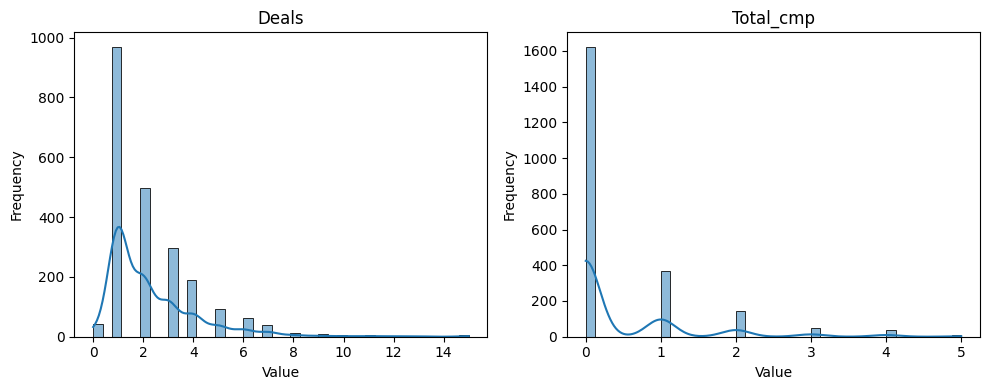

In [63]:
promotion_numeric = ["Deals", "Total_cmp"]

fig, axes = plt.subplots(1, len(promotion_numeric), figsize=(len(promotion_numeric)*10/2, 4))  # Una fila, tantas columnas como features

for col, ax in zip(promotion_numeric, axes):
    sns.histplot(df[col], bins=40, kde=True, ax=ax, edgecolor="black")
    ax.set_title(col)
    ax.set_xlabel("Value")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [64]:
promotion

['Deals', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response', 'Total_cmp']

#### Categóricas

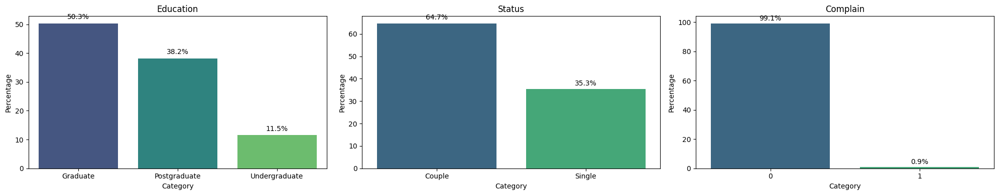

In [65]:
categoric = ["Education", "Status", "Complain",]
fig, axes = plt.subplots(1, len(categoric), figsize=(20, 4))  # Una fila, tantas columnas como features

for col, ax in zip(categoric, axes):
    value_counts = df[col].value_counts(normalize=True) * 100  # Valores relativos en porcentaje
    sns.barplot(x=value_counts.index, y=value_counts.values, ax=ax, palette="viridis")  # Distinto color para cada barra
    ax.set_title(col)
    ax.set_xlabel("Category")
    ax.set_ylabel("Percentage")
    for i, v in enumerate(value_counts.values):
        ax.text(i, v + 1, f"{v:.1f}%", ha='center', va='bottom')  # Mostrar valores encima de las barras

plt.tight_layout()
plt.show()

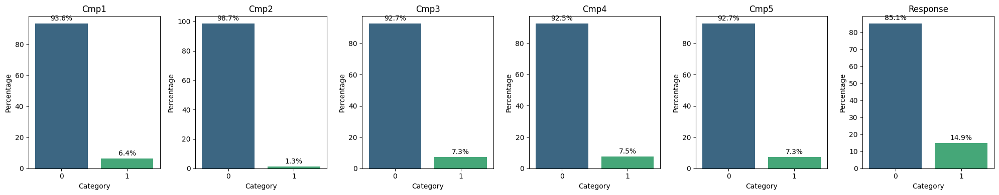

In [66]:
categoric = ['Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response']
fig, axes = plt.subplots(1, len(categoric), figsize=(20, 4))  # Una fila, tantas columnas como features

for col, ax in zip(categoric, axes):
    value_counts = df[col].value_counts(normalize=True) * 100  # Valores relativos en porcentaje
    sns.barplot(x=value_counts.index, y=value_counts.values, ax=ax, palette="viridis")  # Distinto color para cada barra
    ax.set_title(col)
    ax.set_xlabel("Category")
    ax.set_ylabel("Percentage")
    for i, v in enumerate(value_counts.values):
        ax.text(i, v + 1, f"{v:.1f}%", ha='center', va='bottom')  # Mostrar valores encima de las barras

plt.tight_layout()
plt.show()


In [67]:
corr = df.corr(numeric_only= True)
corr["Response"].sort_values(ascending = False)

Response       1.000000
Total_cmp      0.723917
Cmp5           0.324610
Cmp1           0.291622
Total_spent    0.264776
Cmp3           0.255214
Wines          0.246626
Meat           0.237441
Catalog        0.219003
Client_days    0.192183
Cmp4           0.177742
Cmp2           0.169859
Avg_buy        0.165216
Income         0.162786
Web            0.147044
Gold           0.136401
Fruits         0.123818
Sweets         0.116614
Fish           0.109121
Store          0.037193
Deals          0.003451
WebVisits     -0.000635
Complain      -0.001649
Age           -0.015470
Children      -0.169703
Recency       -0.198102
Fam_size      -0.219847
Name: Response, dtype: float64

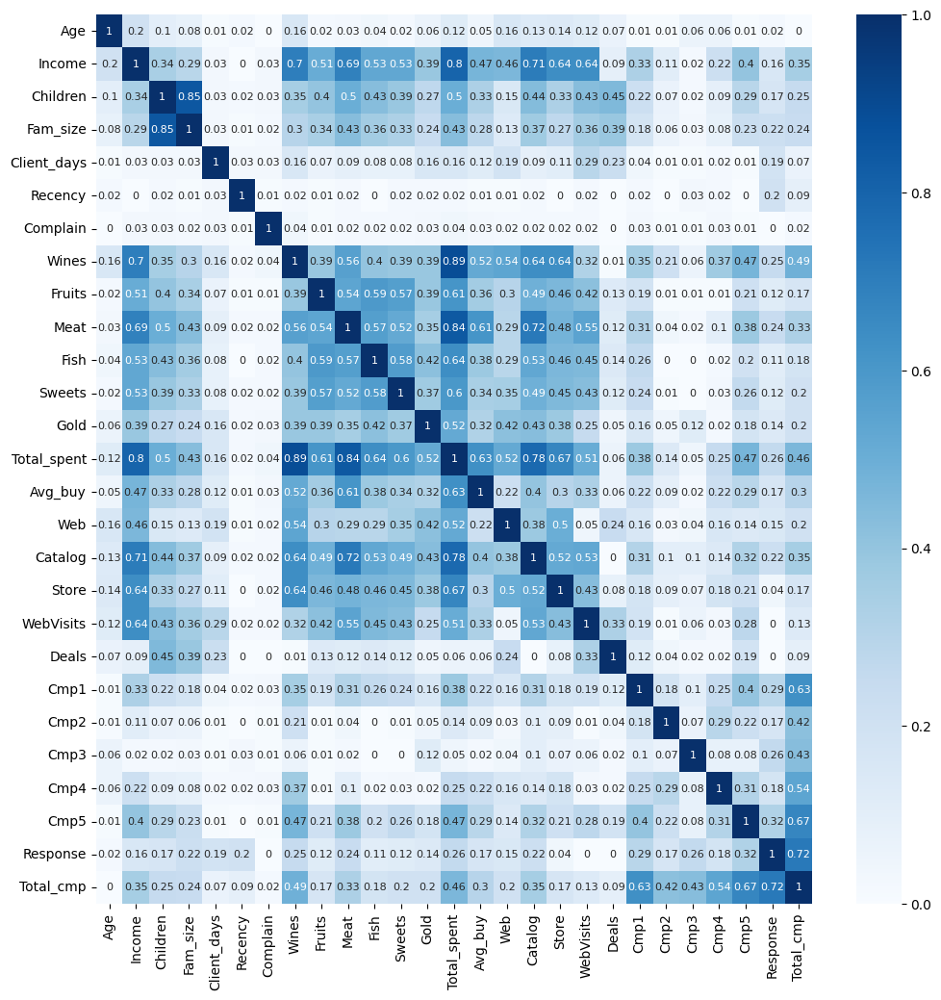

In [68]:
# Crear el heatmap
plt.figure(figsize=(12,12))
sns.heatmap(np.abs(round(df.corr(numeric_only=True),2)), annot=True, cmap="Blues", annot_kws={"size": 8})

# Configurar el título
plt.show()

## 6  Procesado variables

In [69]:
df_backup_V2 = df.copy()

In [70]:
df_backup_V2.head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,68,Graduate,58138.0,Single,0,1,663,58,0,635,...,4,7,3,0,0,0,0,0,1,1
1,71,Graduate,46344.0,Single,2,3,113,38,0,11,...,2,5,2,0,0,0,0,0,0,0
2,60,Graduate,71613.0,Couple,0,2,312,26,0,426,...,10,4,1,0,0,0,0,0,0,0


### 6.1. Categóricas

In [71]:
# Identificar variables categóricas en el DataFrame
features_cat_list = df.select_dtypes(include='object').columns.tolist()

print("Categorical features:", features_cat_list)

Categorical features: ['Education', 'Status']


#### - 'Status'

In [72]:
# Mapeo: singles as 1, couples as 2 
status_map = {"Single": 1, "Couple": 2}
df['Status'] = df.Status.map(status_map)

#### - 'Education'

In [73]:
education_map = {"Undergraduate": 0, "Graduate": 1, "Postgraduate":2}
df['Education'] = df.Education.map(education_map) 

### 6.2. Numéricas

In [74]:
df.head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,68,1,58138.0,1,0,1,663,58,0,635,...,4,7,3,0,0,0,0,0,1,1
1,71,1,46344.0,1,2,3,113,38,0,11,...,2,5,2,0,0,0,0,0,0,0
2,60,1,71613.0,2,0,2,312,26,0,426,...,10,4,1,0,0,0,0,0,0,0


In [75]:
df_transform = df.copy()

##### 6.2.1. Transformaciones

In [76]:
# Identificar variables numericas en el DataFrame
features_num_list = df_transform.select_dtypes(include='number').columns.tolist()

# Quitar, filtrando, columnas binarias (0-1)
features_num_list = [feature for feature in features_num_list if df_transform[feature].nunique() > 2]
print(features_num_list)

['Age', 'Education', 'Income', 'Children', 'Fam_size', 'Client_days', 'Recency', 'Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'Total_spent', 'Avg_buy', 'Web', 'Catalog', 'Store', 'WebVisits', 'Deals', 'Total_cmp']


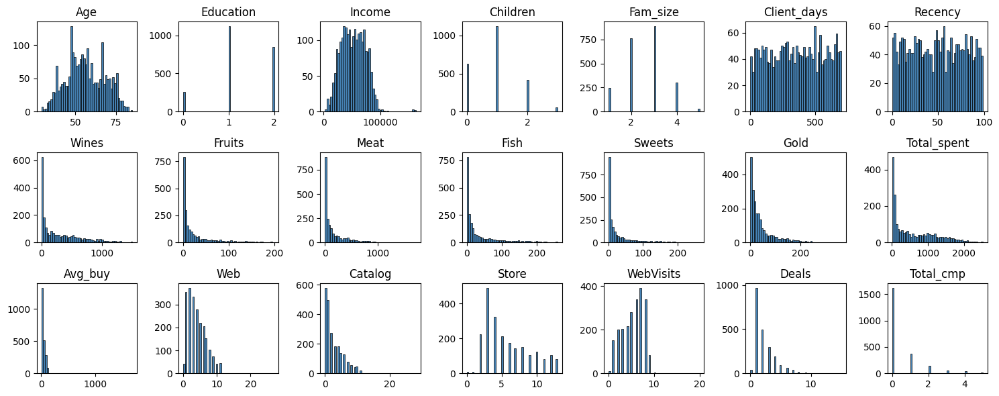

In [77]:
# MOSTRAS SUS HISTOGRÁMAS
# Calcular el número de filas necesarias
n_cols = 7
features_to_show = features_num_list

n_rows = (len(features_to_show) + n_cols - 1) // n_cols  # Redondeo hacia arriba

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, n_rows *2))

# Aplanar los ejes para iterar fácilmente
axes = axes.flatten()

for i, feature in enumerate(features_to_show):
    ax = axes[i]
    ax.hist(df_transform[feature], bins=50, color='steelblue', edgecolor='black', linewidth=0.5)
    ax.set_title(feature)

# Eliminar los ejes vacíos
for j in range(len(features_to_show), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Ajusta el espacio entre gráficos
plt.show()

In [78]:
features_to_transform = ["Wines", "Fruits", "Meat", "Fish", "Sweets", "Gold", "Total_spent", "Avg_buy", "Web", "Catalog", "WebVisits", "Deals"]

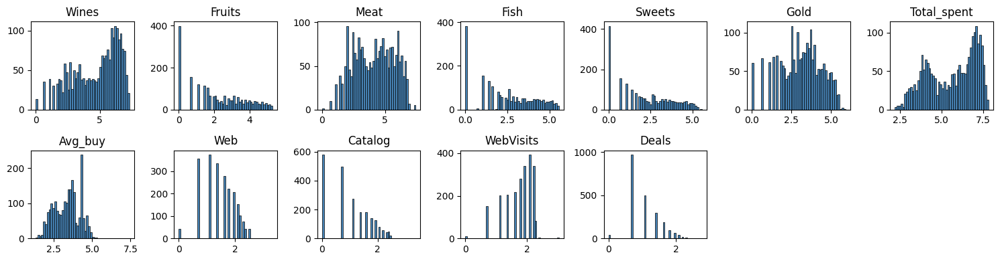

In [79]:
# Aplicar transformación logarítmica a las columnas seleccionadas
for feature in features_to_transform:
    df_transform[feature] = np.log1p(df_transform[feature])  # log1p para manejar valores cero de forma segura

# MOSTRAS SUS HISTOGRÁMAS
# Calcular el número de filas necesarias
n_cols = 7
features_to_show = features_to_transform

n_rows = (len(features_to_show) + n_cols - 1) // n_cols  # Redondeo hacia arriba

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(15, n_rows *2))

# Aplanar los ejes para iterar fácilmente
axes = axes.flatten()

for i, feature in enumerate(features_to_show):
    ax = axes[i]
    ax.hist(df_transform[feature], bins=50, color='steelblue', edgecolor='black', linewidth=0.5)
    ax.set_title(feature)

# Eliminar los ejes vacíos
for j in range(len(features_to_show), len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()  # Ajusta el espacio entre gráficos
plt.show()

##### 6.2.1. Escalado

In [80]:
df_transform.head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,68,1,58138.0,1,0,1,663,58,0,6.455199,...,4,2.079442,1.386294,0,0,0,0,0,1,1
1,71,1,46344.0,1,2,3,113,38,0,2.484907,...,2,1.791759,1.098612,0,0,0,0,0,0,0
2,60,1,71613.0,2,0,2,312,26,0,6.056784,...,10,1.609438,0.693147,0,0,0,0,0,0,0


In [81]:
df_scaled = df_transform.copy()

In [82]:
scaler = StandardScaler ()

df_scaled[df_scaled.columns] = scaler.fit_transform(df_scaled[df_scaled.columns])

df_scaled.head(3)

,Age,Education,Income,Status,Children,Fam_size,Client_days,Recency,Complain,Wines,...,Store,WebVisits,Deals,Cmp1,Cmp2,Cmp3,Cmp4,Cmp5,Response,Total_cmp
0,1.017806,-0.408153,0.292936,-1.352756,-1.267640,-1.767365,1.531482,0.306356,-0.097502,0.987064,...,-0.556478,0.715203,0.660045,-0.261762,-0.116775,-0.280817,-0.284517,-0.279887,2.390997,0.621099
1,1.274357,-0.408153,-0.265529,-1.352756,1.394165,0.443080,-1.193254,-0.384312,-0.097502,-1.221901,...,-1.173097,0.089789,0.043581,-0.261762,-0.116775,-0.280817,-0.284517,-0.279887,-0.418236,-0.502219
2,0.333670,-0.408153,0.931000,0.739232,-1.267640,-0.662142,-0.207395,-0.798712,-0.097502,0.765397,...,1.293380,-0.306573,-0.825277,-0.261762,-0.116775,-0.280817,-0.284517,-0.279887,-0.418236,-0.502219


In [83]:
df_scaled.describe().loc[['mean', 'std']].T

,mean,std
Age,-1.425865e-16,1.000224
Education,-1.147065e-16,1.000224
Income,3.186290e-17,1.000224
Status,1.370105e-16,1.000224
Children,-7.965726e-17,1.000224
Fam_size,-2.453444e-16,1.000224
Client_days,4.062520e-17,1.000224
Recency,9.558871e-17,1.000224
Complain,3.425262e-17,1.000224
Wines,-1.067407e-16,1.000224


In [84]:
df_scaled.columns

Index(['Age', 'Education', 'Income', 'Status', 'Children', 'Fam_size',
       'Client_days', 'Recency', 'Complain', 'Wines', 'Fruits', 'Meat', 'Fish',
       'Sweets', 'Gold', 'Total_spent', 'Avg_buy', 'Web', 'Catalog', 'Store',
       'WebVisits', 'Deals', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5',
       'Response', 'Total_cmp'],
      dtype='object')

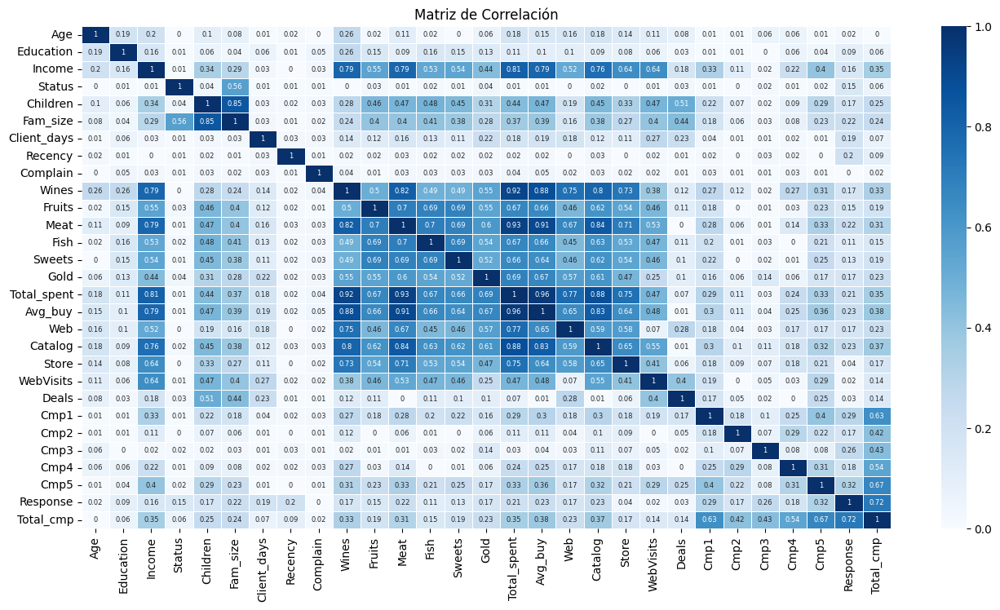

In [85]:
df_cluster = df_scaled.copy()

# Calcular la matriz de correlación
corr_matrix = df_cluster.corr()

# Crear un heatmap
plt.figure(figsize=(16, 8))
sns.heatmap(np.abs(round(corr_matrix,2)), annot=True, cmap="Blues", linewidths=0.5, annot_kws={"size": 6})
plt.title("Matriz de Correlación")
plt.show()

In [86]:
# Filtrar correlaciones mayores a 0.85
high_corr = (corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1) > 0.75)
             .stack()
             .reset_index())

# Renombrar columnas para claridad
high_corr.columns = ["Variable 1", "Variable 2", "Correlación"]

# Filtrar para mostrar solo correlaciones > 0.85
high_corr = high_corr[high_corr["Correlación"] > 0.85]

# Mostrar resultados
print(high_corr.sort_values(by="Correlación", ascending=False))

      Variable 1   Variable 2  Correlación
315  Total_spent      Avg_buy     0.964645
256         Meat  Total_spent     0.933278
221        Wines  Total_spent     0.923448
257         Meat      Avg_buy     0.910429
222        Wines      Avg_buy     0.881851
317  Total_spent      Catalog     0.881165


## 7 Reducción de la dimensionalidad

### PCA

------------------------------------------
Porcentaje de varianza explicada acumulada
------------------------------------------
[0.33597594 0.43085489 0.51497746 0.57456469 0.62132775 0.6621203
 0.69730677 0.73162993 0.76266533 0.7917734  0.82004847 0.84353166
 0.86524668 0.88376336 0.9019379  0.9178136  0.93179625 0.94516979
 0.95727984 0.96787858 0.97807124 0.98488576 0.99091367 0.99524089
 0.99850696 0.99986267 1.         1.         1.        ]


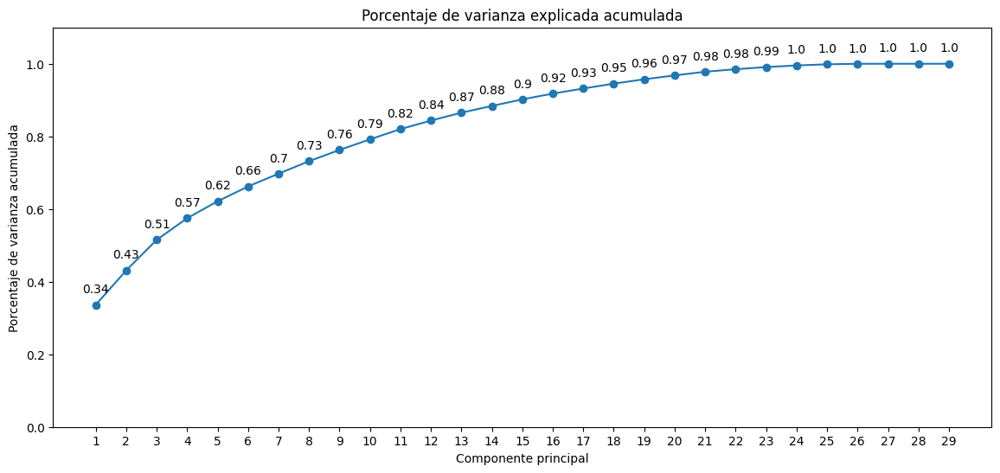

In [87]:
from sklearn.decomposition import PCA

# Aplicar PCA
modelo_PCA = PCA()
modelo_PCA.fit(df_cluster)

# Porcentaje de varianza explicada acumulada
prop_varianza_acum = modelo_PCA.explained_variance_ratio_.cumsum()
print('------------------------------------------')
print('Porcentaje de varianza explicada acumulada')
print('------------------------------------------')
print(prop_varianza_acum)

# Gráfico
fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(
    np.arange(len(df_cluster.columns)) + 1,  # Asegurar coherencia en el número de features
    prop_varianza_acum,
    marker='o'
)

for x, y in zip(np.arange(len(df_cluster.columns)) + 1, prop_varianza_acum):
    label = round(y, 2)
    ax.annotate(
        label,
        (x, y),
        textcoords="offset points",
        xytext=(0, 10),
        ha='center'
    )

ax.set_ylim(0, 1.1)
ax.set_xticks(np.arange(modelo_PCA.n_components_) + 1)
ax.set_title('Porcentaje de varianza explicada acumulada')
ax.set_xlabel('Componente principal')
ax.set_ylabel('Porcentaje de varianza acumulada')

plt.show()

Para explicar al menos el 85%-90% de la varianza, podemos elegir:

- 14 componentes → 88.37% (0.8838)
- 15 componentes → 90.19% (0.9019)

#### modelo_PCA_14

In [88]:
# Aplicamos PCA con 14 componentes
modelo_PCA_14 = PCA(n_components=14)
df_pca = modelo_PCA_14.fit_transform(df_cluster)

# Convertimos a DataFrame
df_pca = pd.DataFrame(df_pca, 
                      columns=[f'PC{i+1}' for i in range(14)])

# Mostramos las primeras filas
df_pca.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
0,4.150463,-0.223490,0.015195,2.844280,-1.871519,-0.160210,0.026971,0.093211,0.383286,-1.047731,1.210853,-0.376559,-0.011175,1.562442
1,-3.906083,0.445965,-0.371133,-1.042206,-0.896508,0.275020,0.310529,0.067807,-1.830978,-0.973297,0.659414,-0.535629,-0.313218,-0.338954
2,2.547821,-1.123240,-1.260134,-0.156397,0.366212,0.225192,-0.814919,0.563791,-0.064435,0.616017,0.506736,0.912407,0.325794,0.241557
3,-3.234401,0.291119,-0.923090,0.079208,1.087379,0.196224,-0.945407,0.339505,-0.313778,0.506573,-0.831678,0.115733,0.194358,0.591730
4,0.753834,-1.681054,0.225655,-0.434102,0.654781,-0.173348,0.514338,-1.017224,0.448042,0.350390,-1.532158,-0.696240,0.342655,1.557493


## 8 CLUSTERING

### KMEANS

#### Seleccion del num K

[0] k=2, Silhouette Score: 0.2700
[1] k=3, Silhouette Score: 0.2029
[2] k=4, Silhouette Score: 0.1956
[3] k=5, Silhouette Score: 0.1436
[4] k=6, Silhouette Score: 0.1482
[5] k=7, Silhouette Score: 0.1620
[6] k=8, Silhouette Score: 0.1544
[7] k=9, Silhouette Score: 0.1316
[8] k=10, Silhouette Score: 0.1344


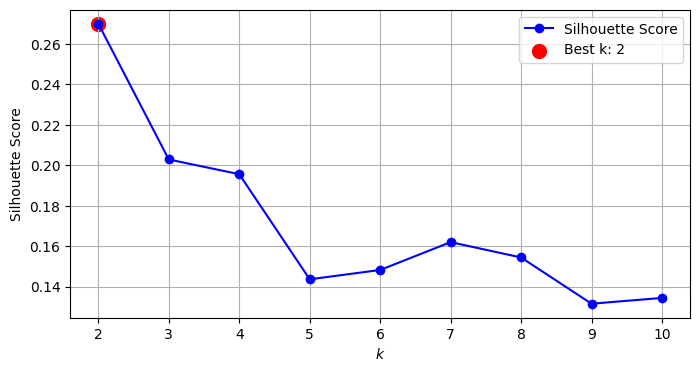


Mejor K: 2 con un Silhouette Score de 0.2700


In [89]:
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib as mpl

k_range = range(2, 11)

# Diccionario para almacenar modelos y silhouette scores, y lista para almacenar cada modelo de Kmeans para cada K
silhouette_scores = {}
kmeans_per_k = []

# Entrenamiento y cálculo de silhouette score en un solo paso
for k in k_range:
    kmeans = KMeans(n_clusters=k, n_init=10, random_state=42)
    kmeans.fit(df_pca)
    kmeans_per_k.append(kmeans)
    score = silhouette_score(df_pca, kmeans.labels_)
    silhouette_scores[k] = score
    print(f"[{k-2}] k={k}, Silhouette Score: {score:.4f}")

# Encontrar el mejor valor de K
best_k = max(silhouette_scores, key=silhouette_scores.get)
best_score = silhouette_scores[best_k]

# Graficar resultados
plt.figure(figsize=(8, 4))
plt.plot(list(silhouette_scores.keys()), list(silhouette_scores.values()), "bo-", label="Silhouette Score")
plt.scatter(best_k, best_score, color='red', s=100, label=f"Best k: {best_k}")
plt.xlabel("$k$")
plt.ylabel("Silhouette Score")
plt.xticks(range(2, 11))
plt.grid(True)
plt.legend()
plt.show()

print(f"\nMejor K: {best_k} con un Silhouette Score de {best_score:.4f}")

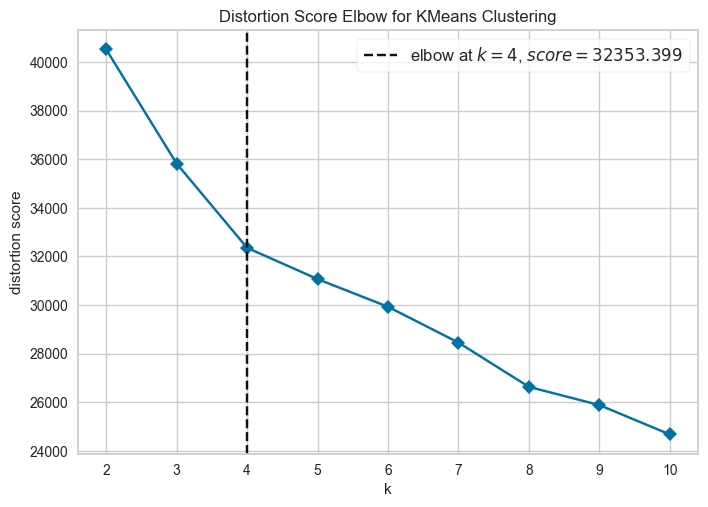

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [90]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.datasets import make_blobs


# Instantiate the clustering model and visualizer
model = KMeans(n_clusters=k, random_state=102)
visualizer = KElbowVisualizer(model, k=(2,11), timings=False)

visualizer.fit(df_pca)   # Fit the data to the visualizer
visualizer.show()        # Finalize and render the figure

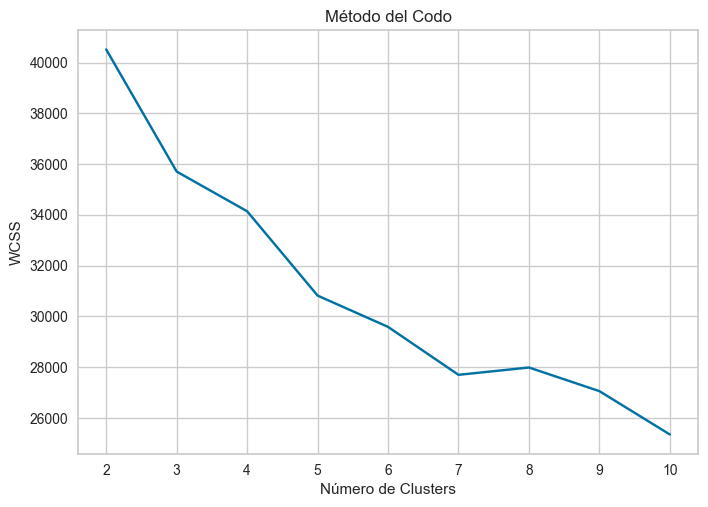

In [91]:
# metodo del codo

# Calcular el WCSS (Within-Cluster Sum of Squares) para diferentes valores de k
wcss = []
for k in range(2, 11):  # Probar entre 1 y 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(df_pca)
    wcss.append(kmeans.inertia_)

# Graficar el codo
plt.plot(range(2, 11), wcss)
plt.title('Método del Codo')
plt.xlabel('Número de Clusters')
plt.ylabel('WCSS')
plt.show()


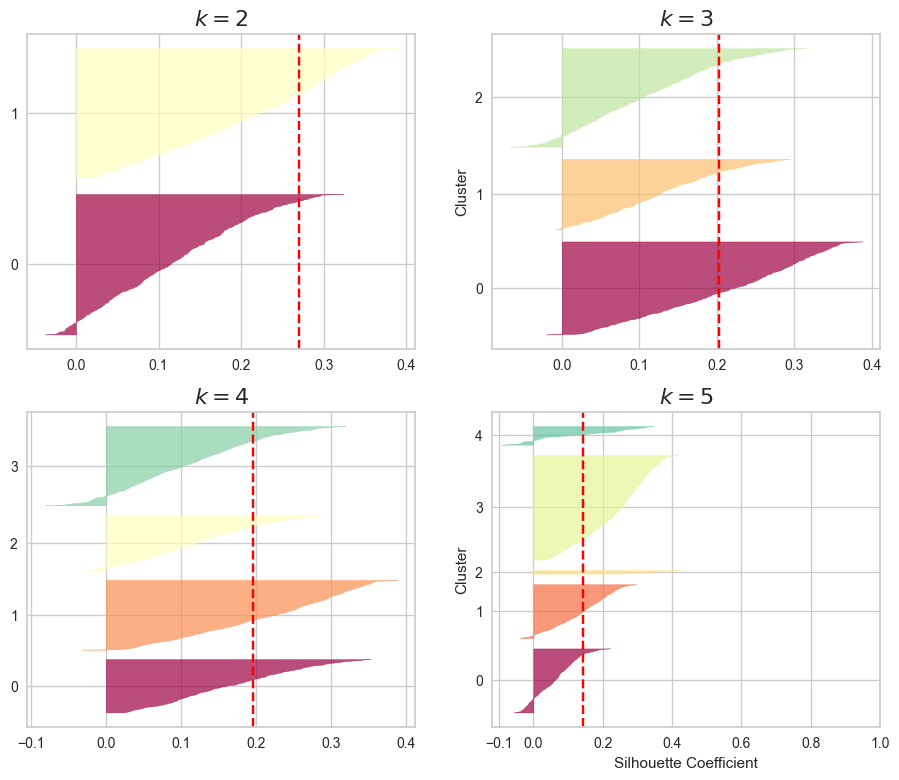

In [92]:
from sklearn.metrics import silhouette_samples
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib as mpl

plt.figure(figsize=(11, 9))

for k in (2, 3, 4, 5):
    plt.subplot(2, 2, k-1)
    
    y_pred = kmeans_per_k[k].labels_
    silhouette_coefficients = silhouette_samples(df_pca, y_pred)

    padding = len(df_pca) // 30
    pos = padding
    ticks = []
    for i in range(k):
        coeffs = silhouette_coefficients[y_pred == i]
        coeffs.sort()

        color = mpl.cm.Spectral(i / k)
        plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                          facecolor=color, edgecolor=color, alpha=0.7)
        ticks.append(pos + len(coeffs) // 2)
        pos += len(coeffs) + padding

    plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
    plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))
    if k in (3, 5):
        plt.ylabel("Cluster")
    
    if k in (5, 6):
        plt.gca().set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.xlabel("Silhouette Coefficient")
    else:
        plt.tick_params(labelbottom=True)

    plt.axvline(x=silhouette_scores[k], color="red", linestyle="--")
    plt.title("$k={}$".format(k), fontsize=16)

plt.show()

#### **k = 2**

In [93]:
# Obtener el modelo con K=2
k = 2
kmeans_model = kmeans_per_k[k-2]  # K=2 está en índice 0 de la lista kmeans_per_k

# Definir el número de clusters
num_clusters = len(set(kmeans_model.labels_))

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Asignar colores correctamente
colors_mapped = [color_map_normalized[str(label)] for label in kmeans_model.labels_]

x = df_pca["PC1"]
y = df_pca["PC2"]
z = df_pca["PC2"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(48,103,141)', '1': 'rgb(53,183,120)'}
{'0': (0.18823529411764706, 0.403921568627451, 0.5529411764705883), '1': (0.20784313725490197, 0.7176470588235294, 0.47058823529411764)}
[(0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.18823529411764706, 0.403921568627451, 0.5529411764705883), (0.20784313725490197, 0.7176470588235294, 0.470588235294117

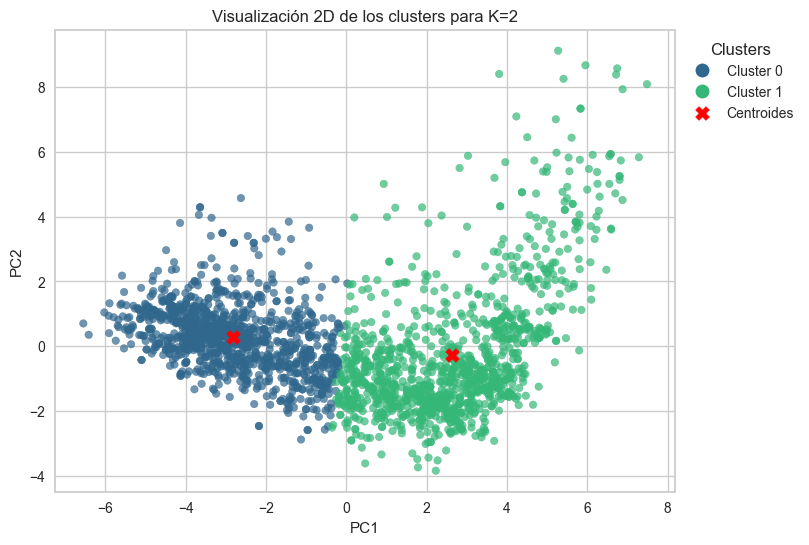

In [94]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=2
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

# Añadir los centros de los clusters
centroids = plt.scatter(kmeans_model.cluster_centers_[:, 0], 
                        kmeans_model.cluster_centers_[:, 1],  
                        c='red', marker='X', s=100, 
                        label='Centroides de clusters')

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches + [centroids], 
           labels=legend_labels + ["Centroides"], 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


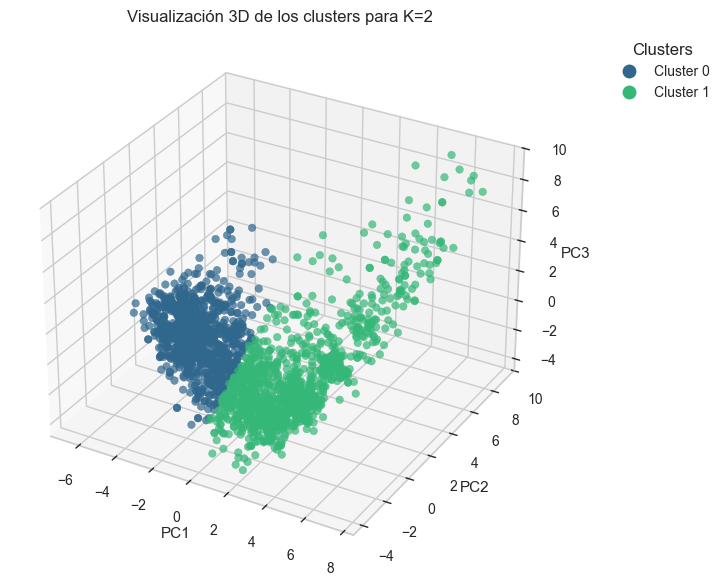

In [95]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 2
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [96]:
# 'Clusters en 3D con K=2'
df_pca_3D = df_pca.iloc[:, :3].copy()
df_pca_3D['Cluster'] = kmeans_model.labels_
df_pca_3D['Cluster'] = df_pca_3D['Cluster'].astype(str)

# Invertir el orden asignación de colores
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_pca_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### **k = 3**

In [97]:
# Obtener el modelo con K=3
k = 3
kmeans_model = kmeans_per_k[k-2]  # K=2 está en índice 0 de la lista kmeans_per_k

# Definir el número de clusters
num_clusters = len(set(kmeans_model.labels_))

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Asignar colores correctamente
colors_mapped = [color_map_normalized[str(label)] for label in kmeans_model.labels_]

x = df_pca["PC1"]
y = df_pca["PC2"]
z = df_pca["PC2"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(58,82,139)', '1': 'rgb(32,144,140)', '2': 'rgb(94,201,97)'}
{'0': (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), '1': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '2': (0.3686274509803922, 0.788235294117647, 0.3803921568627451)}
[(0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.321568627450

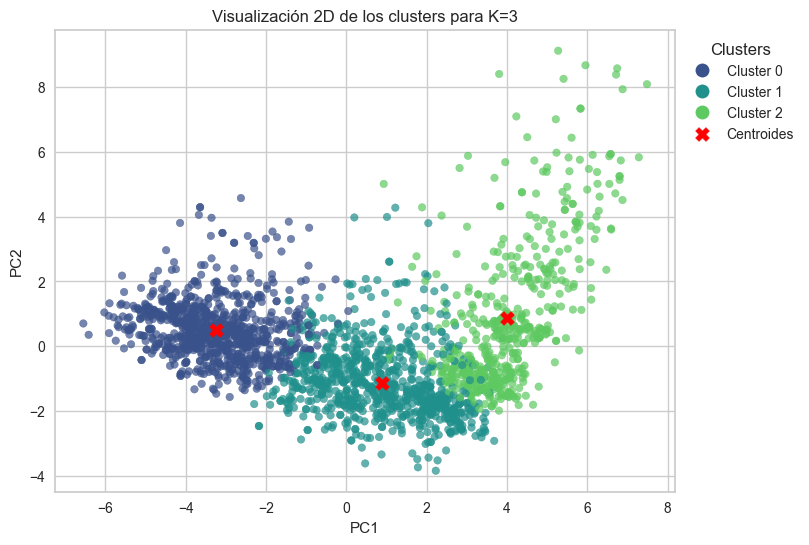

In [98]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=3
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

# Añadir los centros de los clusters
centroids = plt.scatter(kmeans_model.cluster_centers_[:, 0], 
                        kmeans_model.cluster_centers_[:, 1],  
                        c='red', marker='X', s=100, 
                        label='Centroides de clusters')

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches + [centroids], 
           labels=legend_labels + ["Centroides"], 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


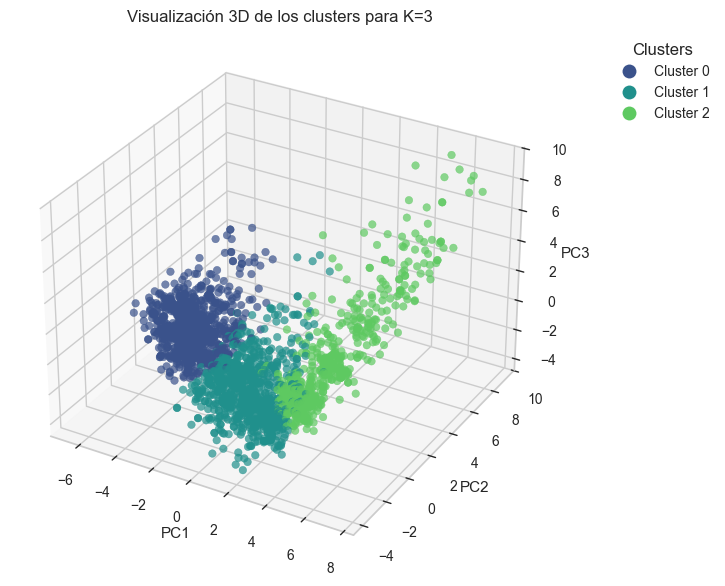

In [99]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 3
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [100]:
# 'Clusters en 3D con K=3'
df_pca_3D = df_pca.iloc[:, :3].copy()
df_pca_3D['Cluster'] = kmeans_model.labels_
df_pca_3D['Cluster'] = df_pca_3D['Cluster'].astype(str)

# Invertir el orden asignación de colores
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_pca_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### **k = 4**

In [101]:
# Obtener el modelo con K=4
k = 4
kmeans_model = kmeans_per_k[k-2]  # K=2 está en índice 0 de la lista kmeans_per_k

# Definir el número de clusters
num_clusters = len(set(kmeans_model.labels_))

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Asignar colores correctamente
colors_mapped = [color_map_normalized[str(label)] for label in kmeans_model.labels_]

x = df_pca["PC1"]
y = df_pca["PC2"]
z = df_pca["PC2"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294)}
[(0.1607843137254902, 0.47058823529411764, 0.5568627450980392), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (

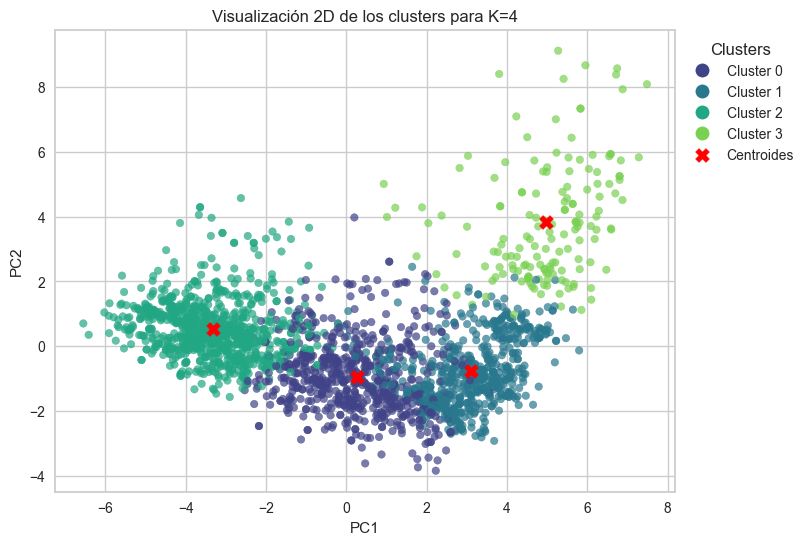

In [102]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=4
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

# Añadir los centros de los clusters
centroids = plt.scatter(kmeans_model.cluster_centers_[:, 0], 
                        kmeans_model.cluster_centers_[:, 1],  
                        c='red', marker='X', s=100, 
                        label='Centroides de clusters')

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches + [centroids], 
           labels=legend_labels + ["Centroides"], 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


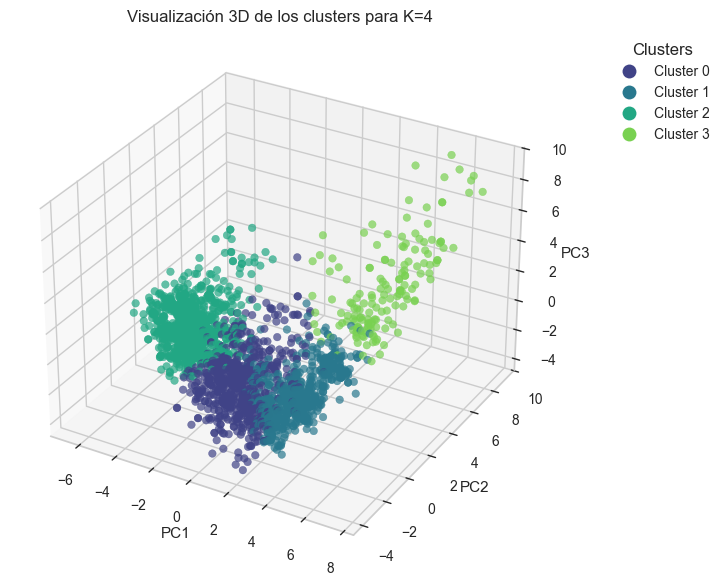

In [103]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [104]:
# 'Clusters en 3D con K=4'
df_pca_3D = df_pca.iloc[:, :3].copy()
df_pca_3D['Cluster'] = kmeans_model.labels_
df_pca_3D['Cluster'] = df_pca_3D['Cluster'].astype(str)

# Invertir el orden asignación de colores
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_pca_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

### DBSCAN

- Si quieres pocos clusters → Usar min_samples más bajo
- Si quieres menos anomalías → Usa min_samples mayor

In [372]:
# Estoy buscando entre 3 y 5 clusters y con un % de anomalias inferior a 10 (pero con 10% como máximo)

# Definir valores de min_samples según heurística
min_samples_values = [5, 10, 15, 20, 25]  
eps_values = np.linspace(0.001, 6, 100)

best_config = []
best_models = {}
experiments = {}

# Bucle para iterar sobre min_samples
for min_samples in min_samples_values:
    outlier_percent = []
    
    # Bucle para iterar sobre eps
    for eps in eps_values:
        dbscan = DBSCAN(eps=eps, min_samples=min_samples)
        labels = dbscan.fit_predict(df_pca)

        # Contar número de clusters (excluyendo ruido -1)
        num_clusters = len(set(labels)) - (1 if -1 in labels else 0)

        # Calcular porcentaje de anomalías
        anomaly_percentage = (labels == -1).sum() / len(labels) * 100
        outlier_percent.append(anomaly_percentage)

        # Calcular Silhouette Score solo si hay más de un cluster
        silhouette = silhouette_score(df_pca, labels) if num_clusters > 1 else np.nan

        # Condición para guardar la configuración: 3-5 clusters, anomalías <= 10%
        if 3 <= num_clusters <= 5 and anomaly_percentage <= 10:
            best_config.append((eps, min_samples, num_clusters, anomaly_percentage, round(silhouette, 3)))

            # Guardar el mejor modelo por número de clusters
            if num_clusters not in best_models or anomaly_percentage > best_models[num_clusters]["anomalies"]:
                best_models[num_clusters] = {
                    "model": dbscan,
                    "eps": eps,
                    "min_samples": min_samples,
                    "anomalies": anomaly_percentage
                }
    
    experiments[min_samples] = outlier_percent.copy()

# Convertir a DataFrame
df_results = pd.DataFrame(best_config, columns=["EPS", "min_samples", "Clusters", "Anomalias (%)", "Silhouette Score"])
df_results.sort_values(by="Anomalias (%)", ascending=False)

'\n# Guardar los 3 mejores modelos (uno por cada cantidad de clusters)\ndbscan_best_3 = best_models.get(3, None)\ndbscan_best_4 = best_models.get(4, None)\ndbscan_best_5 = best_models.get(5, None)\n\n# Verificar qué modelos se guardaron\nprint("\nMejores Modelos:")\nfor k, model_info in best_models.items():\n    print(f"Clusters = {k} -> EPS: {round(model_info[\'eps\'],3)},  min_samples: {model_info[\'min_samples\']}, Silhouette: {round(model_info[\'score\'],3)}")\'\n    '

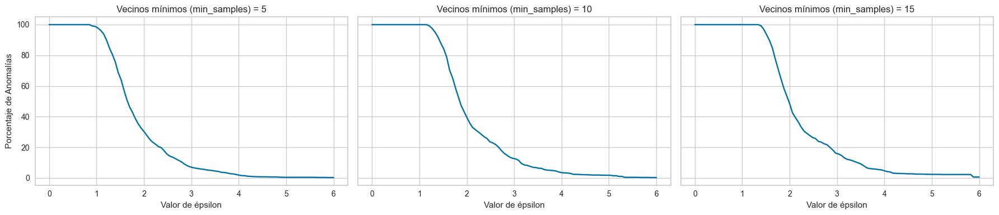

In [377]:
# visualizamos el % de anomalias (que va bajando a medida que aumenta el valor de nuetras distancia EPSILON)
fig, axes = plt.subplots(1, 3, figsize=(18, 4), dpi=100, sharey=True)

for i, min_samples in enumerate([5, 10, 15]):
    sns.lineplot(ax=axes[i], 
                 x=np.linspace(0.001, 6, 100),             
                 y=experiments[min_samples])
    
    axes[i].set_ylabel("Porcentaje de Anomalías")
    axes[i].set_xlabel("Valor de épsilon")
    axes[i].set_title(f"Vecinos mínimos (min_samples) = {min_samples}")

plt.tight_layout()
plt.show()

In [379]:
# Mejores modelos
df_results.sort_values(by="Anomalias (%)", ascending=False).head(5)

,EPS,min_samples,Clusters,Anomalias (%),Silhouette Score
61,3.454970,15,3,9.820628,0.086
62,3.515566,15,3,8.968610,0.146
63,3.576162,15,4,7.713004,0.140
40,3.394374,10,5,6.995516,0.096
41,3.454970,10,4,6.816143,0.121


Mejores Modelos con un maximo de 10% de anomalias:
- Clusters = 3 -> EPS: 3.454,  min_samples: 15, Silhouette: 0.086
- Clusters = 4 -> EPS: 3.576,  min_samples: 15, Silhouette: 0.140
- Clusters = 5 -> EPS: 3.39,  min_samples: 10, Silhouette: 0.096

#### K = 3 (EPS: 3.454,  min_samples: 15)

In [380]:
df_dbscan_3 = df_pca.copy()

dbscan_3 = DBSCAN(eps = 3.45, 
                  min_samples = 15)

dbscan_3.fit(df_dbscan_3)
df_dbscan_3["Cluster"] = dbscan_3.labels_
round(df_dbscan_3["Cluster"].value_counts(normalize=True)*100,2)

Cluster
 0    83.99
-1     9.87
 2     4.39
 1     1.75
Name: proportion, dtype: float64

In [383]:
model = dbscan_3
df_model = df_dbscan_3

In [386]:
# DBSCAN
# Definir el número de clusters, incluyendo el ruido (etiquetado como -1)
num_clusters = len(set(model.labels_)) - (1 if -1 in model.labels_ else 0)  # Excluye el ruido (-1) si existe

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Añadir color para el ruido (-1)
color_map["-1"] = "rgb(0,0,0)"  # Asignamos un color negro para el ruido

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Asignar colores correctamente, manejando el ruido (-1)
colors_mapped = [color_map_normalized[str(label)] if label != -1 else color_map_normalized["-1"] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC3"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(58,82,139)', '1': 'rgb(32,144,140)', '2': 'rgb(94,201,97)', '-1': 'rgb(0,0,0)'}
{'0': (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), '1': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '2': (0.3686274509803922, 0.788235294117647, 0.3803921568627451), '-1': (0.0, 0.0, 0.0)}
[(0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.22745098039215686, 0.3215686274509804, 0.5450980392

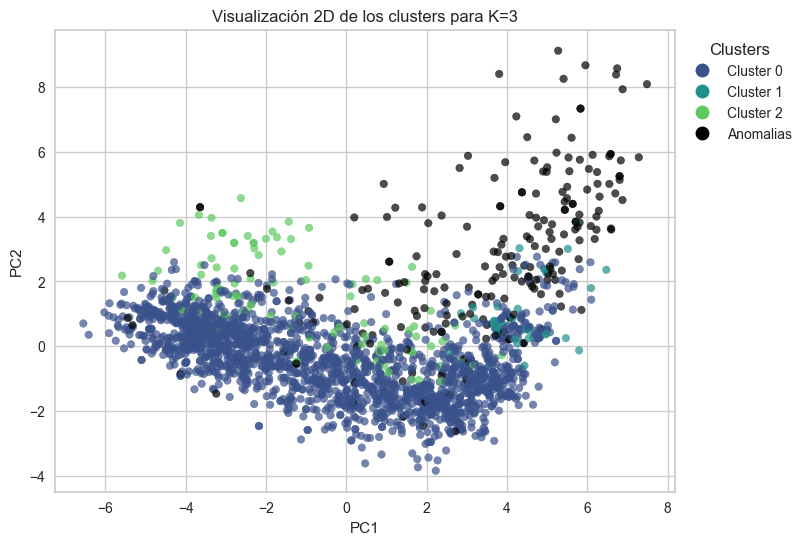

In [388]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=3
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Añadir leyenda de clusters
unique_clusters = set(df_model['Cluster'])  
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalias' for i in unique_clusters]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

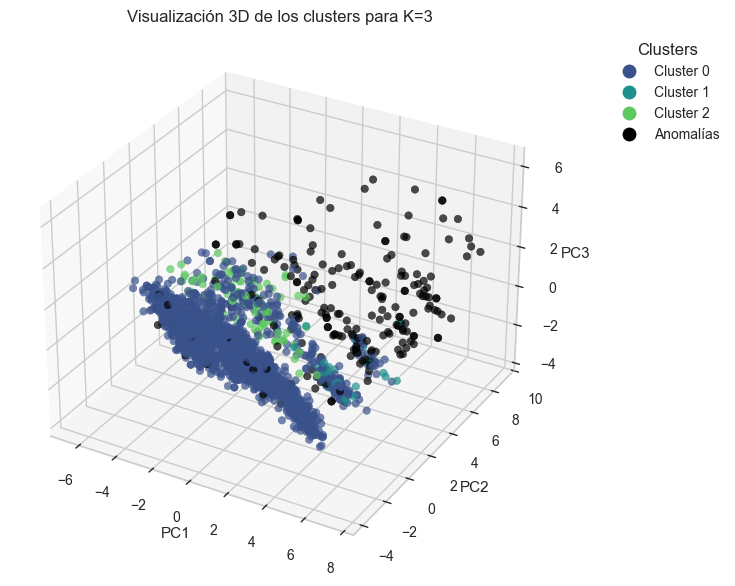

In [389]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 3
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

unique_clusters = set(df_model['Cluster'])  # Obtener los clusters únicos
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalías' for i in unique_clusters]

# Crear los parches de leyenda (incluso para el caso de las anomalías)
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [390]:
# 'Clusters en 3D con K=3'
df_dbscan_k3_3D = df_pca.iloc[:, :3].copy()
df_dbscan_k3_3D['Cluster'] = model.labels_
df_dbscan_k3_3D['Cluster'] = df_dbscan_k3_3D['Cluster'].astype(str)

# Crear un nuevo color_map asegurando que '-1' sea "Anomalías"
color_map_updated = {str(i): color_map[str(i)] for i in range(num_clusters)}
color_map_updated["-1"] = "rgb(204,97,176)"  # Asignar un color específico para Anomalías si lo deseas

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_dbscan_k3_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}" if t.name != "-1" else "Anomalías",  # Cambiar -1 por "Anomalías", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### K = 4 (EPS: 3.576,  min_samples: 15)

In [391]:
df_dbscan_4 = df_pca.copy()

dbscan_4 = DBSCAN(eps = 3.576, 
                  min_samples = 15)

dbscan_4.fit(df_dbscan_4)
df_dbscan_4["Cluster"] = dbscan_4.labels_
round(df_dbscan_4["Cluster"].value_counts(normalize=True)*100,2)

Cluster
 0    89.28
-1     7.71
 1     1.97
 3     0.63
 2     0.40
Name: proportion, dtype: float64

In [392]:
model = dbscan_4
df_model = df_dbscan_4

In [393]:
# DBSCAN
# Definir el número de clusters, incluyendo el ruido (etiquetado como -1)
num_clusters = len(set(model.labels_)) - (1 if -1 in model.labels_ else 0)  # Excluye el ruido (-1) si existe

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Añadir color para el ruido (-1)
color_map["-1"] = "rgb(0,0,0)"  # Asignamos un color negro para el ruido

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Asignar colores correctamente, manejando el ruido (-1)
colors_mapped = [color_map_normalized[str(label)] if label != -1 else color_map_normalized["-1"] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC3"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)', '-1': 'rgb(0,0,0)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294), '-1': (0.0, 0.0, 0.0)}
[(0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274,

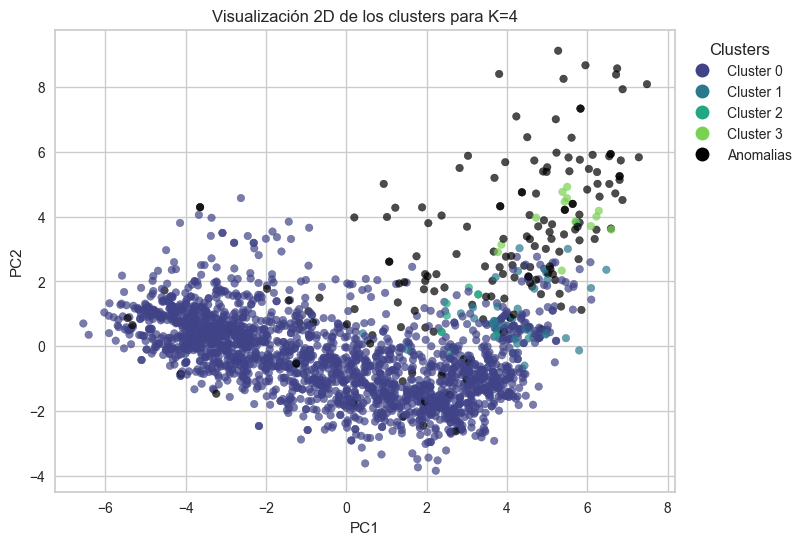

In [ ]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=4
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Añadir leyenda de clusters
unique_clusters = set(df_model['Cluster'])  
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalias' for i in unique_clusters]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

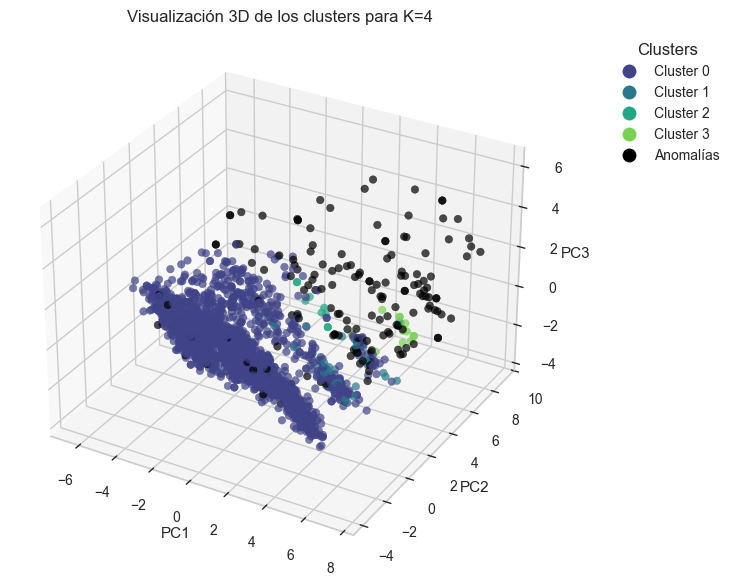

In [ ]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

unique_clusters = set(df_model['Cluster'])  # Obtener los clusters únicos
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalías' for i in unique_clusters]

# Crear los parches de leyenda (incluso para el caso de las anomalías)
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [ ]:
# 'Clusters en 3D con K=4'
df_dbscan_k4_3D = df_pca.iloc[:, :3].copy()
df_dbscan_k4_3D['Cluster'] = model.labels_
df_dbscan_k4_3D['Cluster'] = df_dbscan_k4_3D['Cluster'].astype(str)

# Crear un nuevo color_map asegurando que '-1' sea "Anomalías"
color_map_updated = {str(i): color_map[str(i)] for i in range(num_clusters)}
color_map_updated["-1"] = "rgb(204,97,176)"  # Asignar un color específico para Anomalías si lo deseas

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_dbscan_k4_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}" if t.name != "-1" else "Anomalías",  # Cambiar -1 por "Anomalías", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### K = 5 (EPS: 3.39,  min_samples: 10)

In [397]:
df_dbscan_5 = df_pca.copy()

dbscan_5 = DBSCAN(eps = 3.39, 
                  min_samples = 10)

dbscan_5.fit(df_dbscan_5)
df_dbscan_5["Cluster"] = dbscan_5.labels_
round(df_dbscan_5["Cluster"].value_counts(normalize=True)*100,2)

Cluster
 0    84.26
-1     7.04
 3     4.71
 1     2.78
 2     0.85
 4     0.36
Name: proportion, dtype: float64

In [398]:
model = dbscan_5
df_model = df_dbscan_5

In [399]:
# DBSCAN
# Definir el número de clusters, incluyendo el ruido (etiquetado como -1)
num_clusters = len(set(model.labels_)) - (1 if -1 in model.labels_ else 0)  # Excluye el ruido (-1) si existe

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Añadir color para el ruido (-1)
color_map["-1"] = "rgb(0,0,0)"  # Asignamos un color negro para el ruido

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Asignar colores correctamente, manejando el ruido (-1)
colors_mapped = [color_map_normalized[str(label)] if label != -1 else color_map_normalized["-1"] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC3"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(68,57,130)', '1': 'rgb(48,103,141)', '2': 'rgb(32,144,140)', '3': 'rgb(53,183,120)', '4': 'rgb(144,214,67)', '-1': 'rgb(0,0,0)'}
{'0': (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), '1': (0.18823529411764706, 0.403921568627451, 0.5529411764705883), '2': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '3': (0.20784313725490197, 0.7176470588235294, 0.47058823529411764), '4': (0.5647058823529412, 0.8392156862745098, 0.2627450980392157), '-1': (0.0, 0.0, 0.0)}
[(0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.5098039215686274), (0.26666666666666666, 0.2235294117647059, 0.50980392156

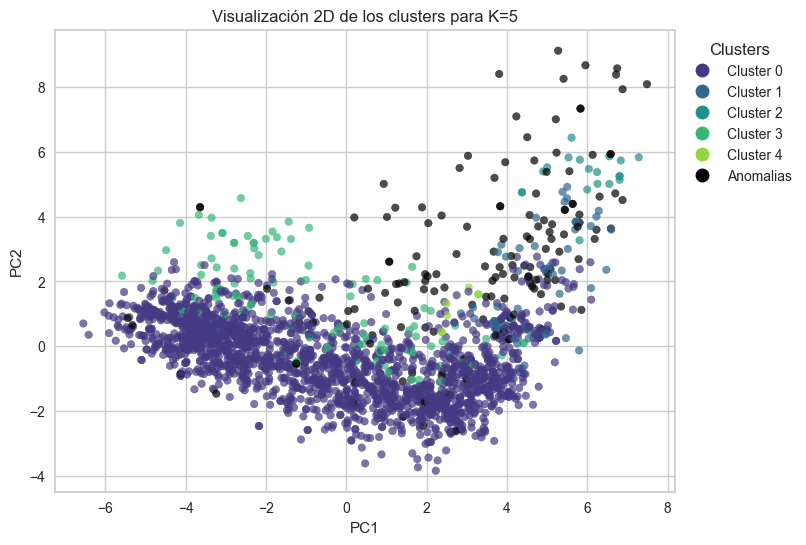

In [400]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=5
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Añadir leyenda de clusters
unique_clusters = set(df_model['Cluster'])  
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalias' for i in unique_clusters]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

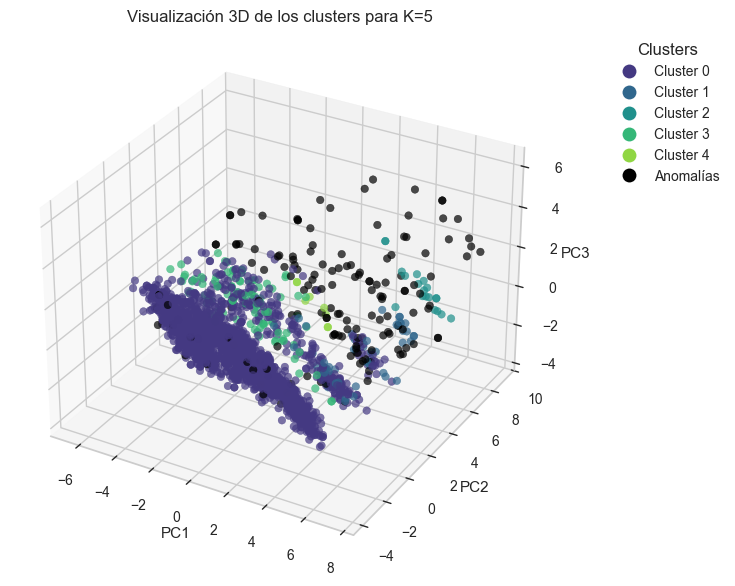

In [401]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 5
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

unique_clusters = set(df_model['Cluster'])  # Obtener los clusters únicos
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalías' for i in unique_clusters]

# Crear los parches de leyenda (incluso para el caso de las anomalías)
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor=color_map_normalized[str(i)], markersize=10) 
                            for i in unique_clusters]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [402]:
# 'Clusters en 3D con K=5'
df_dbscan_k5_3D = df_pca.iloc[:, :3].copy()
df_dbscan_k5_3D['Cluster'] = model.labels_
df_dbscan_k5_3D['Cluster'] = df_dbscan_k5_3D['Cluster'].astype(str)

# Crear un nuevo color_map asegurando que '-1' sea "Anomalías"
color_map_updated = {str(i): color_map[str(i)] for i in range(num_clusters)}
color_map_updated["-1"] = "rgb(204,97,176)"  # Asignar un color específico para Anomalías si lo deseas

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_dbscan_k5_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}" if t.name != "-1" else "Anomalías",  # Cambiar -1 por "Anomalías", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

##### Visualización **k = 3**

In [317]:
# Definir el número de clusters, incluyendo el ruido (etiquetado como -1)
num_clusters = len(set(dbscan_25.labels_)) - (1 if -1 in dbscan_25.labels_ else 0)  # Excluye el ruido (-1) si existe

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Añadir color para el ruido (-1)
color_map["-1"] = "rgb(0,0,0)"  # Asignamos un color negro para el ruido

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}

# Asignar colores correctamente, manejando el ruido (-1)
colors_mapped = [color_map_normalized[str(label)] if label != -1 else color_map_normalized["-1"] for label in dbscan_25.labels_]

x = df_dbscan_25["PC1"]
y = df_dbscan_25["PC2"]
z = df_dbscan_25["PC3"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(58,82,139)', '1': 'rgb(32,144,140)', '2': 'rgb(94,201,97)', '-1': 'rgb(0,0,0)'}
{'0': (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), '1': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '2': (0.3686274509803922, 0.788235294117647, 0.3803921568627451), '-1': (0.0, 0.0, 0.0)}
[(0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.0, 0.0, 0.0), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.22745098039215686, 0.32156862745

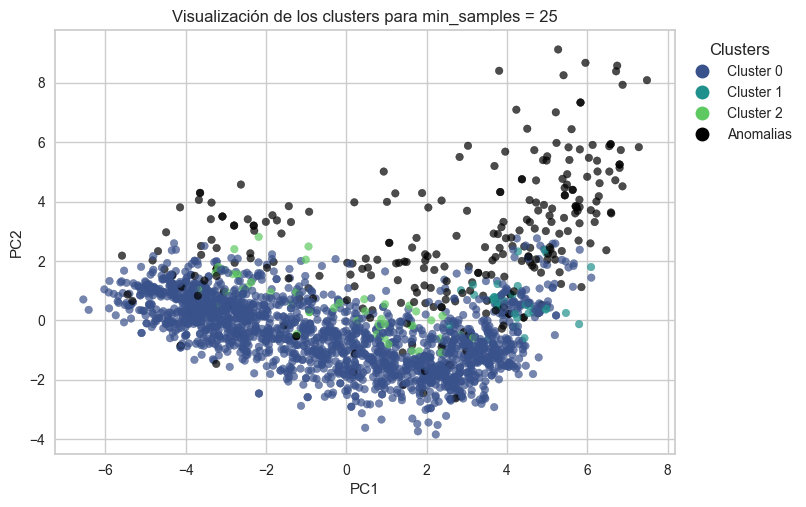

In [318]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para min_samples = 25"

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x=df_dbscan_25["PC1"], 
                      y=df_dbscan_25["PC2"],  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

# Añadir leyenda de clusters
unique_clusters = set(df_dbscan_25['Cluster'])  
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalias' for i in unique_clusters]
legend_patches = [plt.Line2D([0], [0], marker='o', color='w', 
                             markerfacecolor = color_map_normalized[str(i)], markersize=10) 
                  for i in unique_clusters]

plt.title("Visualización de los clusters para min_samples = 25")
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Añadir leyenda a la izquierda y ajustar márgenes
plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters", loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


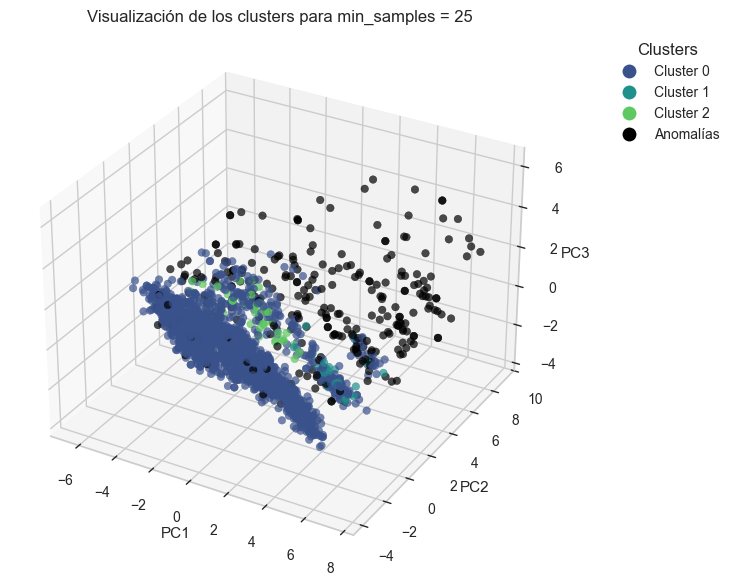

In [319]:
# VISUALIZACIÓN EN 3D -> usando PC1, PC2 y PC3 para DBSCAN
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c=colors_mapped, alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title("Visualización de los clusters para min_samples = 25")
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
# ax.view_init(elev=40, azim=45)

# Agregar leyenda con los colores de los clusters
unique_clusters = set(df_dbscan_25['Cluster'])  # Obtener los clusters únicos
legend_labels = [f'Cluster {i}' if i != -1 else 'Anomalías' for i in unique_clusters]

# Crear los parches de leyenda (incluso para el caso de las anomalías)
legend_patches = [plt.Line2D([0], [0], marker='o', color='w', 
                             markerfacecolor=color_map_normalized[str(i)], markersize=10) 
                  for i in unique_clusters]

# Agregar la leyenda a la izquierda y ajustar márgenes
plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters", loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()


In [320]:
# 'Clusters en 3D con K=3 min_sample=25'
dbscan_25_3D = df_dbscan_25.iloc[:, :3].copy()
dbscan_25_3D['Cluster'] = dbscan_25.labels_
dbscan_25_3D['Cluster'] = dbscan_25_3D['Cluster'].astype(str)

# Crear un nuevo color_map asegurando que '-1' sea "Anomalías"
color_map_updated = {str(i): color_map[str(i)] for i in range(num_clusters)}
color_map_updated["-1"] = "rgb(204,97,176)"  # Asignar un color específico para Anomalías si lo deseas

# Invertir el orden asignación de colores
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(dbscan_25_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D (min_samples = 25)', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}" if t.name != "-1" else "Anomalías",  # Cambiar -1 por "Anomalías", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

### Aglomerativo

#### Distancia entre cluster: "WARD"

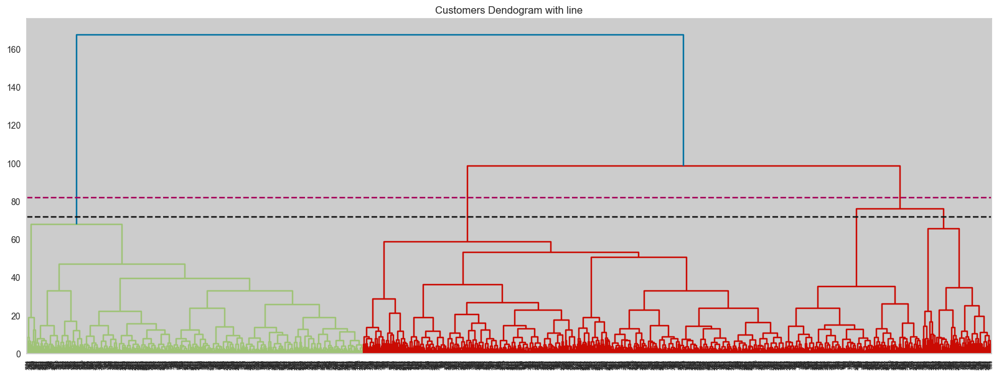

In [403]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(20, 7))
plt.title("Customers Dendogram with line")
clusters = shc.linkage(df_pca, 
            method='ward', 
            metric="euclidean")
shc.dendrogram(clusters)
plt.axhline(y = 72, color = 'k', linestyle = '--')
plt.axhline(y = 82, color = 'm', linestyle = '--')

Por medio de los dendogramas las mejores opciones de K sería 3 y 4

##### **k = 3**

In [404]:
df_AggClu_ward_k3 = df_pca.copy()
AggClu_ward_k3 = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
AggClu_ward_k3.fit(df_pca)
df_AggClu_ward_k3["Cluster"] = AggClu_ward_k3.labels_

round(df_AggClu_ward_k3["Cluster"].value_counts(normalize=True)*100,2)

Cluster
2    43.72
1    34.89
0    21.39
Name: proportion, dtype: float64

In [405]:
model = AggClu_ward_k3
df_model = df_AggClu_ward_k3

In [406]:
silhouette_agglomerative_k4 = silhouette_score(df_pca, model.labels_)
print(f'Silhouette Score Aglomerativo (K={len(set(model.labels_))}): {round(silhouette_agglomerative_k4,4)}')

Silhouette Score Aglomerativo (K=3): 0.1699


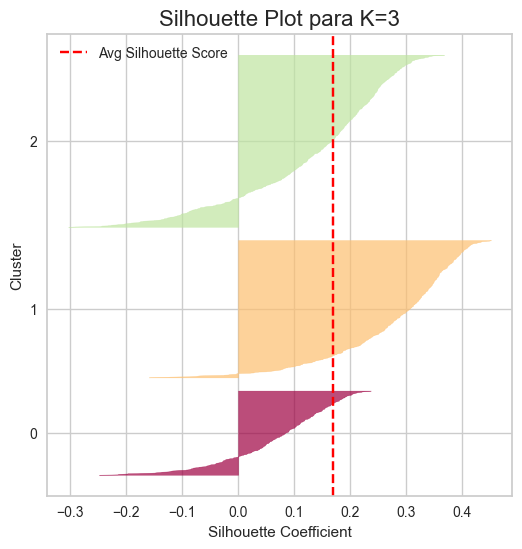

In [407]:
# silhouette_samples
# Obtener etiquetas de cluster del modelo
y_pred = df_model["Cluster"].values  
k = len(set(y_pred))  # Cantidad de clusters

# Calcular los coeficientes de Silhouette
silhouette_coefficients = silhouette_samples(df_pca, y_pred)
silhouette_avg = silhouette_score(df_pca, y_pred)  # Promedio general

# Crear la figura
plt.figure(figsize=(6, 6))

padding = len(df_pca) // 30  # Espaciado entre clusters
pos = padding  
ticks = []  

# Iterar sobre cada cluster
for i in range(k):
    coeffs = silhouette_coefficients[y_pred == i]  # Filtrar por cluster
    coeffs.sort()

    color = mpl.cm.Spectral(i / k)  # Colores
    plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                      facecolor=color, edgecolor=color, alpha=0.7)
    
    ticks.append(pos + len(coeffs) // 2)  # Posición del cluster en la gráfica
    pos += len(coeffs) + padding  

# Configurar ejes y leyenda
plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))

plt.xlabel("Silhouette Coefficient")
plt.ylabel("Cluster")
plt.tick_params(labelbottom=True)

# Línea roja indicando el promedio del silhouette score
plt.axvline(x=silhouette_avg, color="red", linestyle="--", label="Avg Silhouette Score")
plt.title(f"Silhouette Plot para K={k}", fontsize=16)
plt.legend()
plt.show()

In [408]:
# Definir el número de clusters
num_clusters = len(set(model.labels_))

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Asignar colores correctamente
colors_mapped = [color_map_normalized[str(label)] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC2"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(58,82,139)', '1': 'rgb(32,144,140)', '2': 'rgb(94,201,97)'}
{'0': (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), '1': (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), '2': (0.3686274509803922, 0.788235294117647, 0.3803921568627451)}
[(0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.22745098039215686, 0.3215686274509804, 0.5450980392156862), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.3686274509803922, 0.788235294117647, 0.3803921568627451), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412, 0.5490196078431373), (0.12549019607843137, 0.5647058823529412

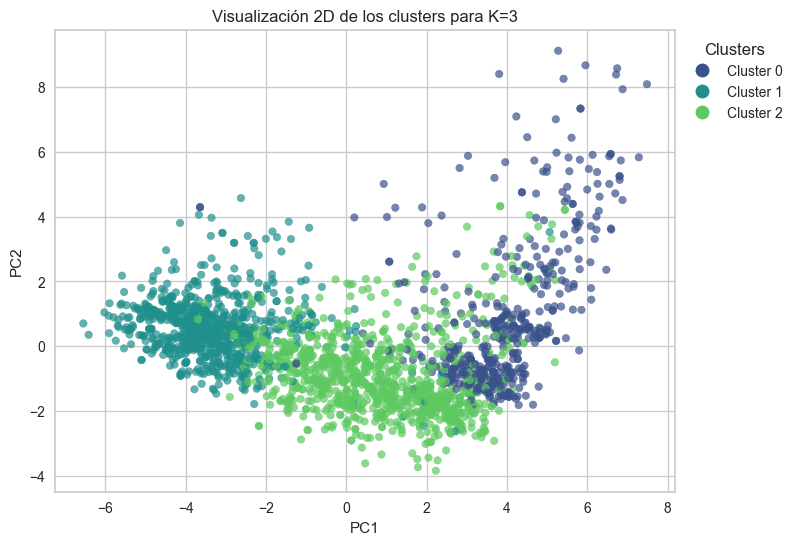

In [409]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=4
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


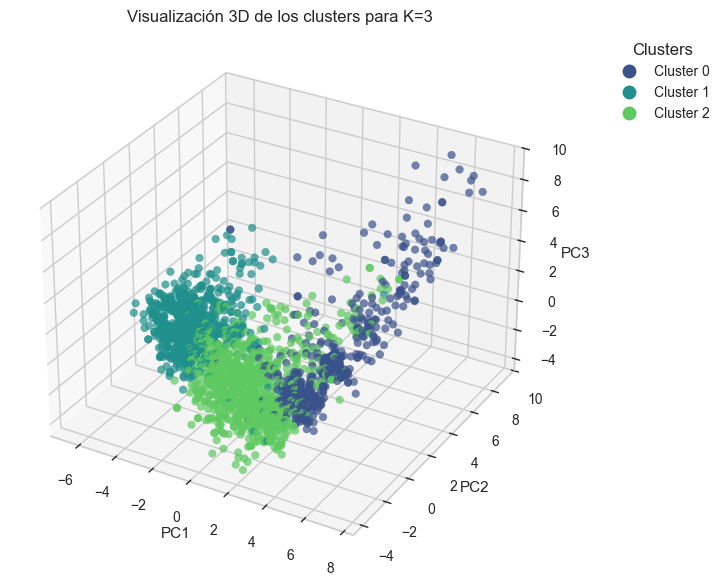

In [410]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [411]:
# 'Clusters en 3D con K=3'
df_AggClu_ward_3D = df_pca.iloc[:, :3].copy()
df_AggClu_ward_3D['Cluster'] = AggClu_ward.labels_
df_AggClu_ward_3D['Cluster'] = df_AggClu_ward_3D['Cluster'].astype(str)

# Invertir el orden asignación de colores
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_AggClu_ward_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

##### **k = 4**

In [412]:
df_AggClu_ward_k4 = df_pca.copy()
AggClu_ward_k4 = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='ward')
AggClu_ward_k4.fit(df_pca)
df_AggClu_ward_k4["Cluster"] = AggClu_ward_k4.labels_

round(df_AggClu_ward_k4["Cluster"].value_counts(normalize=True)*100,2)

Cluster
2    43.72
0    34.89
3    14.26
1     7.13
Name: proportion, dtype: float64

In [413]:
model = AggClu_ward_k4
df_model = df_AggClu_ward_k4
k = len(set(model.labels_))

In [414]:
silhouette_agglomerative_k4 = silhouette_score(df_pca, model.labels_)
print(f'Silhouette Score Aglomerativo (K={k}): {round(silhouette_agglomerative_k4,4)}')

Silhouette Score Aglomerativo (K=4): 0.1557


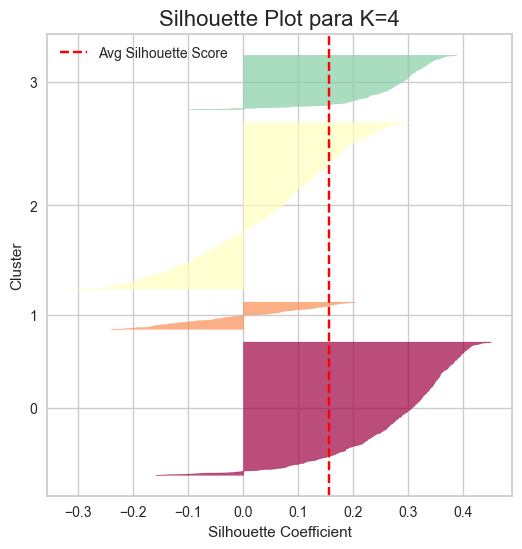

In [415]:
# silhouette_samples
# Obtener etiquetas de cluster del modelo
y_pred = df_model["Cluster"].values  
k = len(set(y_pred))  # Cantidad de clusters

# Calcular los coeficientes de Silhouette
silhouette_coefficients = silhouette_samples(df_pca, y_pred)
silhouette_avg = silhouette_score(df_pca, y_pred)  # Promedio general

# Crear la figura
plt.figure(figsize=(6, 6))

padding = len(df_pca) // 30  # Espaciado entre clusters
pos = padding  
ticks = []  

# Iterar sobre cada cluster
for i in range(k):
    coeffs = silhouette_coefficients[y_pred == i]  # Filtrar por cluster
    coeffs.sort()

    color = mpl.cm.Spectral(i / k)  # Colores
    plt.fill_betweenx(np.arange(pos, pos + len(coeffs)), 0, coeffs,
                      facecolor=color, edgecolor=color, alpha=0.7)
    
    ticks.append(pos + len(coeffs) // 2)  # Posición del cluster en la gráfica
    pos += len(coeffs) + padding  

# Configurar ejes y leyenda
plt.gca().yaxis.set_major_locator(FixedLocator(ticks))
plt.gca().yaxis.set_major_formatter(FixedFormatter(range(k)))

plt.xlabel("Silhouette Coefficient")
plt.ylabel("Cluster")
plt.tick_params(labelbottom=True)

# Línea roja indicando el promedio del silhouette score
plt.axvline(x=silhouette_avg, color="red", linestyle="--", label="Avg Silhouette Score")
plt.title(f"Silhouette Plot para K={k}", fontsize=16)
plt.legend()
plt.show()

In [416]:
# Definir el número de clusters
num_clusters = len(set(model.labels_))

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Asignar colores correctamente
colors_mapped = [color_map_normalized[str(label)] for label in model.labels_]

x = df_model["PC1"]
y = df_model["PC2"]
z = df_model["PC2"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294)}
[(0.4745098039215686, 0.8196078431372549, 0.3176470588235294), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.4745098039215686, 0.8196078431372549, 0.3176470588235294), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.

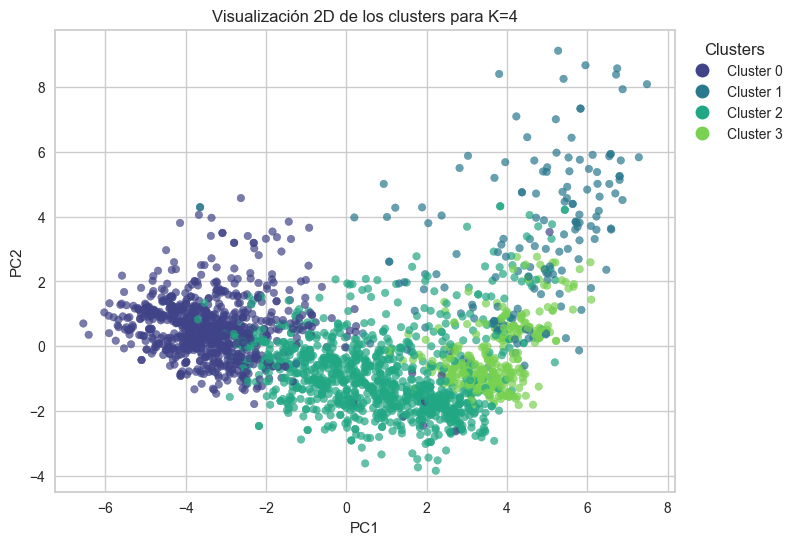

In [417]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=4
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


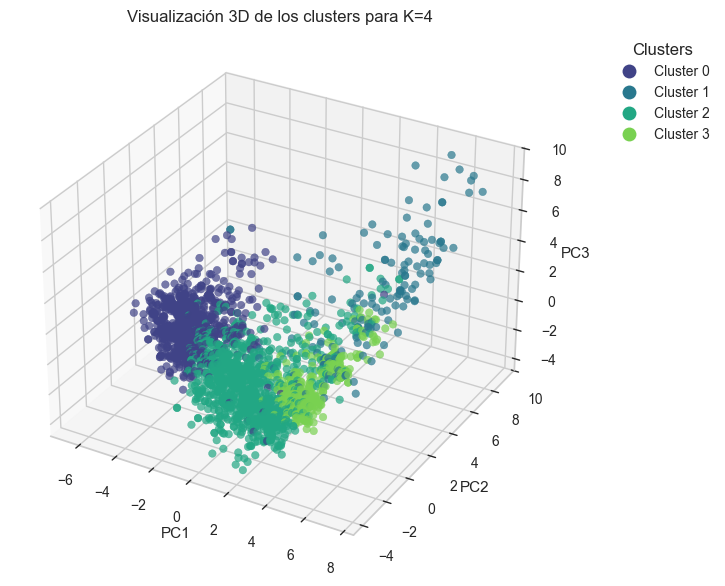

In [418]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [419]:
# 'Clusters en 3D con K=4'
df_AggClu_ward_3D = df_pca.iloc[:, :3].copy()
df_AggClu_ward_3D['Cluster'] = model.labels_
df_AggClu_ward_3D['Cluster'] = df_AggClu_ward_3D['Cluster'].astype(str)

# Invertir el orden asignación de colores
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_AggClu_ward_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### Distancia entre cluster: "AVERAGE"

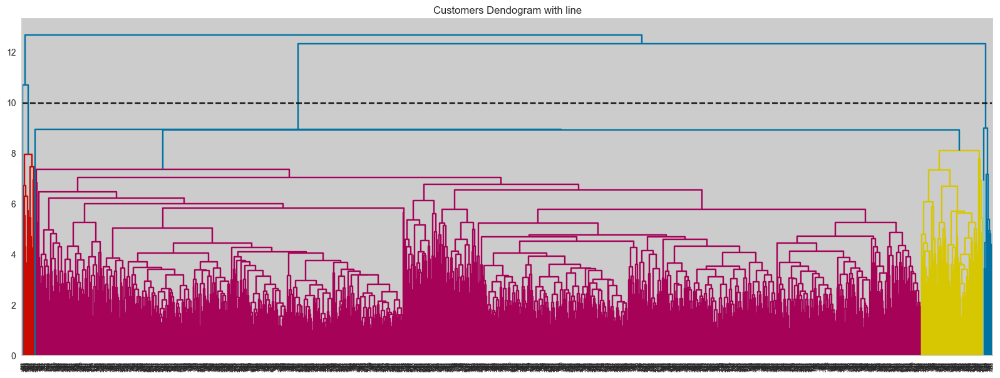

In [129]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(20, 7))
plt.title("Customers Dendogram with line")
clusters = shc.linkage(df_pca, 
            method='average', 
            metric="euclidean")
shc.dendrogram(clusters)
plt.axhline(y = 10, color = 'k', linestyle = '--')

In [130]:
df_AggClu_avg = df_pca.copy()
AggClu_avg = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='average')
AggClu_avg.fit(df_pca)
df_AggClu_avg["Cluster"] = AggClu_avg.labels_

round(df_AggClu_avg["Cluster"].value_counts(normalize=True)*100,2)

Cluster
2    97.71
1     1.26
0     0.94
3     0.09
Name: proportion, dtype: float64

- Se descarta por el desequilibrio de resultados, de todas formas visualizo el resultado para K4

##### Visualización **k = 4**

In [131]:
# Definir el número de clusters
num_clusters = len(set(AggClu_avg.labels_))

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Asignar colores correctamente
colors_mapped = [color_map_normalized[str(label)] for label in AggClu_avg.labels_]

x = df_AggClu_avg["PC1"]
y = df_AggClu_avg["PC2"]
z = df_AggClu_avg["PC2"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294)}
[(0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (

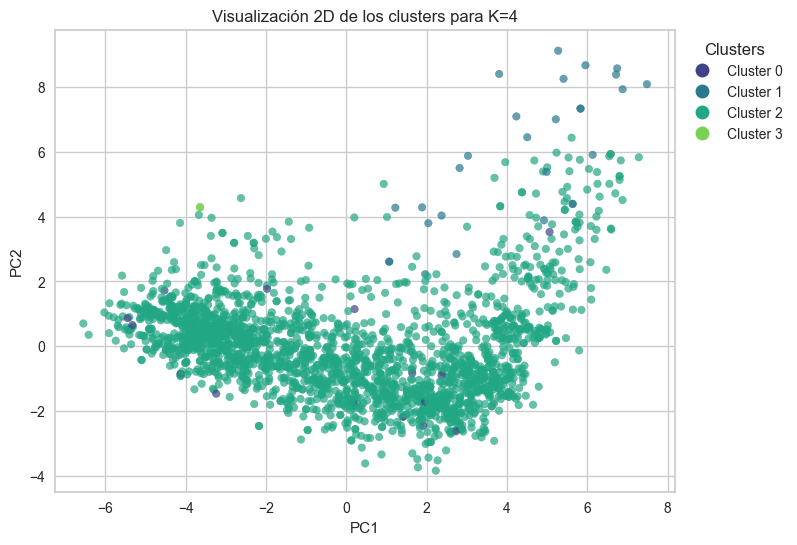

In [132]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=4
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


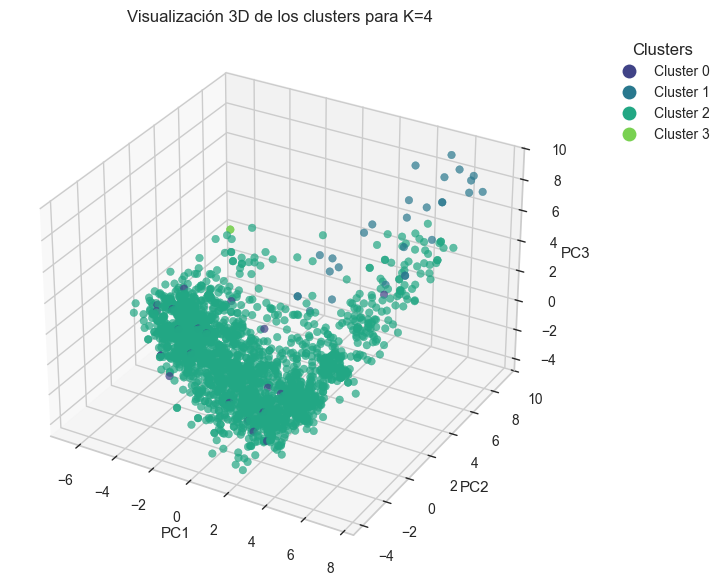

In [133]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [134]:
# 'Clusters en 3D con K=4'
df_AggClu_avg_3d = df_pca.iloc[:, :3].copy()
df_AggClu_avg_3d['Cluster'] = AggClu_avg.labels_
df_AggClu_avg_3d['Cluster'] = df_AggClu_avg_3d['Cluster'].astype(str)

# Invertir el orden asignación de colores
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_AggClu_avg_3d, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

#### Distancia entre cluster: "COMPLETE"

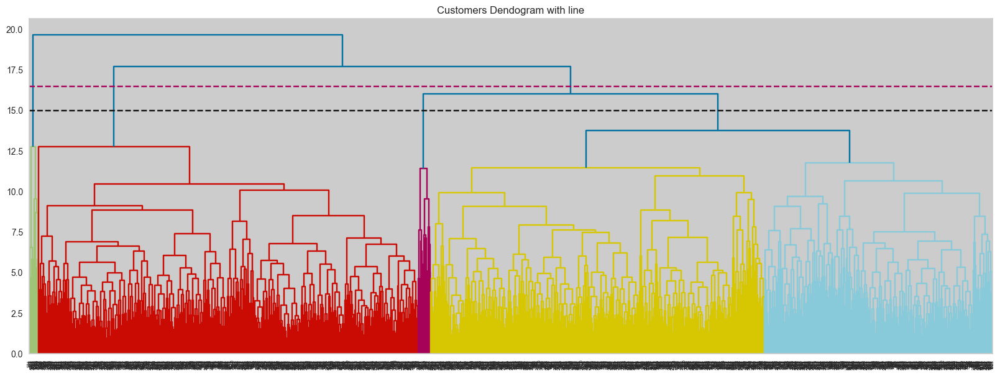

In [135]:
import scipy.cluster.hierarchy as shc

plt.figure(figsize=(20, 7))
plt.title("Customers Dendogram with line")
clusters = shc.linkage(df_pca, 
            method='complete', 
            metric="euclidean")
shc.dendrogram(clusters)
plt.axhline(y = 15, color = 'k', linestyle = '--')
plt.axhline(y = 16.5, color = 'm', linestyle = '--')

In [136]:
df_AggClu_com = df_pca.copy()
AggClu_com = AgglomerativeClustering(n_clusters=4, metric='euclidean', linkage='complete')
AggClu_com.fit(df_pca)
df_AggClu_com["Cluster"] = AggClu_com.labels_

round(df_AggClu_com["Cluster"].value_counts(normalize=True)*100,2)

Cluster
0    58.34
2    39.46
3     1.26
1     0.94
Name: proportion, dtype: float64

- Se descarta por el desequilibrio de resultados (se aglomera en dos clases), de todas formas visualizo el resultado para K4

##### Visualización **k = 4**

In [137]:
# Definir el número de clusters
num_clusters = len(set(AggClu_com.labels_))

# Obtener la paleta de colores en formato RGB y crear el diccionario color_map
color_map = {str(i): f"rgb({int(r*255)},{int(g*255)},{int(b*255)})" 
             for i, (r, g, b) in enumerate(sns.color_palette("viridis", num_clusters))}

# Convertir "rgb(r,g,b)" a tupla (r/255, g/255, b/255) para Matplotlib
color_map_normalized = {k: tuple(int(c) / 255 for c in v[4:-1].split(",")) 
                        for k, v in color_map.items()}


# Asignar colores correctamente
colors_mapped = [color_map_normalized[str(label)] for label in AggClu_com.labels_]

x = df_AggClu_com["PC1"]
y = df_AggClu_com["PC2"]
z = df_AggClu_com["PC2"]

print(color_map)  # Diccionario en formato "rgb(r,g,b)"
print(color_map_normalized)
print(colors_mapped)  # Lista de colores normalizados para Matplotlib

{'0': 'rgb(64,67,135)', '1': 'rgb(41,120,142)', '2': 'rgb(34,167,132)', '3': 'rgb(121,209,81)'}
{'0': (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), '1': (0.1607843137254902, 0.47058823529411764, 0.5568627450980392), '2': (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), '3': (0.4745098039215686, 0.8196078431372549, 0.3176470588235294)}
[(0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.25098039215686274, 0.2627450980392157, 0.5294117647058824), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (0.13333333333333333, 0.6549019607843137, 0.5176470588235295), (

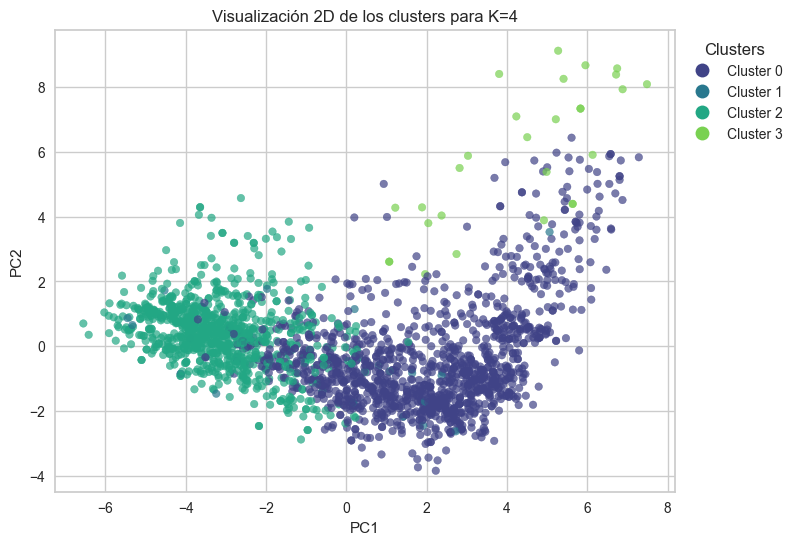

In [138]:
# VISUALIZACIÓN EN 2D -> usando PC1 y PC2 para K=4
plt.figure(figsize=(8, 6))

# Puntos de datos con colores según los clusters
scatter = plt.scatter(x, y,  
                      c=colors_mapped,  
                      alpha=0.7, s=30, label="Puntos de datos")

plt.title(f'Visualización 2D de los clusters para K={num_clusters}')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid(True)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1, 1))

plt.show()


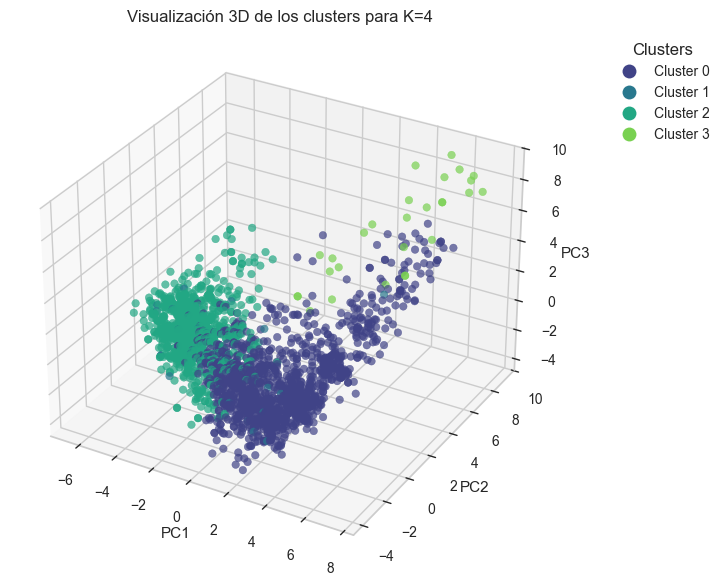

In [139]:
# VISUALIZACIÓN EN 3D -> usando dos componentes principales PC1, PC2 Y PC3 para K = 4
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Puntos de datos con colores según los clusters
scatter = ax.scatter(x, y, z, 
                     c= colors_mapped, 
                     alpha=0.7, s=30)

# Configurar el título y etiquetas de los ejes
ax.set_title(f'Visualización 3D de los clusters para K={num_clusters}')
ax.set_xlabel('PC1')
ax.set_ylabel('PC2')
ax.set_zlabel('PC3')

# Ajustar la vista inicial para mejor ángulo
#ax.view_init(elev=40, azim=45)

# Agregar leyenda con los colores de los clusters
legend_labels = [f'Cluster {i}' for i in color_map_normalized.keys()]
legend_patches = [plt.Line2D([0], [0], 
                             marker='o', 
                             color='w', 
                             markerfacecolor = color_map_normalized[str(i)], 
                             markersize=10) for i in color_map_normalized.keys()]

plt.legend(handles=legend_patches, 
           labels=legend_labels, 
           title="Clusters",
           loc='upper left', bbox_to_anchor=(1.1, 1))

plt.show()

In [140]:
# 'Clusters en 3D con K=4'
df_AggClu_com_3D = df_pca.iloc[:, :3].copy()
df_AggClu_com_3D['Cluster'] = AggClu_com.labels_
df_AggClu_com_3D['Cluster'] = df_AggClu_com_3D['Cluster'].astype(str)

# Invertir el orden asignación de colores
#color_sequence = [cluster_colors[i] for i in sorted(cluster_colors.keys(), reverse=True)]

# Crear la figura 3D con colores corregidos
fig = px.scatter_3d(df_AggClu_com_3D, 
                    x='PC1', y='PC2', z='PC3', 
                    color = "Cluster", 
                    title = f'Clusters en 3D con K={num_clusters}', 
                    color_discrete_map = color_map,
                    category_orders= {"Cluster" : ["0", "1", "2", "3"]})


fig.update_traces(marker=dict(size=4, opacity=0.7))
fig.update_layout(width=800, height=700, 
                  legend=dict(font=dict(size=14)))

# Actualizar nombres de leyenda correctamente
fig.for_each_trace(lambda t: t.update(
    name=f"Cluster {t.name}", 
    legendgroup=f"Cluster {t.name}", 
    hovertemplate=t.hovertemplate.replace(t.name, f"Cluster {t.name}")
))

fig.show()

## 9 Evaluacion

In [141]:
kmeans_k4 = kmeans_per_k[2]

df_knn = df_pca.copy()
df_knn['Cluster'] = kmeans_k4.labels_
df_knn

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,Cluster
0,4.150463,-0.223490,0.015195,2.844280,-1.871519,-0.160210,0.026971,0.093211,0.383286,-1.047731,1.210853,-0.376559,-0.011175,1.562442,1
1,-3.906083,0.445965,-0.371133,-1.042206,-0.896508,0.275020,0.310529,0.067807,-1.830978,-0.973297,0.659414,-0.535629,-0.313218,-0.338954,2
2,2.547821,-1.123240,-1.260134,-0.156397,0.366212,0.225192,-0.814919,0.563791,-0.064435,0.616017,0.506736,0.912407,0.325794,0.241557,1
3,-3.234401,0.291119,-0.923090,0.079208,1.087379,0.196224,-0.945407,0.339505,-0.313778,0.506573,-0.831678,0.115733,0.194358,0.591730,2
4,0.753834,-1.681054,0.225655,-0.434102,0.654781,-0.173348,0.514338,-1.017224,0.448042,0.350390,-1.532158,-0.696240,0.342655,1.557493,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2225,2.537443,-1.998357,0.218334,0.684516,0.968170,0.211832,-0.194194,-0.132155,-0.192931,0.107369,0.339482,0.308666,0.046746,0.517319,1
2226,-1.245266,-0.530542,4.755928,-2.905572,0.587955,0.966616,0.639253,-0.385532,-1.626060,-2.213767,-0.851081,0.503682,2.945296,-0.301333,0
2227,2.891619,0.918299,-1.040368,-0.354998,-1.007391,-2.976847,0.224577,-0.723180,-0.512485,0.754546,-1.471203,1.730191,-1.441453,0.289713,1
2228,2.465425,-1.764041,0.112491,-1.488946,0.051551,1.385130,-0.824690,0.708121,-0.638081,0.504737,0.384367,0.074697,0.209934,0.452940,1


In [142]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier

In [143]:
train_set, test_set = train_test_split(df_knn, 
                                             test_size = 80, 
                                             stratify= df_knn["Cluster"], 
                                             random_state= 42)

In [144]:
knn = KNeighborsClassifier()
target = "Cluster"
X_train = train_set.drop(target, axis = 1) # No uso dataset de test, porque no lo necesito, optimizare con cross_val y predeciremos contra X_new
y_train = train_set[target]

In [145]:
param_grid = {
    "n_neighbors": [2,3,5,10],
    "weights": ["uniform","distance"]
}

knn_grid = GridSearchCV(knn,
                        param_grid = param_grid,
                        cv = 4, # un "train-test" split un poco mayor del 20%
                        scoring = "balanced_accuracy" # Multiclase en el que todos son importantes
                        )

knn_grid.fit(X_train, y_train)

GridSearchCV(cv=4, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': [2, 3, 5, 10],
                         'weights': ['uniform', 'distance']},
             scoring='balanced_accuracy')

In [146]:
print(knn_grid.best_params_)
print(knn_grid.best_score_)

{'n_neighbors': 10, 'weights': 'distance'}
0.9313732660210214


In [147]:
from sklearn.metrics import classification_report

print(classification_report(y_train, knn_grid.best_estimator_.predict(X_train)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       617
           1       1.00      1.00      1.00       569
           2       1.00      1.00      1.00       812
           3       1.00      1.00      1.00       152

    accuracy                           1.00      2150
   macro avg       1.00      1.00      1.00      2150
weighted avg       1.00      1.00      1.00      2150



In [148]:
x_test = test_set.drop(target, axis = 1)
x_test

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14
1344,1.149398,-0.731817,-1.195054,0.308284,0.171505,0.199912,-1.056183,0.340205,1.130095,0.961835,-0.821885,0.059530,0.623859,0.853499
1447,-0.601236,-0.974626,0.017843,0.588526,0.793009,-0.102210,-0.351868,0.100681,0.378235,0.017766,0.248919,-0.159448,-0.033628,-0.087401
34,2.915435,-1.245338,-0.577867,-0.617781,-0.707896,0.792371,-1.136499,1.143564,0.963225,0.259285,1.864739,0.593498,0.552929,-0.045746
1322,2.223169,-2.528027,2.299170,-0.204484,-0.662846,0.470635,-0.948683,0.534041,0.298924,0.874334,-0.146838,0.508555,0.587836,-0.890137
262,-0.736973,-1.090848,0.309607,-1.384865,0.159649,0.023843,0.464459,-0.828954,0.127508,0.257039,-1.036650,-0.074605,0.538627,1.537189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11,-2.872491,0.552720,-1.901955,2.145024,1.084639,-1.283847,-0.373889,0.008815,0.910877,-0.014143,1.117655,1.085473,0.144998,0.090919
1699,-0.437674,-1.470410,1.872744,-1.670520,-0.676943,-0.161126,0.489296,-0.920679,0.379949,0.907801,-1.699669,0.653100,0.562508,0.459692
1281,0.691149,-1.226056,-1.323593,2.164905,1.097029,-1.329198,0.618289,-0.535714,0.303069,-0.877385,2.510866,0.996187,0.159030,0.865209
945,1.872817,-1.692301,-0.868040,0.592509,2.103709,-0.141338,-0.060050,-0.339284,-1.482045,0.427521,-0.744025,-0.113070,-0.429326,0.332073


In [149]:
y_pred = knn_grid.best_estimator_.predict(x_test)

In [150]:
x_test["Cluster"] = y_pred
x_test

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,Cluster
1344,1.149398,-0.731817,-1.195054,0.308284,0.171505,0.199912,-1.056183,0.340205,1.130095,0.961835,-0.821885,0.059530,0.623859,0.853499,1
1447,-0.601236,-0.974626,0.017843,0.588526,0.793009,-0.102210,-0.351868,0.100681,0.378235,0.017766,0.248919,-0.159448,-0.033628,-0.087401,0
34,2.915435,-1.245338,-0.577867,-0.617781,-0.707896,0.792371,-1.136499,1.143564,0.963225,0.259285,1.864739,0.593498,0.552929,-0.045746,1
1322,2.223169,-2.528027,2.299170,-0.204484,-0.662846,0.470635,-0.948683,0.534041,0.298924,0.874334,-0.146838,0.508555,0.587836,-0.890137,0
262,-0.736973,-1.090848,0.309607,-1.384865,0.159649,0.023843,0.464459,-0.828954,0.127508,0.257039,-1.036650,-0.074605,0.538627,1.537189,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11,-2.872491,0.552720,-1.901955,2.145024,1.084639,-1.283847,-0.373889,0.008815,0.910877,-0.014143,1.117655,1.085473,0.144998,0.090919,2
1699,-0.437674,-1.470410,1.872744,-1.670520,-0.676943,-0.161126,0.489296,-0.920679,0.379949,0.907801,-1.699669,0.653100,0.562508,0.459692,0
1281,0.691149,-1.226056,-1.323593,2.164905,1.097029,-1.329198,0.618289,-0.535714,0.303069,-0.877385,2.510866,0.996187,0.159030,0.865209,0
945,1.872817,-1.692301,-0.868040,0.592509,2.103709,-0.141338,-0.060050,-0.339284,-1.482045,0.427521,-0.744025,-0.113070,-0.429326,0.332073,1


In [151]:
test_set

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,Cluster
1344,1.149398,-0.731817,-1.195054,0.308284,0.171505,0.199912,-1.056183,0.340205,1.130095,0.961835,-0.821885,0.059530,0.623859,0.853499,1
1447,-0.601236,-0.974626,0.017843,0.588526,0.793009,-0.102210,-0.351868,0.100681,0.378235,0.017766,0.248919,-0.159448,-0.033628,-0.087401,0
34,2.915435,-1.245338,-0.577867,-0.617781,-0.707896,0.792371,-1.136499,1.143564,0.963225,0.259285,1.864739,0.593498,0.552929,-0.045746,1
1322,2.223169,-2.528027,2.299170,-0.204484,-0.662846,0.470635,-0.948683,0.534041,0.298924,0.874334,-0.146838,0.508555,0.587836,-0.890137,0
262,-0.736973,-1.090848,0.309607,-1.384865,0.159649,0.023843,0.464459,-0.828954,0.127508,0.257039,-1.036650,-0.074605,0.538627,1.537189,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11,-2.872491,0.552720,-1.901955,2.145024,1.084639,-1.283847,-0.373889,0.008815,0.910877,-0.014143,1.117655,1.085473,0.144998,0.090919,2
1699,-0.437674,-1.470410,1.872744,-1.670520,-0.676943,-0.161126,0.489296,-0.920679,0.379949,0.907801,-1.699669,0.653100,0.562508,0.459692,0
1281,0.691149,-1.226056,-1.323593,2.164905,1.097029,-1.329198,0.618289,-0.535714,0.303069,-0.877385,2.510866,0.996187,0.159030,0.865209,1
945,1.872817,-1.692301,-0.868040,0.592509,2.103709,-0.141338,-0.060050,-0.339284,-1.482045,0.427521,-0.744025,-0.113070,-0.429326,0.332073,1


## 10 EVALUACIONES

In [440]:
# K=3
df_kmeans_K3 = df_backup_V2.copy()
kmeans_k3 = kmeans_per_k[1] # [1] equivalente a K=3
df_kmeans_K3['Cluster'] = kmeans_k3.labels_

df_dbscan_3 = df_backup_V2.copy()
df_dbscan_3['Cluster'] = dbscan_3.labels_

df_agg_K3 = df_backup_V2.copy()
df_agg_K3['Cluster'] = AggClu_ward_k3.labels_

# K=4
df_kmeans_K4 = df_backup_V2.copy()
kmeans_k4 = kmeans_per_k[2] # [2] equivalente a K=4
df_kmeans_K4['Cluster'] = kmeans_k4.labels_

df_dbscan_4 = df_backup_V2.copy()
df_dbscan_4['Cluster'] = dbscan_4.labels_

df_agg_K4  = df_backup_V2.copy()
df_agg_K4['Cluster'] = AggClu_ward_k4.labels_

# K=5
df_dbscan_5 = df_backup_V2.copy()
df_dbscan_5['Cluster'] = dbscan_5.labels_

In [441]:
# Shilouete score

models = [kmeans_k3, kmeans_k4, AggClu_ward_k3, AggClu_ward_k4, dbscan_3, dbscan_4, dbscan_5]

# Crear una lista de diccionarios con los resultados
silhouette_results = []
for model in models:
    # Calcular el silhouette score
    silhouette_score_value = silhouette_score(df_pca, model.labels_)

    # Si el modelo es DBSCAN, restar 1 al número de clusters (por las anomalías)
    if isinstance(model, DBSCAN):
        num_clusters = len(set(model.labels_)) - (1 if -1 in model.labels_ else 0)
    else:
        num_clusters = len(set(model.labels_))

    silhouette_results.append({
        "Modelo": type(model).__name__,
        "K": num_clusters,  # Usar el valor ajustado de K
        "Silhouette Score": round(silhouette_score_value, 3)
    })

# Convertir la lista en un DataFrame
df_silhouette = pd.DataFrame(silhouette_results).set_index("Modelo")
df_silhouette

,K,Silhouette Score
Modelo,,
KMeans,3,0.203
KMeans,4,0.196
AgglomerativeClustering,3,0.170
AgglomerativeClustering,4,0.156
DBSCAN,3,0.085
DBSCAN,4,0.140
DBSCAN,5,0.096


- Los modelos mas interesantes son KMeans y AgglomerativeClustering. DBSCAN, se podría descasrtar (tanto por su score de silueta como en la distribución que hacia de sus clusters)

In [424]:
print(people)
print(products)
print(place)
print(promotion)
print("")
people_num = [item for item in people if item not in features_cat_list]
print(features_cat_list)
print(people_num)

['Age', 'Education', 'Income', 'Status', 'Children', 'Fam_size', 'Client_days', 'Recency', 'Complain']
['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold', 'Total_spent', 'Avg_buy']
['Web', 'Catalog', 'Store', 'WebVisits']
['Deals', 'Cmp1', 'Cmp2', 'Cmp3', 'Cmp4', 'Cmp5', 'Response', 'Total_cmp']

['Education', 'Status']
['Age', 'Income', 'Children', 'Fam_size', 'Client_days', 'Recency', 'Complain']


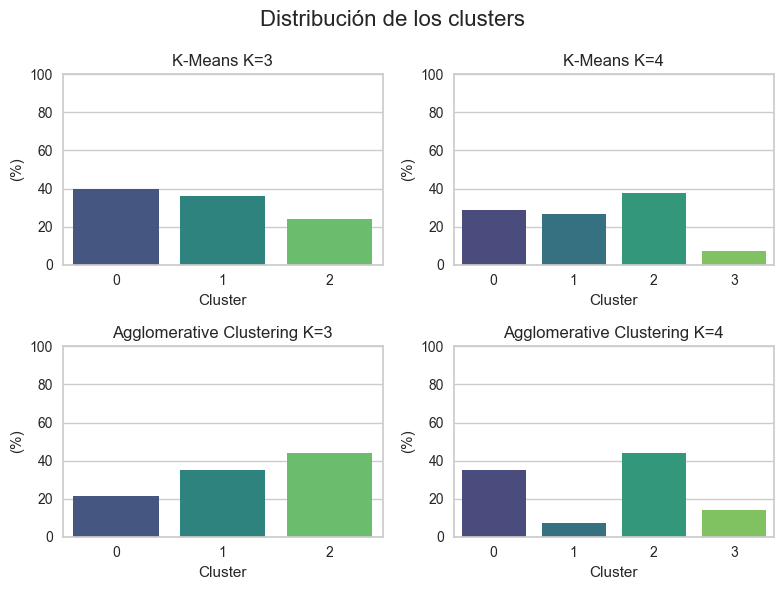

In [480]:
# Definir los modelos a mostrar en pares
models = [
    (df_kmeans_K3, "K-Means K=3"), 
    (df_kmeans_K4, "K-Means K=4"),
    (df_agg_K3, "Agglomerative Clustering K=3"),
    (df_agg_K4, "Agglomerative Clustering K=4")
]

# Configurar la figura con 2 filas y 2 columnas
fig, axes = plt.subplots(2, 2, figsize=(8, 6))

# Visualizar en los subgráficos
for i, (model_data, model_name) in enumerate(models):
    ax = axes[i//2, i%2]  # Selecciona el subgráfico correspondiente
    sns.countplot(data=model_data, x='Cluster', ax=ax, palette="viridis", stat="percent")  # Aquí se asume que la columna 'Cluster' tiene las etiquetas
    ax.set_title(f'{model_name}')
    ax.set_xlabel('Cluster')
    ax.set_ylabel('(%)')
    ax.set_ylim(0, 100) 

# Ajustar el diseño para que no se superpongan los títulos
plt.suptitle("Distribución de los clusters", fontsize=16)
plt.tight_layout()
plt.show()

### Correlacion

#### K = 3

##### Kmeans

In [431]:
corr_kmeans_K3 = df_kmeans_K3.corr(numeric_only= True)
corr_kmeans_K3["Cluster"].sort_values(ascending = False)

Cluster        1.000000
Total_spent    0.855039
Income         0.800507
Catalog        0.742069
Meat           0.741309
Wines          0.717163
Store          0.671072
Fish           0.621962
Fruits         0.576401
Sweets         0.568290
Avg_buy        0.550063
Web            0.509122
Gold           0.494810
Total_cmp      0.407346
Cmp5           0.406484
Cmp1           0.344269
Response       0.252064
Cmp4           0.226274
Age            0.137000
Cmp2           0.127612
Client_days    0.093450
Cmp3           0.033806
Recency        0.018783
Complain      -0.039923
Deals         -0.069688
Fam_size      -0.471665
Children      -0.542351
WebVisits     -0.580933
Name: Cluster, dtype: float64

##### Aglomerativo

In [436]:
corr_agg_K3 = df_agg_K3.corr(numeric_only= True)
corr_agg_K3["Cluster"].sort_values(ascending = False)

Cluster        1.000000
Income         0.650189
Total_spent    0.627175
Store          0.610151
Catalog        0.559470
Wines          0.526996
Meat           0.525819
Web            0.516686
Fish           0.450947
Fruits         0.446173
Sweets         0.423548
Gold           0.416982
Avg_buy        0.404674
Age            0.160157
Client_days    0.146256
Cmp5           0.133882
Deals          0.110106
Cmp4           0.073541
Response       0.038808
Recency        0.030347
Total_cmp      0.028575
Cmp2          -0.039541
Cmp3          -0.063854
Cmp1          -0.086976
Complain      -0.121399
Fam_size      -0.320352
Children      -0.387579
WebVisits     -0.426387
Name: Cluster, dtype: float64

#### K = 4

##### Kmeans

In [444]:
corr_kmeans_K4 = df_kmeans_K4.corr(numeric_only= True)
corr_kmeans_K4["Cluster"].sort_values(ascending = False)

Cluster        1.000000
Cmp5           0.364293
Total_cmp      0.317737
Cmp1           0.288038
Response       0.177039
Cmp2           0.173032
Cmp4           0.085062
Cmp3           0.047623
Complain       0.030061
Meat           0.001137
Sweets        -0.018121
Fish          -0.025042
Recency       -0.027297
Fruits        -0.038753
WebVisits     -0.056088
Avg_buy       -0.056472
Total_spent   -0.091868
Catalog       -0.124085
Wines         -0.125622
Fam_size      -0.132790
Children      -0.134684
Client_days   -0.159967
Income        -0.171630
Gold          -0.185052
Age           -0.211016
Store         -0.320070
Web           -0.432011
Deals         -0.475893
Name: Cluster, dtype: float64

##### Aglomerativo

In [445]:
corr_agg_K4 = df_agg_K4.corr(numeric_only= True)
corr_agg_K4["Cluster"].sort_values(ascending = False)

Cluster        1.000000
Income         0.650189
Total_spent    0.627175
Store          0.610151
Catalog        0.559470
Wines          0.526996
Meat           0.525819
Web            0.516686
Fish           0.450947
Fruits         0.446173
Sweets         0.423548
Gold           0.416982
Avg_buy        0.404674
Age            0.160157
Client_days    0.146256
Cmp5           0.133882
Deals          0.110106
Cmp4           0.073541
Response       0.038808
Recency        0.030347
Total_cmp      0.028575
Cmp2          -0.039541
Cmp3          -0.063854
Cmp1          -0.086976
Complain      -0.121399
Fam_size      -0.320352
Children      -0.387579
WebVisits     -0.426387
Name: Cluster, dtype: float64

### Visualizacion features

#### K = 3

##### Kmeans

In [ ]:
data = df_kmeans_K3

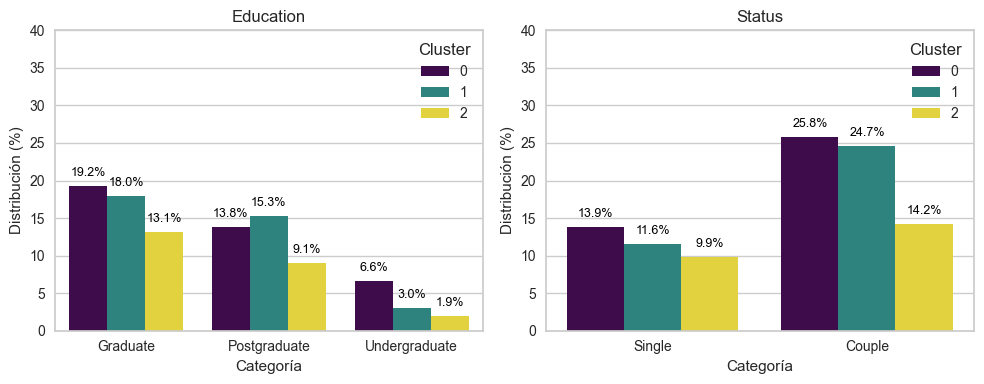

In [490]:
# Categoricas
# Configurar la figura con 1 fila y 2 columnas (ya que solo hay 2 variables)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Visualizar en los subgráficos
for idx, feature in enumerate(features_cat_list):  
    ax = axes[idx]  # Seleccionar el subgráfico correcto
    
    # Graficar el countplot con porcentaje
    sns.countplot(data= data, x=feature, ax=ax, hue='Cluster', palette="viridis", stat="percent")
    
    ax.set_title(f'{feature}')
    ax.set_xlabel('Categoría')
    ax.set_ylabel('Distribución (%)')
    ax.set_ylim(0, 40)  

    
    # Mostrar valores en el gráfico
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Evitar etiquetas en barras sin datos
            ax.annotate(f'{height:.1f}%', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=9, color='black', 
                        xytext=(0, 5), textcoords='offset points')  

plt.tight_layout()
plt.show()

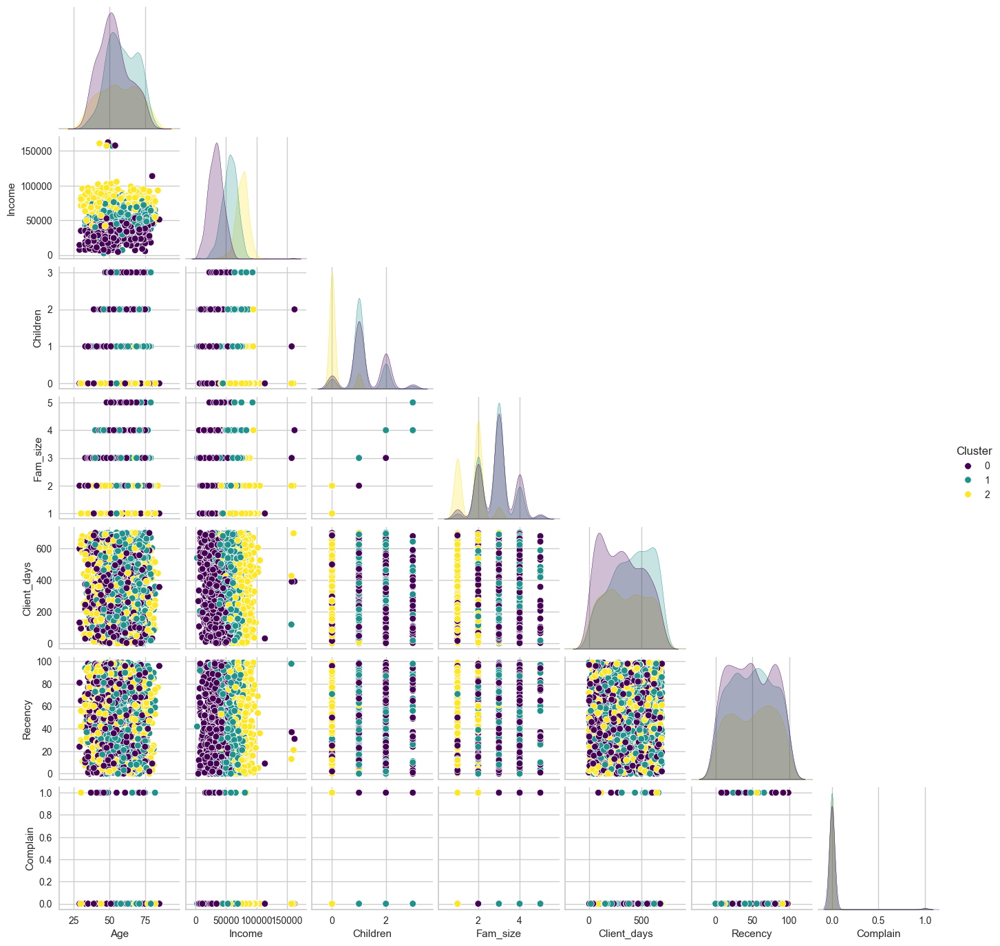

In [493]:
sns.pairplot(data[people + ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

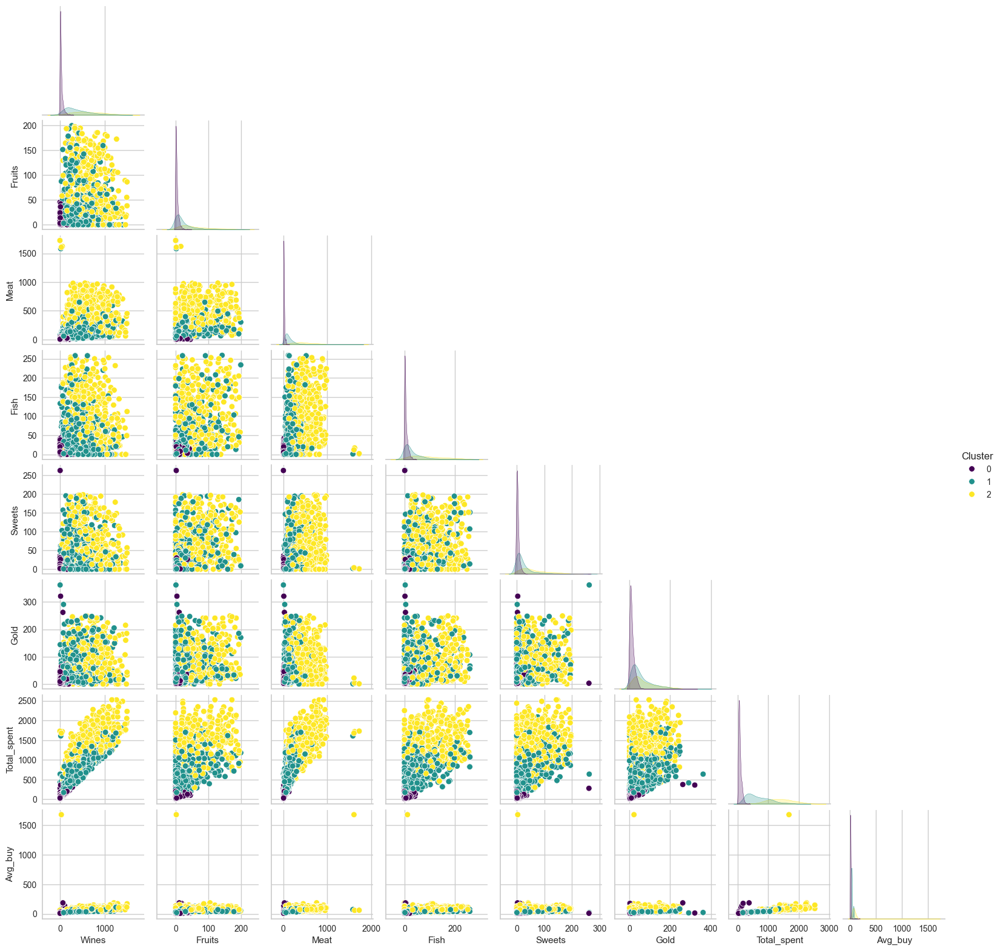

In [494]:
sns.pairplot(data[ products+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

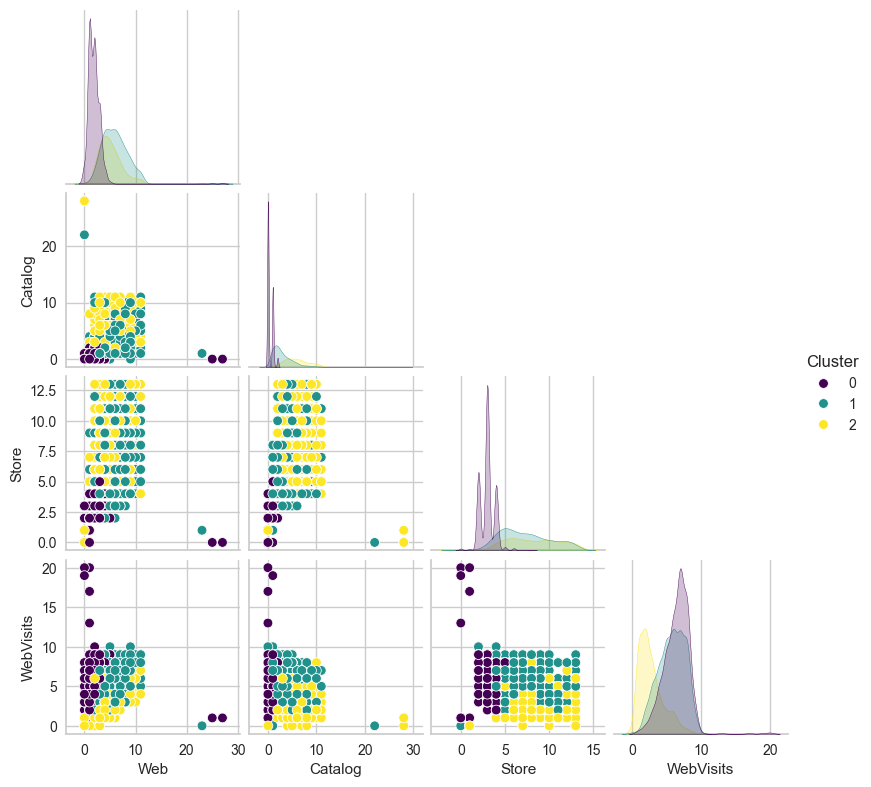

In [495]:
sns.pairplot(data[ place+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

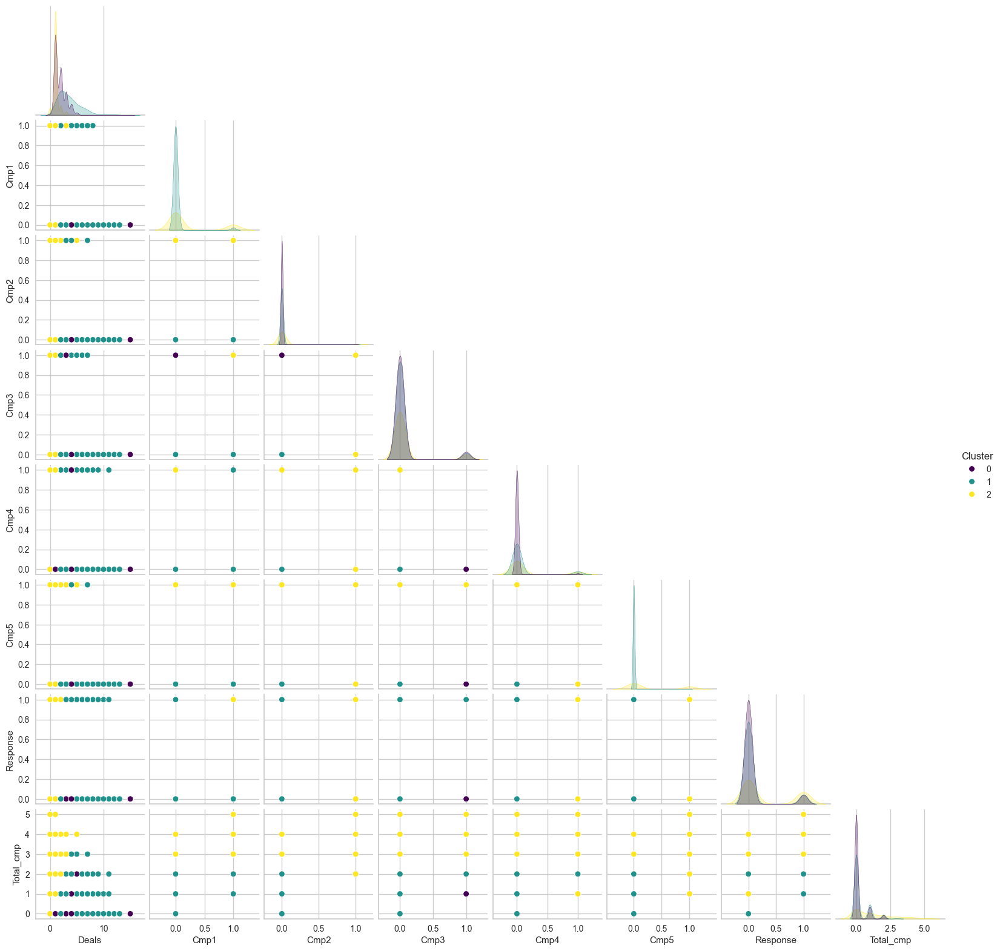

In [496]:
sns.pairplot(data[ promotion+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

##### Aglomerativo

In [497]:
data = df_agg_K3

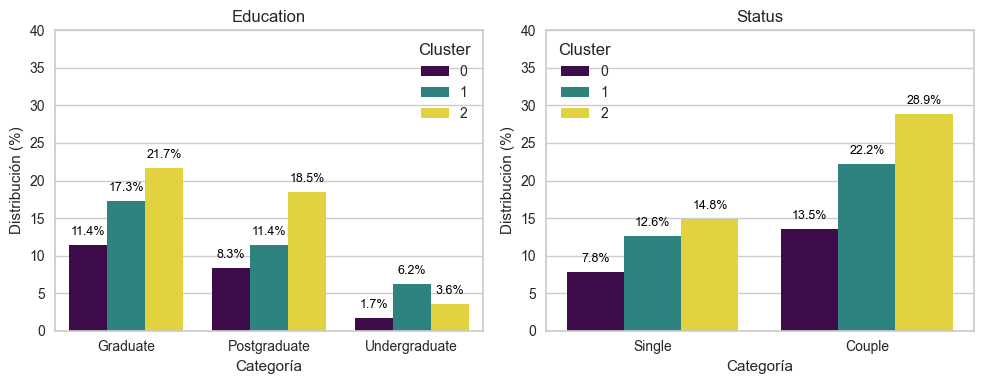

In [498]:
# Categoricas
# Configurar la figura con 1 fila y 2 columnas (ya que solo hay 2 variables)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Visualizar en los subgráficos
for idx, feature in enumerate(features_cat_list):  
    ax = axes[idx]  # Seleccionar el subgráfico correcto
    
    # Graficar el countplot con porcentaje
    sns.countplot(data= data, x=feature, ax=ax, hue='Cluster', palette="viridis", stat="percent")
    
    ax.set_title(f'{feature}')
    ax.set_xlabel('Categoría')
    ax.set_ylabel('Distribución (%)')
    ax.set_ylim(0, 40)  

    
    # Mostrar valores en el gráfico
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Evitar etiquetas en barras sin datos
            ax.annotate(f'{height:.1f}%', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=9, color='black', 
                        xytext=(0, 5), textcoords='offset points')  

plt.tight_layout()
plt.show()

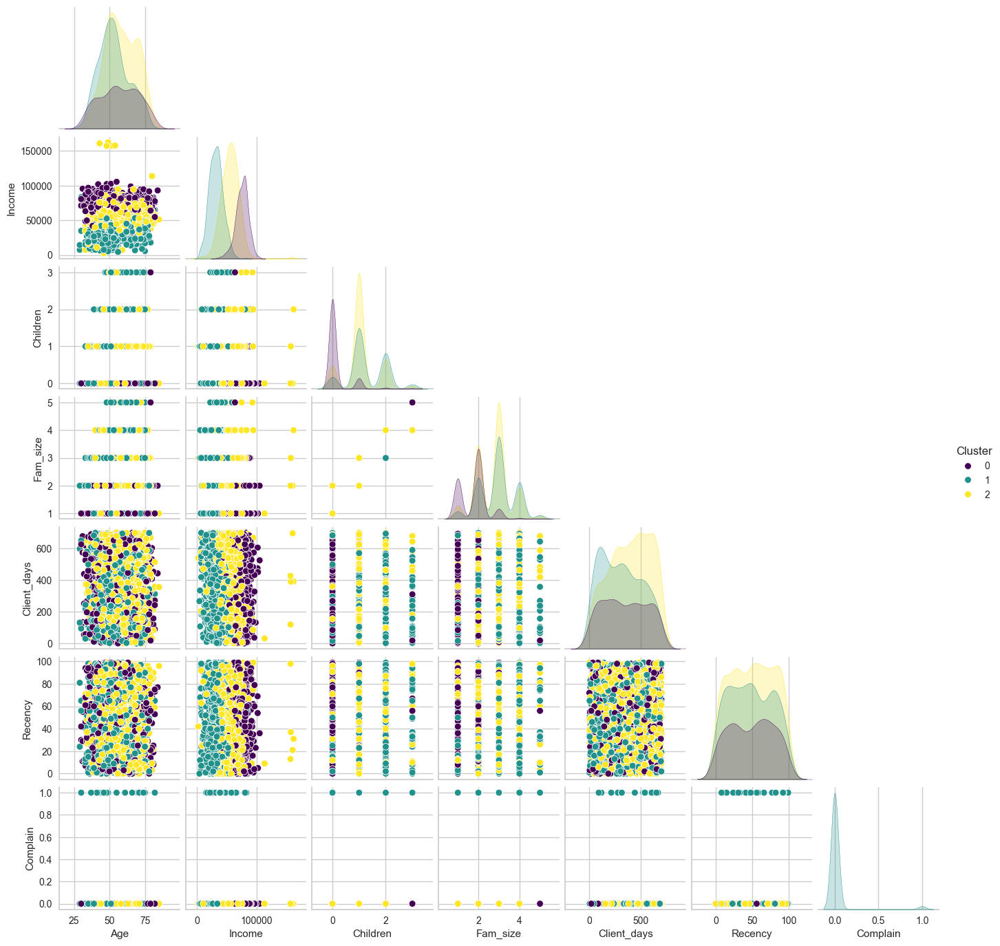

In [499]:
sns.pairplot(data[people + ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

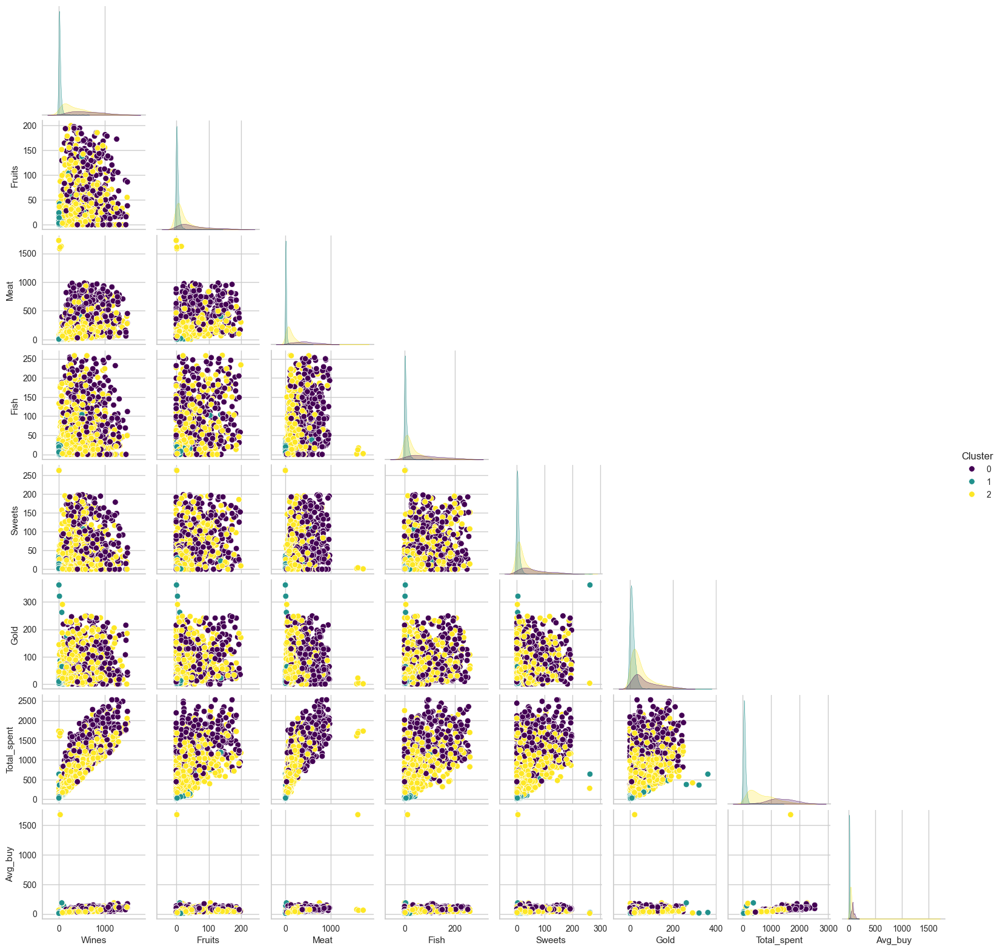

In [500]:
sns.pairplot(data[ products+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

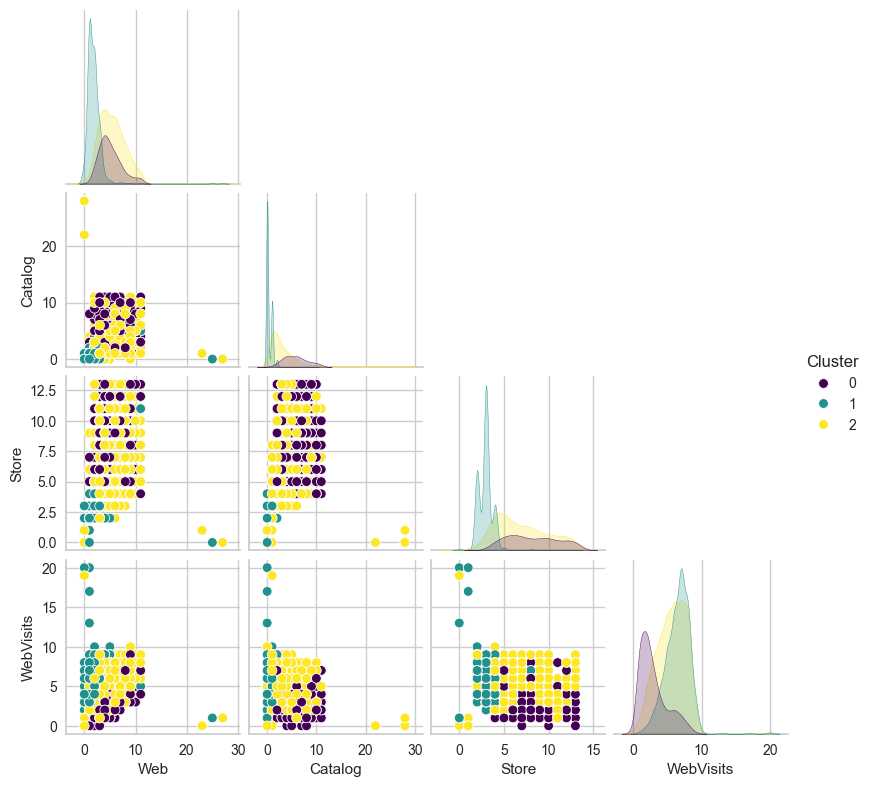

In [501]:
sns.pairplot(data[ place+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

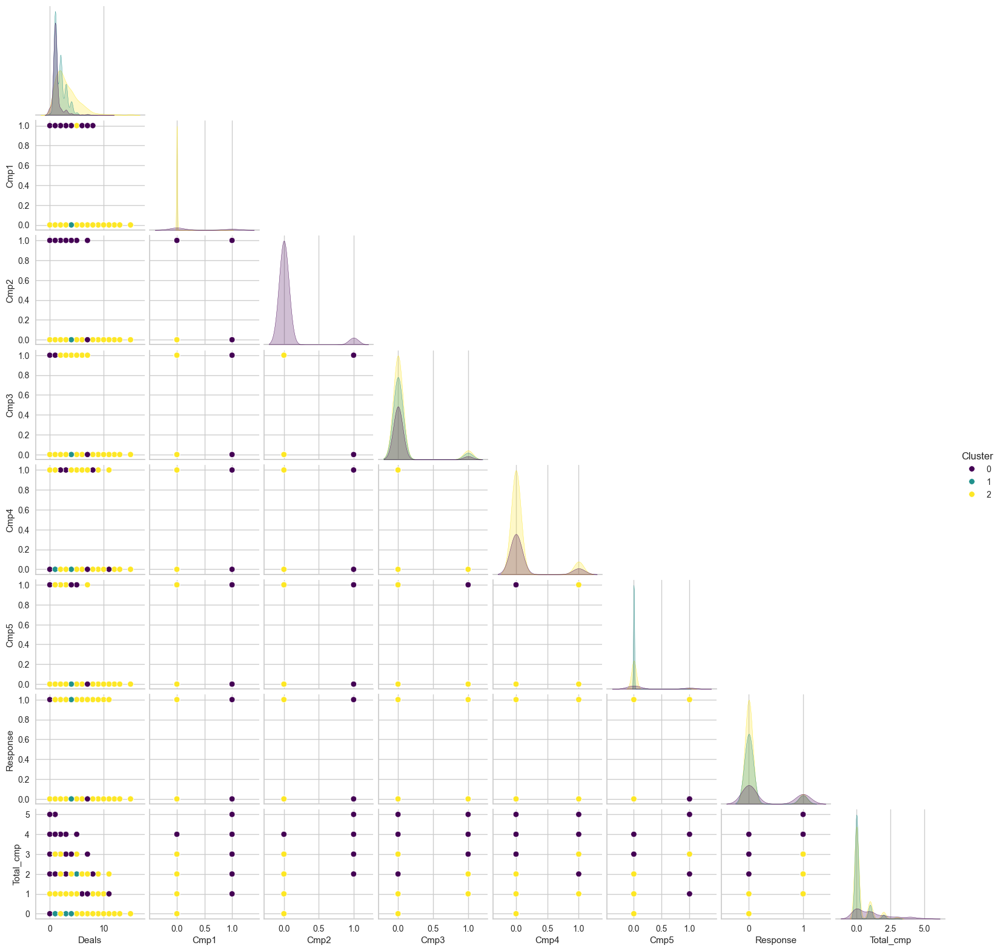

In [502]:
sns.pairplot(data[ promotion+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

#### K = 4

##### Kmeans

In [505]:
data = df_kmeans_K4

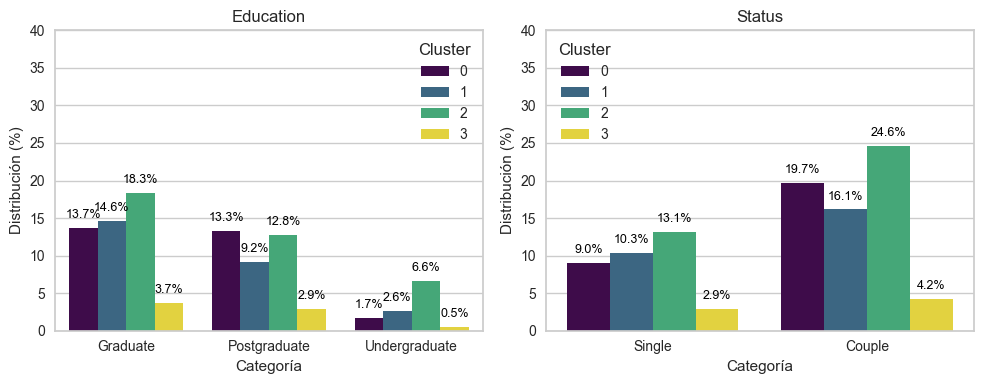

In [506]:
# Categoricas
# Configurar la figura con 1 fila y 2 columnas (ya que solo hay 2 variables)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Visualizar en los subgráficos
for idx, feature in enumerate(features_cat_list):  
    ax = axes[idx]  # Seleccionar el subgráfico correcto
    
    # Graficar el countplot con porcentaje
    sns.countplot(data= data, x=feature, ax=ax, hue='Cluster', palette="viridis", stat="percent")
    
    ax.set_title(f'{feature}')
    ax.set_xlabel('Categoría')
    ax.set_ylabel('Distribución (%)')
    ax.set_ylim(0, 40)  

    
    # Mostrar valores en el gráfico
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Evitar etiquetas en barras sin datos
            ax.annotate(f'{height:.1f}%', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=9, color='black', 
                        xytext=(0, 5), textcoords='offset points')  

plt.tight_layout()
plt.show()

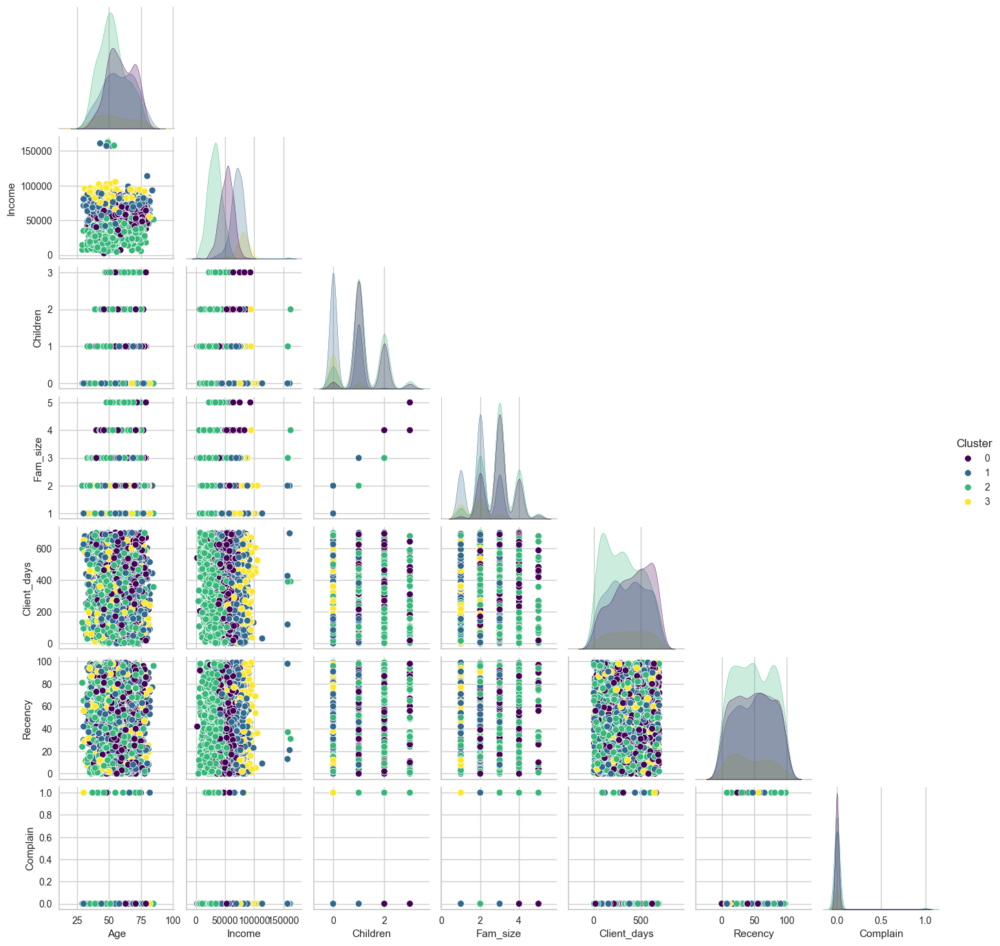

In [507]:
sns.pairplot(data[people + ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

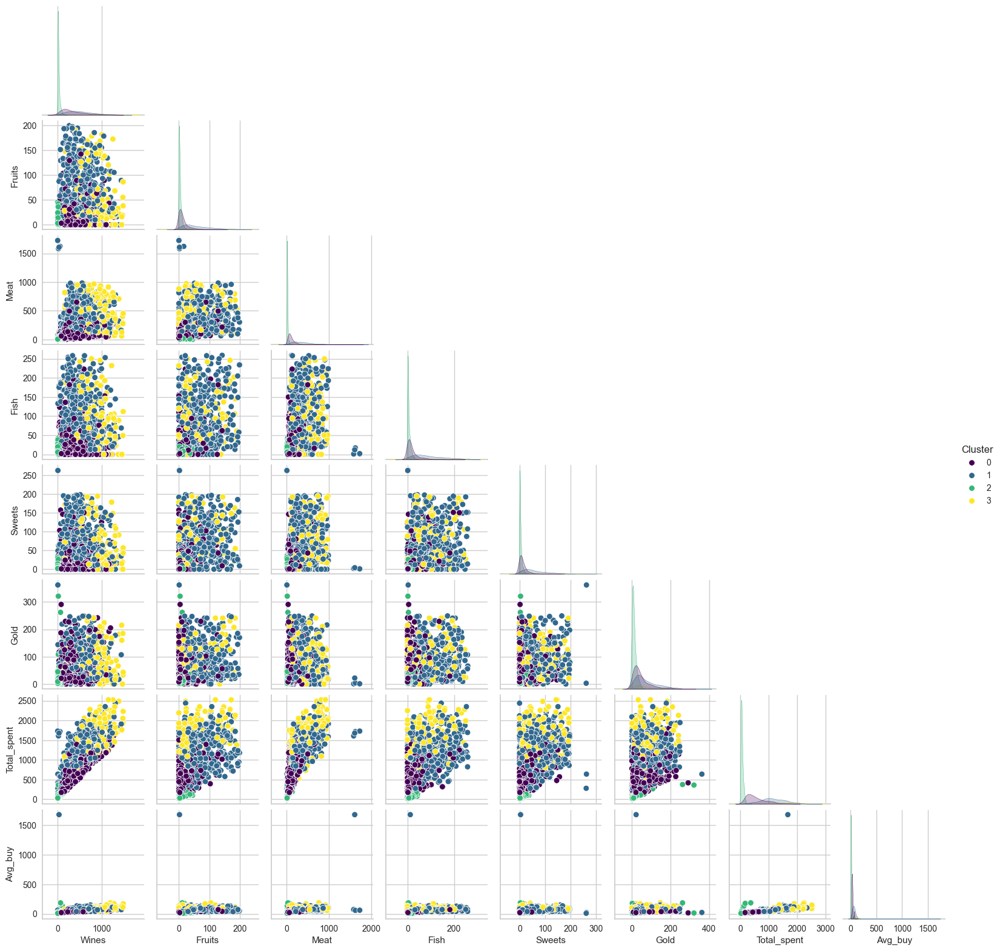

In [508]:
sns.pairplot(data[ products+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

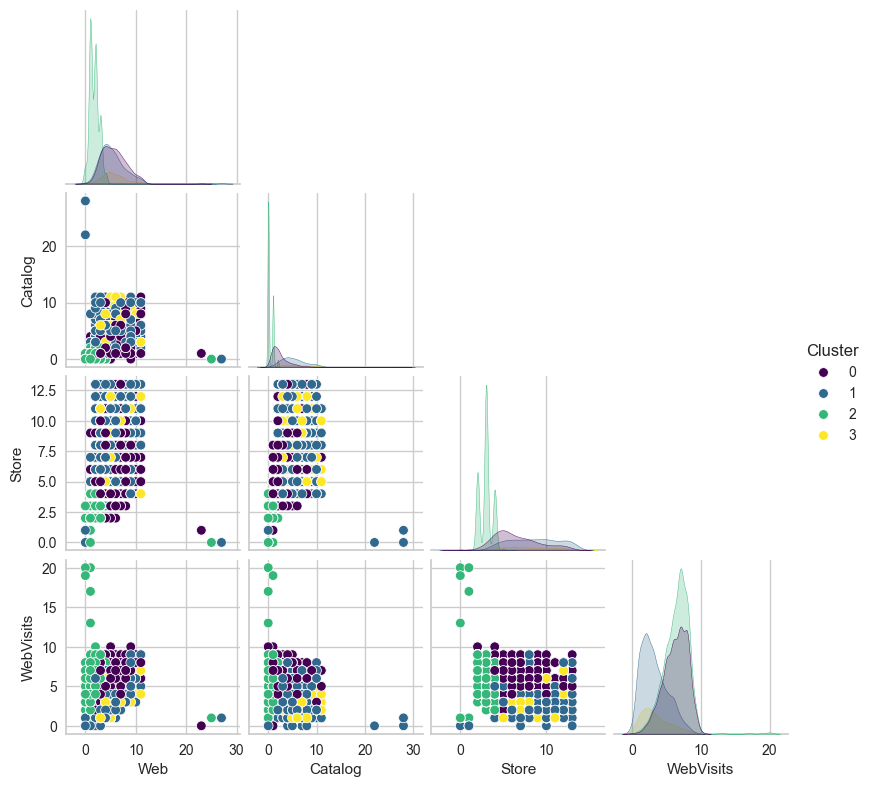

In [509]:
sns.pairplot(data[ place+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

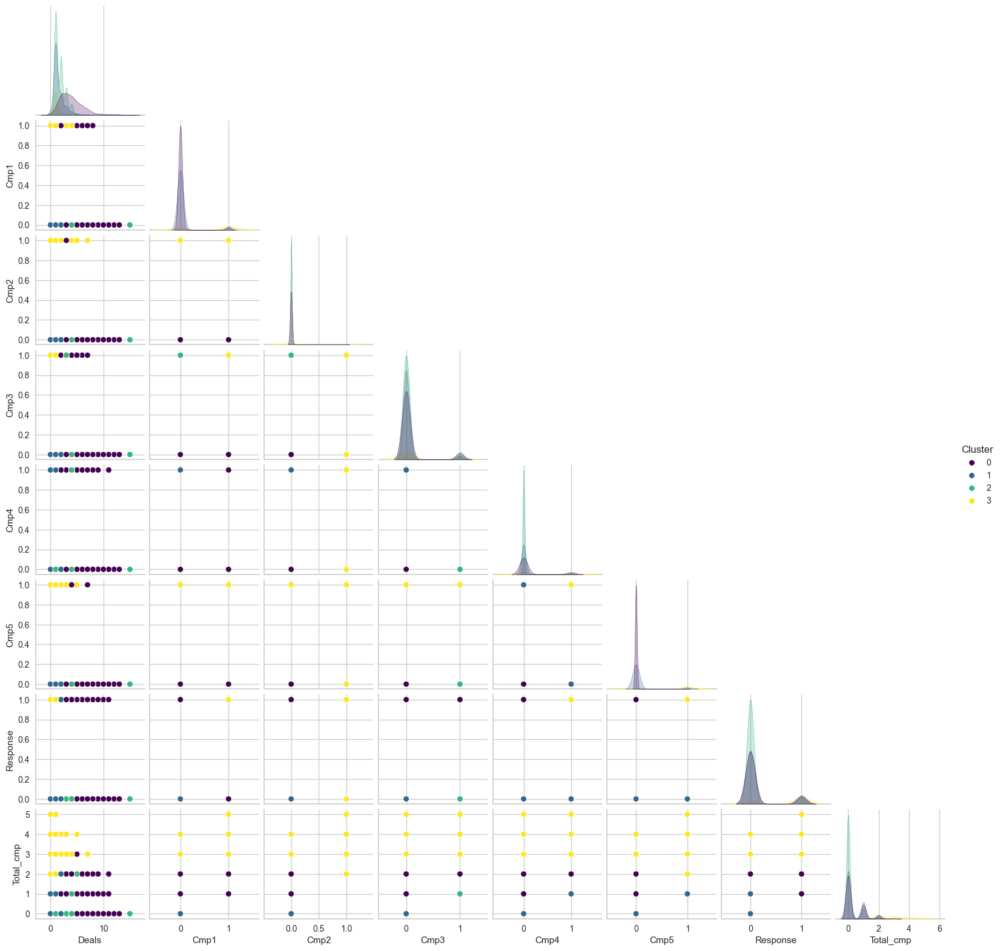

In [510]:
sns.pairplot(data[ promotion+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

##### Aglomerativo

In [511]:
data = df_agg_K4

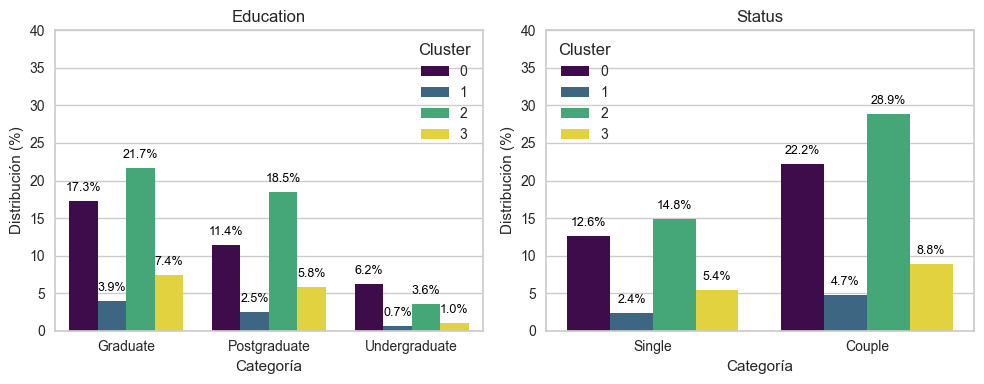

In [512]:
# Categoricas
# Configurar la figura con 1 fila y 2 columnas (ya que solo hay 2 variables)
fig, axes = plt.subplots(1, 2, figsize=(10, 4))

# Visualizar en los subgráficos
for idx, feature in enumerate(features_cat_list):  
    ax = axes[idx]  # Seleccionar el subgráfico correcto
    
    # Graficar el countplot con porcentaje
    sns.countplot(data= data, x=feature, ax=ax, hue='Cluster', palette="viridis", stat="percent")
    
    ax.set_title(f'{feature}')
    ax.set_xlabel('Categoría')
    ax.set_ylabel('Distribución (%)')
    ax.set_ylim(0, 40)  

    
    # Mostrar valores en el gráfico
    for p in ax.patches:
        height = p.get_height()
        if height > 0:  # Evitar etiquetas en barras sin datos
            ax.annotate(f'{height:.1f}%', 
                        (p.get_x() + p.get_width() / 2., height),
                        ha='center', va='bottom', fontsize=9, color='black', 
                        xytext=(0, 5), textcoords='offset points')  

plt.tight_layout()
plt.show()

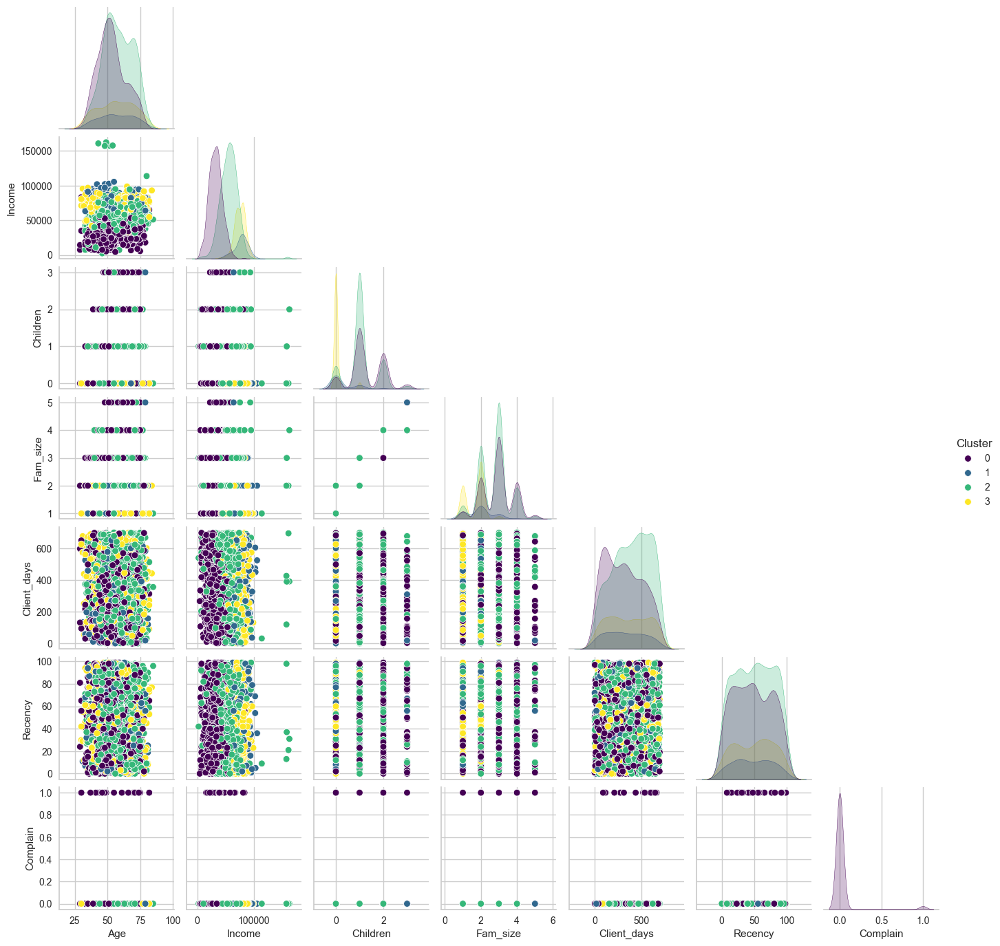

In [513]:
sns.pairplot(data[people + ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

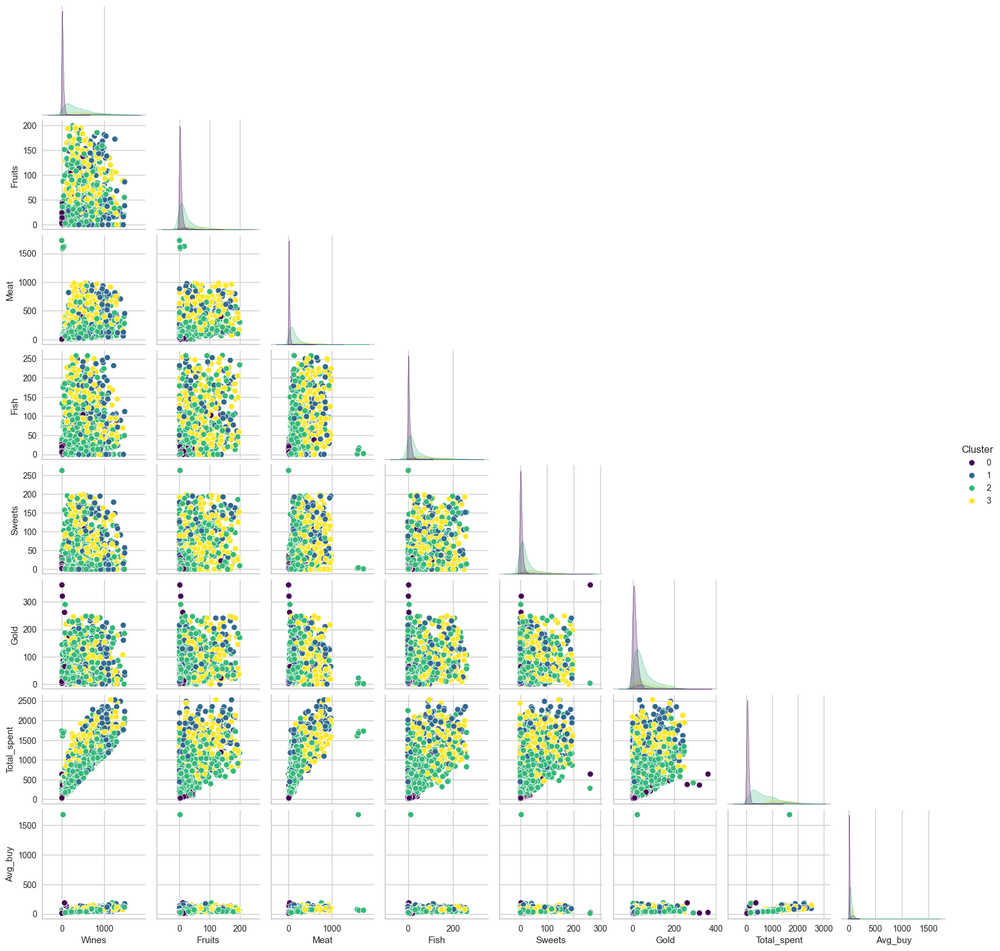

In [514]:
sns.pairplot(data[ products+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

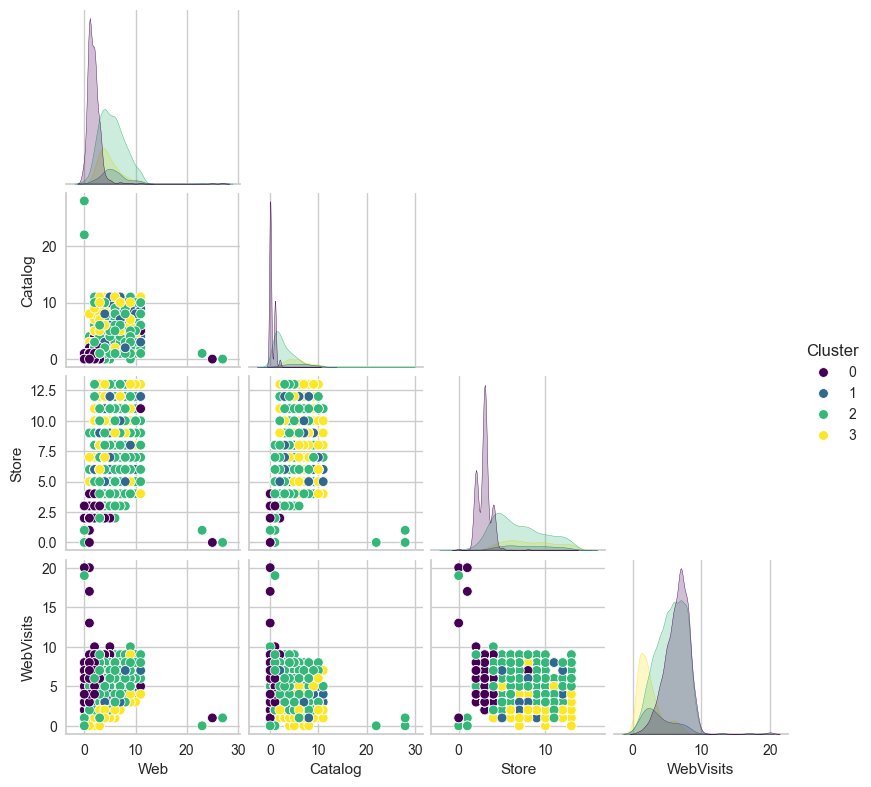

In [515]:
sns.pairplot(data[ place+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

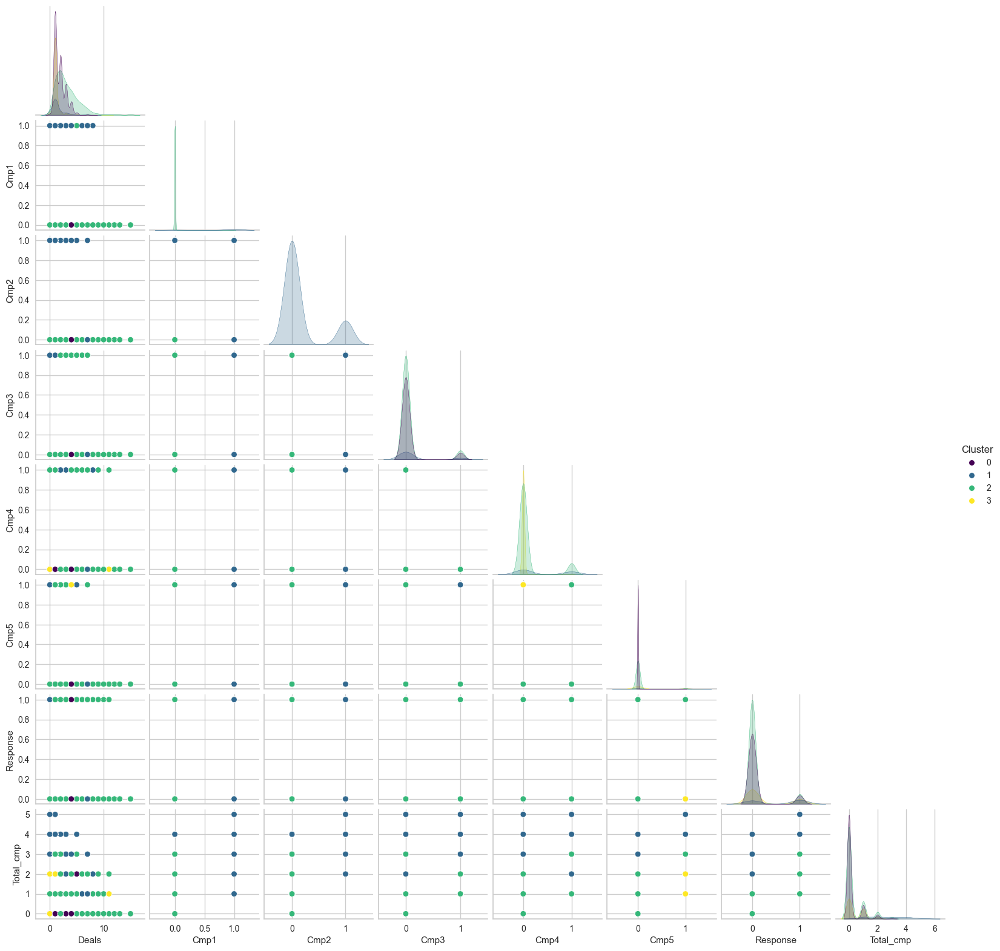

In [516]:
sns.pairplot(data[ promotion+ ["Cluster"]], diag_kind="kde", hue = "Cluster", palette="viridis", height=2, corner=True)

## Conclusion final y selección de modelo

Los cuatros modelos analizados clusterizan bien, aunque me quedaré con **Kmeans K=3** por ser el mas equilibrado:

- Mayor silhouette score
- Clusters bien definidos visualmente
- Segmentación útil y diferenciada en las variables (tanto numéricas como categóricas)
- Fácil de aplicar a nuevos datos (ventaja frente a aglomerativo)
- Menor riesgo de sobresegmentación que K=4

## Segementación de clientes (miniEDA)

Para definir cada cluster, se realizará a traves de la visualización de features

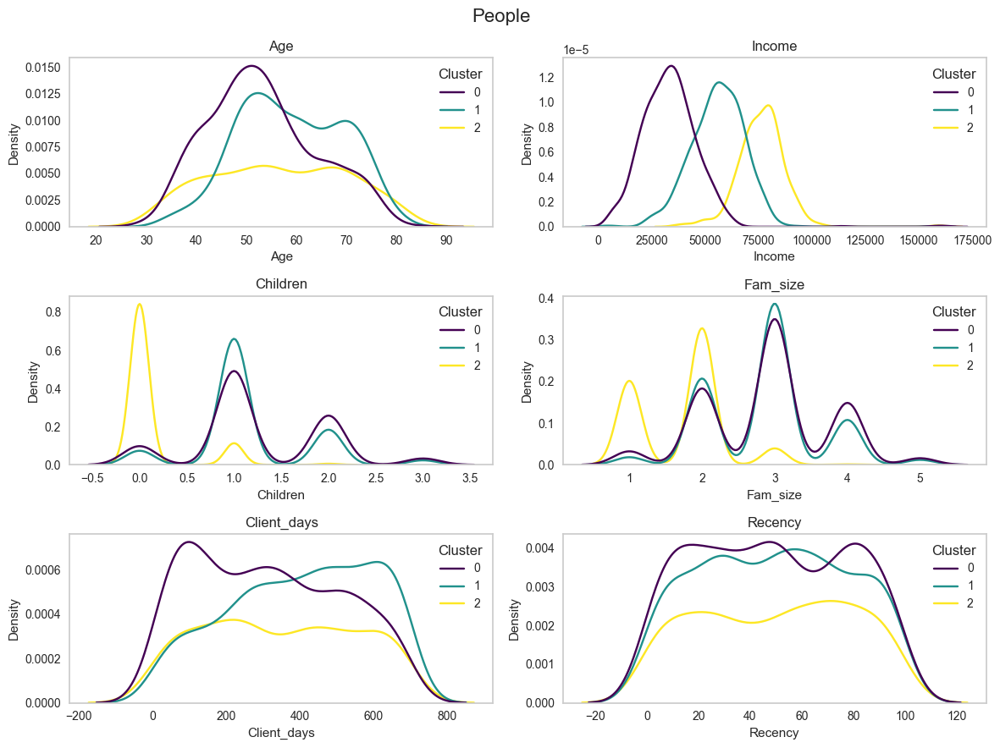

In [539]:
# people
features = numeric_people
palette = "viridis"

# Definir filas dinámicamente según la cantidad de features
n_features = len(features)
n_cols = 2  # Número fijo de columnas
n_rows = -(-n_features // n_cols)  # División redondeando hacia arriba

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 3 * n_rows))  
axes = axes.flatten()  

for i, feature in enumerate(features):
    sns.kdeplot(data=df_kmeans_K3, 
                x=feature, 
                hue="Cluster", 
                fill=False, 
                palette=palette, 
                ax=axes[i])
    axes[i].set_title(f'{feature}')
    axes[i].grid(False)

# Eliminar ejes vacíos si hay un número impar de features
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("People", fontsize=16)
plt.tight_layout()
plt.show()

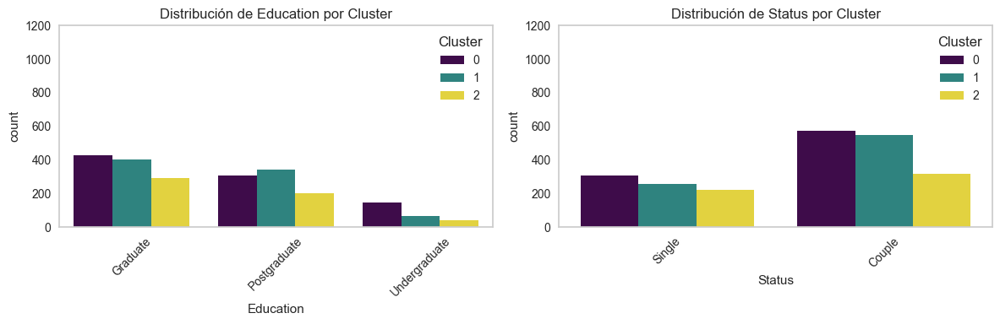

In [549]:
# people
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))  

for i, feature in enumerate(features_cat_list):
    sns.countplot(data=df_kmeans_K3, x=feature, hue="Cluster", palette=palette, ax=axes[i])
    axes[i].set_title(f'Distribución de {feature} por Cluster')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)
    axes[i].grid(False)
    axes[i].set_ylim(0, 1200)

plt.tight_layout()
plt.show()

**CLUSTER 0**
- AGE:          40-60
- INCOME:       low 
- CHILDREN:     1
- FAM SIZE:     3
- CLIENT_DAYS:  100
- RECENCY:      -
- EDUCATION:    graduated (undergraduated)
- STATUS:       couple

**CLUSTER 1**
- AGE:          50-75
- INCOME:       medium
- CHILDREN:     1
- FAM SIZE:     3
- CLIENT_DAYS:  600
- RECENCY:      -
- EDUCATION:    graduated (postgraduated)
- STATUS:       couple

**CLUSTER 2**
- AGE:          35-75
- INCOME:       high
- CHILDREN:     0
- FAM SIZE:     2
- CLIENT_DAYS:  200-600
- RECENCY:      -
- EDUCATION:    graduated
- STATUS:       couple(single)

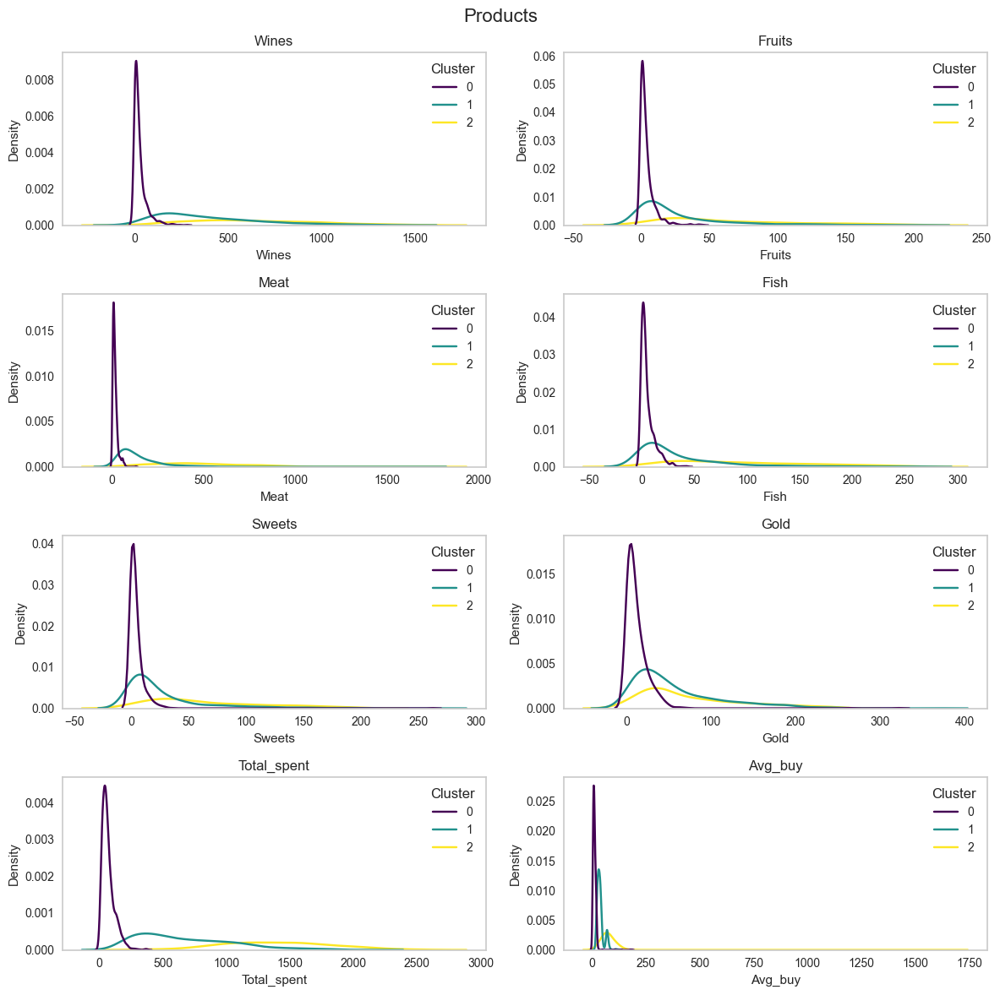

In [537]:
# products
features = products
palette = "viridis"

# Definir filas dinámicamente según la cantidad de features
n_features = len(features)
n_cols = 2  # Número fijo de columnas
n_rows = -(-n_features // n_cols)  # División redondeando hacia arriba

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 3 * n_rows))  
axes = axes.flatten()  

for i, feature in enumerate(features):
    sns.kdeplot(data=df_kmeans_K3, 
                x=feature, 
                hue="Cluster", 
                fill=False, 
                palette=palette, 
                ax=axes[i])
    axes[i].set_title(f'{feature}')
    axes[i].grid(False)

# Eliminar ejes vacíos si hay un número impar de features
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Products", fontsize=16)
plt.tight_layout()
plt.show()

**CLUSTER 0**
- INTEREST:     -
- TOTAL SPENT:  low
- AVG_BUY:      10

**CLUSTER 1**
- INTEREST:     -
- TOTAL SPENT:  medium
- AVG_BUY:      50

**CLUSTER 2**
- INTEREST:     wines, meat, fish
- TOTAL SPENT:  high
- AVG_BUY:      100

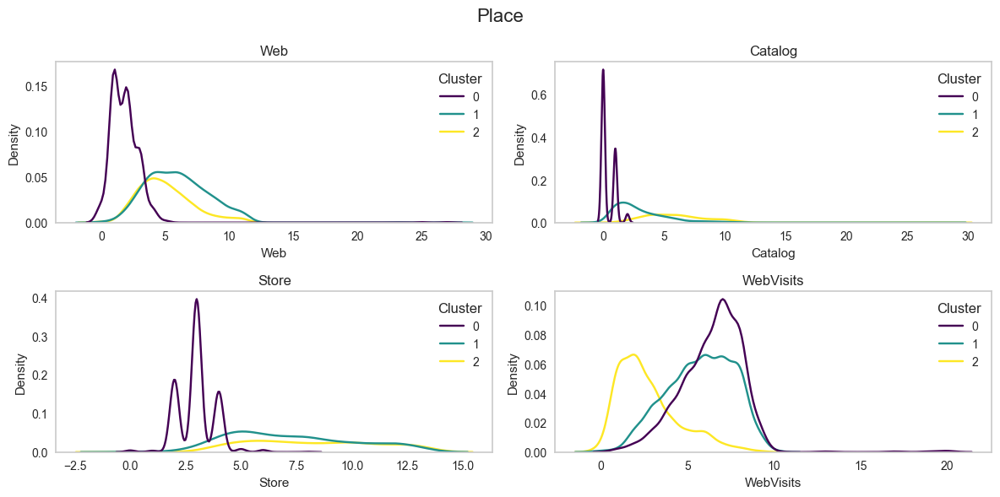

In [553]:
# place
features = place
palette = "viridis"

# Definir filas dinámicamente según la cantidad de features
n_features = len(features)
n_cols = 2  # Número fijo de columnas
n_rows = -(-n_features // n_cols)  # División redondeando hacia arriba

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 3 * n_rows))  
axes = axes.flatten()  

for i, feature in enumerate(features):
    sns.kdeplot(data=df_kmeans_K3, 
                x=feature, 
                hue="Cluster", 
                fill=False, 
                palette=palette, 
                ax=axes[i])
    axes[i].set_title(f'{feature}')
    axes[i].grid(False)

# Eliminar ejes vacíos si hay un número impar de features
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Place", fontsize=16)
plt.tight_layout()
plt.show()

**CLUSTER 0**
- WEB:          few (0-5)
- CATALOG:      few (0-3)
- STORE:        few (3)
- WEB VISITS:   high (8)

**CLUSTER 1**
- WEB:          high (4-6)
- CATALOG:      medium (2-3)
- STORE:        medium (5-10)
- WEB VISITS:   high (5-7)

**CLUSTER 2**
- WEB:          medium (4)
- CATALOG:      high (5)
- STORE:        high (6-12)
- WEB VISITS:   low (3)

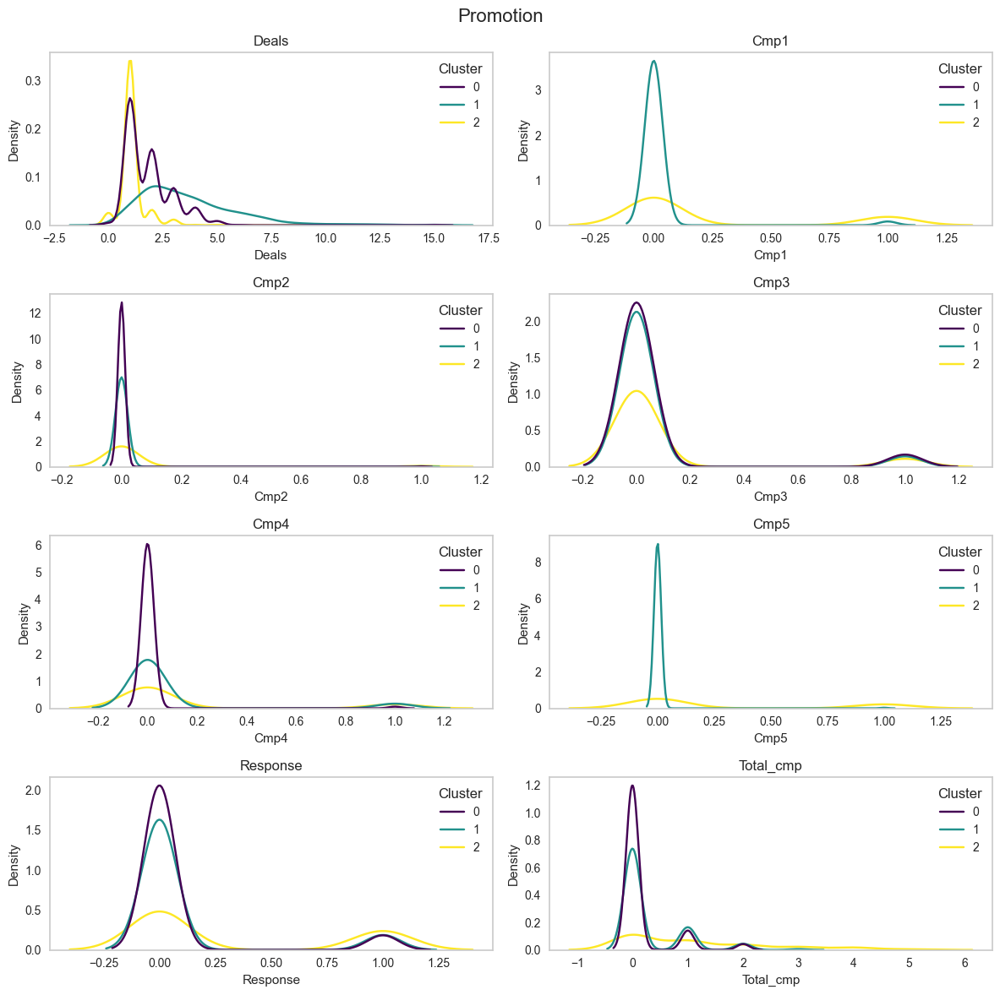

In [551]:
# promotion
features = promotion
palette = "viridis"

# Definir filas dinámicamente según la cantidad de features
n_features = len(features)
n_cols = 2  # Número fijo de columnas
n_rows = -(-n_features // n_cols)  # División redondeando hacia arriba

fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(12, 3 * n_rows))  
axes = axes.flatten()  

for i, feature in enumerate(features):
    sns.kdeplot(data=df_kmeans_K3, 
                x=feature, 
                hue="Cluster", 
                fill=False, 
                palette=palette, 
                ax=axes[i])
    axes[i].set_title(f'{feature}')
    axes[i].grid(False)

# Eliminar ejes vacíos si hay un número impar de features
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Promotion", fontsize=16)
plt.tight_layout()
plt.show()

**CLUSTER 0**
- DEALS:        low-medium
- CMP1:         -
- CMP2:         0
- CMP3:         acceppted
- CMP4:         0
- CMP5:         -
- RESPONSE:     worst 
- TOTAL_CMP:    worst

**CLUSTER 1**
- DEALS:        high
- CMP1:         -
- CMP2:         0
- CMP3:         acceppted
- CMP4:         good
- CMP5:         0
- RESPONSE:     medium 
- TOTAL_CMP:    medium

**CLUSTER 2**
- DEALS:        low
- CMP1:         good
- CMP2:         0
- CMP3:         Good
- CMP4:         Good
- CMP5:         Good
- RESPONSE:     Good response, better than other 
- TOTAL_CMP:    Good

## RESUMEN

Basándonos en las mas destacadas

**CLUSTER 0**
- Low spending
- Lower income
- Larger family
- Middle aged (40-60)
- New client
- Many visits to the website, but not to buy
- Doesn't respond to Marketing
- Slight interest in deals

**CLUSTER 1**
- Moderate spending
- Medium income
- old aged (50-75)
- old client
- Web shopping preference
- Slight Response to Marketing
- High interest in deals

**CLUSTER 2**
- High spending
- Higher income
- Small family
- Interest to wines, meat and fish product
- Catalog and store purchase preference 
- Good response to marketing
- Low interest in deals

### **Cluster 0: *Los Curiosos Digitales*: visitantes curiosos, compradores ocasionales**
#### Perfil Demográfico: 
- Adultos de mediana edad (40-60 años), con ingresos bajos y familias pequeñas (3 personas). 
- Son relativamente nuevos clientes (100 días en promedio) y la mayoría tiene estudios universitarios sin posgrado.

#### Patrón de Compra: 
- Gastan poco y realizan compras pequeñas (promedio de 10 por compra). 
- No muestran interés por productos específicos y sus compras son esporádicas. 
- Prefieren navegar por la web, pero sin comprar (muchas visitas, pero pocas compras en línea).

#### Tendencias y Oportunidades:
- Son clientes difíciles de fidelizar y no responden bien al marketing.
- Parecen más interesados en investigar productos que en comprarlos.
- Podrían responder mejor a campañas con descuentos o estrategias que los incentiven a realizar su primera compra.
- Las compras impulsivas o la facilidad de pago podrían motivarlos.

*Necesita incentivos para realizar su primera compra. Estrategias como descuentos iniciales o promociones flash pueden funcionar*



### **Cluster 1: *Cazadores de Ofertas*: Compradores online leales y sensibles a descuentos**
#### Perfil Demográfico: 
- Personas mayores (50-75 años), con ingresos medios. 
- Son clientes antiguos (600 días en promedio) con familias pequeñas (3 personas). 
- Tienen estudios superiores y suelen estar en pareja.

#### Patrón de Compra: 
- Gastan de manera moderada, con un ticket promedio de 50 por compra. No muestran interés en productos específicos, pero prefieren comprar online y responder a promociones. Su frecuencia de compra es media y utilizan distintos canales (web, catálogo y tienda).

#### Tendencias y Oportunidades:
- Son clientes leales, pero sensibles a ofertas y descuentos.
- La facilidad de compra en línea es clave para ellos.
- Podrían responder bien a programas de fidelización con recompensas progresivas.
- Campañas que combinen promociones con envíos gratuitos o descuentos exclusivos para clientes recurrentes podrían ser efectivas.

*Son clientes leales y compradores online frecuentes. Se pueden fidelizar con programas de descuentos progresivos o beneficios exclusivos*




### **Cluster 2: *Élite Exclusiva*: Compradores exclusivos, selectivos y de alto valor**
#### Perfil Demográfico: 
- Adultos entre 35 y 75 años con ingresos altos. Tienen familias muy pequeñas (2 personas) o viven solos. Son clientes con un historial de 200 a 600 días.

#### Patrón de Compra: 
- Gastan mucho y tienen un ticket promedio alto (100 por compra). Prefieren productos premium como vinos, carnes y pescados. Compran más en catálogo y tiendas físicas, con pocas visitas web.

#### Tendencias y Oportunidades:
- Son clientes valiosos con hábitos de compra definidos.
- Valoran la calidad y la exclusividad más que los descuentos.
- Estrategias de venta personalizadas y experiencias VIP pueden atraerlos.
- Podrían responder bien a recomendaciones de productos basadas en sus compras anteriores.

*Son clientes de alto valor que buscan calidad y exclusividad. La clave está en ofrecerles experiencias premium y recomendaciones personalizadas*